<h2> Company Profle </h2>

### Lending various types of loans to urban customers. Facilitating personal loans, business loans, and financing of medical procedures. Borrowers can easily access lower interest rate loans through a fast online interface. 

<h2> Objective </h2>

### Minimize the risk of losing money while lending to customers. Identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. Understand how consumer attributes and loan attributes influence the tendency of default.

<h2>Understanding Data Set </h2>

<img src=https://cdn.upgrad.com/UpGrad/temp/7afbce98-8ecc-41c6-96d8-981cba7d343f/Loan_image.png></img>

# Initial Hypothesis:


- Income of a borrower can lead him or her to default

- Installment cycle - per month installment , tenure of installment and interest rate can be a deciding factor if the borrower will default or not ?

- Job type can also play leading role in deciding the nature of borrower

- Economic Factors like - Inflation, Power and Energy Resources, Transportation, Prices of Goods and Services

    - Microeconomic Factors like - Level of Education, Maritial Status, Length of Employment, Gender, Previous Debts
    
    - Social Factors like - Materialism , Financial Awareness, Health Condition & Religious Beliefs

- Life Expectancy of a borrower also should have a relationship between borrowers who charge off/ default

- Other Source of Income in family can also have implications over borrowers to default

- Earner to Total Family member ratio can also affect borrowers to default or not . If there is a single earner and many family members, the whole family responsibility of daily living of his or her family is on him or her. Hence he or she is not fit to contirbute major chunk of his salary or income as installment. That is, as the number of dependents increases the responsibility also increases. As a result the income that is supposed to be used for loan repayment would be used for the provision of social and economic needs and hence the probability of not repaying loan on time (defaulting) increases all things being equal 

- Number of Pre-Existing Loans can also determine whether he or she be able to meet timely pay of the Loan EMI or not !

- Loan diversion can lead to loan default. If a borrower diverts loan received for productive investment to undertake unproductive investment, no income will be generated and this is more likely to make loan repayment difficult.

- If the loans department the officers do not take a careful study of the applicants to ensure that he/she has a sound financial base such that the risk of loss is mitigated in case of default, then a borrower can default.



In [1]:
#Importing Important Libraries 
import scipy.stats as stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy
from gensim.parsing.preprocessing import remove_stopwords
from wordcloud import WordCloud,STOPWORDS
import re
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime
from dateutil import parser
import jovian

In [2]:
pd.set_option('display.max_column',500)
pd.set_option('display.max_row',150)
sns.set(style = "darkgrid")
sns.set_context("talk")

In [3]:
#Reading Data
data=pd.read_csv('loan.csv',low_memory=False)

In [4]:
#Function to Create Meta Data of the data
def Create_Meta(data):
    meta_data={'dtypes':data.dtypes,'missing_values':round(data.isna().sum()*100/data.shape[0],3),
           'count':[data[i].count() for i in data.columns.values],'No_Unique':[data[i].nunique() for i in data.columns.values]}
    return pd.DataFrame(meta_data)

In [5]:
Meta_Data=Create_Meta(data)

In [6]:
#Display Meta Data of our Data
Meta_Data.T

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
dtypes,int64,int64,int64,int64,float64,object,object,float64,object,object,object,object,object,float64,object,object,object,object,object,object,object,object,object,object,float64,int64,object,int64,float64,float64,int64,int64,int64,object,int64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,float64,object,object,float64,float64,int64,object,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
missing_values,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.191,2.707,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.581,0.0,0.028,0.0,0.0,0.0,0.0,0.0,0.0,64.662,92.985,0.0,0.0,0.0,0.126,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.179,0.0,97.13,0.005,0.141,100.0,0.0,0.0,100.0,100.0,100.0,0.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,0.141,0.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,1.755,0.098,100.0,100.0,100.0,100.0
count,39717,39717,39717,39717,39717,39717,39717,39717,39717,39717,37258,38642,39717,39717,39717,39717,39717,39717,39717,26777,39717,39706,39717,39717,39717,39717,39717,39717,14035,2786,39717,39717,39717,39667,39717,39717,39717,39717,39717,39717,39717,39717,39717,39717,39717,39646,39717,1140,39715,39661,0,39717,39717,0,0,0,39717,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,39661,39717,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,39020,39678,0,0,0,0
No_Unique,39717,39717,885,1041,8205,2,371,15383,7,35,28820,11,5,5318,3,55,3,1,39717,26527,14,19615,823,50,2868,11,526,9,95,111,40,5,21711,1089,82,1,1137,1138,37850,37518,7976,35148,1356,4040,2616,101,34930,2,106,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,0,0,0,0


### Exploring, understanding and Identifying anomalies like - formatting errors & Incorrect data type

In [7]:
#Identifying to 5 missing values percentage
Meta_Data['missing_values'].value_counts(normalize=True).head(5)

100.000    0.486486
0.000      0.387387
0.141      0.018018
6.191      0.009009
2.707      0.009009
Name: missing_values, dtype: float64

- We have unique id for each record no duplicates , same goes for member_id. No member_id has reoccurred.
- We see that there are many columns which have 0% missing values but there is no variation in data as there is a single unique value in those column. Ideally they would not be of any significance, so we should considor to drop them - we can not test it since there won't be any proportion apart from 100%:0%
- We see that there are columns which have 0 count and 0 number of unique values which confirms that there are 100% missing values in the column
- There are around 49% of the columns which have 100% missing values

In [8]:
#Dropping Columns which have 100% Missing Values
drop_Cols=Meta_Data[Meta_Data['missing_values']==100].index.values
data.drop(drop_Cols,axis=1,inplace=True)

In [9]:
#Dropping Columns having Single Unique Value
Single_unique_cols=Meta_Data[Meta_Data['No_Unique']==1].index.values
data.drop(Single_unique_cols,axis=1,inplace=True)

In [10]:
data.shape

(39717, 48)

Finding the threshold for removing columns with x% missing value

In [11]:
Meta_Data=Create_Meta(data)

In [12]:
Meta_Data[Meta_Data['missing_values']>=50]

,dtypes,missing_values,count,No_Unique
mths_since_last_delinq,float64,64.662,14035,95
mths_since_last_record,float64,92.985,2786,111
next_pymnt_d,object,97.130,1140,2


We need to study the data to see if there missing values have some meaning associated with it or they are simple plain missing values. It is quite possible for next_payment_date that the loans are already paid that is why there are no dates available.For mnths_since_last_delinq , customers might not have had any previous deliquency  . We will explore this after we prepare the data

In [13]:
#Summary data
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,38.0,NaN,15,0,27783,53.90%,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,Jun-16,May-16,0.0


After looking at the data we need to find out certain key aspects if the relationship exists or not of variabe with the propensity of a borrower to default:

- Does a borrower defaults if funded amount is greater than the average funding amount

- Does a borrower defaults if interest rates are higher than average interest rate

- Do borrowers defaults who have high installments.

- Do emp_length of a borrower affect borrower to default?

- Do type of home ownership have any affect on borrower to default.

- Do high dti determines if a borrower will default or not ?

In [14]:
#Removing Months from Term
data.loc[:,'term']=data['term'].map(lambda x:x.split(' ')[1])
data.loc[:,'int_rate']=data['int_rate'].map(lambda x:x.split('%')[0])


In [15]:
#Fetching Loan ID
data.loc[:,'url']=data.loc[:,'url'].map(lambda x:x.lower())
data.loc[:,'loan_id']=data['url'].map(lambda x:x.split('loan_id=')[1])

In [16]:
#Number of unique loan id
data.loc[:,'loan_id'].nunique()

39717

There are all unique loan ids, no loan id has been repeated twice

In [17]:
#In the desc column - we found at multiple rows there were repetition of sentences
#We aim to enrich the data to identify key indicators from the text data which lead to increase the risk of losing the money lended
data.loc[data[data['desc'].isnull()==False].index.values,'desc']=data.loc[data[data['desc'].isnull()==False].index.values,'desc'].map(lambda x:x.lower())
data.loc[data[data['desc'].isnull()==False].index.values,'desc']=data.loc[data[data['desc'].isnull()==False].index.values,'desc'].map(lambda x:x.split('<br>')[0])

In [18]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,loan_id
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loandetail.acti...,borrower added on 12/22/11 > i need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,1077501
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loandetail.acti...,borrower added on 12/22/11 > i plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,1077430
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loandetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,1077175
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loandetail.acti...,borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,1076863
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loandetail.acti...,borrower added on 12/21/11 > i plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,38.0,NaN,15,0,27783,53.90%,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,Jun-16,May-16,0.0,1075358


In [19]:
#Converting emp_title to lower case
data.loc[data[data['emp_title'].isna()==False].index.values,'emp_title']=data.loc[data[data['emp_title'].isna()==False].index.values,'emp_title'].map(lambda x:x.lower())

In [20]:
data['emp_title'].value_counts()

us army                              210
bank of america                      137
walmart                               81
at&t                                  79
kaiser permanente                     69
                                    ... 
far niente winery inc                  1
tobyhanna army depot                   1
community college of philadelphia      1
lee county sheriff                     1
evergreen center                       1
Name: emp_title, Length: 27443, dtype: int64

In [21]:
#There are certain values in emp_title which are rare , i.e there frequency of occurence is very 
Others_empTitle=data['emp_title'].value_counts()[data['emp_title'].value_counts()<=1].index.values

In [22]:
len(Others_empTitle)

24029

There are 24029 peope who have rarest employee title, which general population does not have, i.e that those employe titles are uncommon and each of them have a unique. Hence for each of these we would like to explore there likeliness to increase the risk.

In [23]:
#Value Counts of type of home ownership
data['home_ownership'].value_counts()

RENT        18899
MORTGAGE    17659
OWN          3058
OTHER          98
NONE            3
Name: home_ownership, dtype: int64

There are only 3 people who have None Category of home ownership, let us club it with OTHER

In [24]:
#FInding Index of NONE category in howme_ownership column
index_Ownership=data['home_ownership'][data['home_ownership']=="NONE"].index.values
data['home_ownership'].iloc[index_Ownership]="OTHER"

In [25]:
data['home_ownership'].value_counts()

RENT        18899
MORTGAGE    17659
OWN          3058
OTHER         101
Name: home_ownership, dtype: int64

In [26]:
#converting issue date to lower case
data['issue_d']=data['issue_d'].map(lambda x:x.lower())

In [27]:
#converting title to lower case
data['title'][data[data['title'].isna()==False].index.values]=data['title'][data[data['title'].isna()==False].index.values].map(lambda x: x.lower())

In [28]:
data['title'].value_counts()

debt consolidation                3082
debt consolidation loan           1866
personal loan                      986
consolidation                      737
home improvement                   543
                                  ... 
bilco                                1
vacation load                        1
toyota celica                        1
borrowing to expand investment       1
jal loan                             1
Name: title, Length: 17674, dtype: int64

In [29]:
#Identifying people with unique titles
len(data['title'].value_counts()[data['title'].value_counts()==1])

15752

There are 15752 unique categories in the title column , which means they are the rarest , not many take loan for those titles. Hence since they are the rarest we would need to further investigate these

In [30]:
#Converting Zipcode Lowercase
data['zip_code']=data['zip_code'].map(lambda x:x.lower())

In [31]:
data['earliest_cr_line']=data['earliest_cr_line'].map(lambda x:x.lower())

In [32]:
#Removing % from the column values
data['revol_util'][data['revol_util'].isna()==False]=data['revol_util'][data['revol_util'].isna()==False].map(lambda x:x.split('%')[0])

In [33]:
#Rounding off to precision
data['total_pymnt']=np.round(data['total_pymnt'],2)

In [34]:
#Converting last_credit_pull_d to lower case
data.loc[data[data['last_credit_pull_d'].isna()==False].index.values,'last_credit_pull_d']=data.loc[data[data['last_credit_pull_d'].isna()==False].index.values,'last_credit_pull_d'].map(lambda x:x.lower())

In [35]:
#Identify any ambiguous data point
data['pub_rec_bankruptcies'].value_counts(normalize=True)

0.0    0.956920
1.0    0.042901
2.0    0.000179
Name: pub_rec_bankruptcies, dtype: float64

There are 95% of people who have 0 public records of bankruptcies and there are only .02% of people who has 2 records of bankcruptcies twice . We need to investigate further on the people who have past record of bankcruptcies

In [36]:
#Value count of loan status
data['loan_status'].value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [37]:
#Cummulative sum of loan status
data['loan_status'].value_counts().cumsum()

Fully Paid     32950
Charged Off    38577
Current        39717
Name: loan_status, dtype: int64

In [38]:
print("Out of total completed period/tenure of loan including charged off loans - as loans are charged off when for x consicutive of period customer fails to pay back the loan or his or her tenure is over and he or she has not paid part of loan, the {0}% of customers paid off the loan \n ".format(round(32950/38577,2)))

print("Out of total completed period/tenure of loan including charged off loans - as loans are charged off when for x consicutive of period customer fails to pay back the loan or his or her tenure is over and he or she has not paid part of loan, the {0}% of customers defaulted".format(round(1-round(32950/38577,2),2)))

Out of total completed period/tenure of loan including charged off loans - as loans are charged off when for x consicutive of period customer fails to pay back the loan or his or her tenure is over and he or she has not paid part of loan, the 0.85% of customers paid off the loan 
 
Out of total completed period/tenure of loan including charged off loans - as loans are charged off when for x consicutive of period customer fails to pay back the loan or his or her tenure is over and he or she has not paid part of loan, the 0.15% of customers defaulted


In [39]:
data['loan_status'].value_counts(normalize=True)

Fully Paid     0.829620
Charged Off    0.141677
Current        0.028703
Name: loan_status, dtype: float64

**Loan Status seems to be the objective column, we can see that major percentage of customers have fully paid, 14% were the bad loans , i.e it customers who defaulted. And approximately 3% people are in the risk area , that is their loan period is ongoing and off it 15% chance is there that customer can default. That is there is a chance of 171 customers off 1140 have higher chance to default**

In [40]:
#Extracting Dates
def regex(i):
    try:
        x=re.search(r'\d{2}/\d{2}/\d{2}', i)
        return x.group()
    except:
        return np.nan
    

In [41]:
#Extract Dates from description column
data.loc[data[data['desc'].isnull()==False].index.values,'desc']=data.loc[data[data['desc'].isnull()==False].index.values,'desc'].map(lambda x:regex(x))

In [42]:
#Convert to Date and Time
data['desc']=pd.to_datetime(data['desc'])

In [43]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,loan_id
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,dec-11,Fully Paid,https://lendingclub.com/browse/loandetail.acti...,2011-12-22,credit_card,computer,860xx,AZ,27.65,0,jan-85,1,NaN,NaN,3,0,13648,83.70,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,may-16,0.0,1077501
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,ryder,< 1 year,RENT,30000.0,Source Verified,dec-11,Charged Off,https://lendingclub.com/browse/loandetail.acti...,2011-12-22,car,bike,309xx,GA,1.00,0,apr-99,5,NaN,NaN,3,0,1687,9.40,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,sep-13,0.0,1077430
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,dec-11,Fully Paid,https://lendingclub.com/browse/loandetail.acti...,NaT,small_business,real estate business,606xx,IL,8.72,0,nov-01,2,NaN,NaN,2,0,2956,98.50,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,may-16,0.0,1077175
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,air resources board,10+ years,RENT,49200.0,Source Verified,dec-11,Fully Paid,https://lendingclub.com/browse/loandetail.acti...,2011-12-21,other,personel,917xx,CA,20.00,0,feb-96,1,35.0,NaN,10,0,5598,21,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,apr-16,0.0,1076863
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,university medical group,1 year,RENT,80000.0,Source Verified,dec-11,Current,https://lendingclub.com/browse/loandetail.acti...,2011-12-21,other,personal,972xx,OR,17.94,0,jan-96,0,38.0,NaN,15,0,27783,53.90,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,Jun-16,may-16,0.0,1075358


In [44]:
#Converting lower case
data['last_pymnt_d']=data['last_pymnt_d'].str.lower()

In [45]:
#Missing Values Percentage
round(data.isna().sum()*100/data.shape[0],2)

id                          0.00
member_id                   0.00
loan_amnt                   0.00
funded_amnt                 0.00
funded_amnt_inv             0.00
term                        0.00
int_rate                    0.00
installment                 0.00
grade                       0.00
sub_grade                   0.00
emp_title                   6.19
emp_length                  2.71
home_ownership              0.00
annual_inc                  0.00
verification_status         0.00
issue_d                     0.00
loan_status                 0.00
url                         0.00
desc                       46.84
purpose                     0.00
title                       0.03
zip_code                    0.00
addr_state                  0.00
dti                         0.00
delinq_2yrs                 0.00
earliest_cr_line            0.00
inq_last_6mths              0.00
mths_since_last_delinq     64.66
mths_since_last_record     92.99
open_acc                    0.00
pub_rec   

There is a reason why next payment date column has 97% missing data. It is because there are only approximately 3% customers whose loan status is current. So we can impute the value with 0. **[0]**

In [46]:
data['loan_status'].value_counts(normalize=True)*100

Fully Paid     82.961956
Charged Off    14.167737
Current         2.870307
Name: loan_status, dtype: float64

In [47]:
#Dropping URL 
data.drop('url',axis=1,inplace=True)

In [48]:
data.dtypes

id                                  int64
member_id                           int64
loan_amnt                           int64
funded_amnt                         int64
funded_amnt_inv                   float64
term                               object
int_rate                           object
installment                       float64
grade                              object
sub_grade                          object
emp_title                          object
emp_length                         object
home_ownership                     object
annual_inc                        float64
verification_status                object
issue_d                            object
loan_status                        object
desc                       datetime64[ns]
purpose                            object
title                              object
zip_code                           object
addr_state                         object
dti                               float64
delinq_2yrs                       

In [49]:
#Data type conversions
data['funded_amnt_inv']=data['funded_amnt_inv'].astype('float64')
data['revol_util']=data['revol_util'].astype('float64')


### Understanding Missing Data Pattern and Treating

In [50]:
#Employee title value counts
data['emp_title'].value_counts()

us army                              210
bank of america                      137
walmart                               81
at&t                                  79
kaiser permanente                     69
                                    ... 
far niente winery inc                  1
tobyhanna army depot                   1
community college of philadelphia      1
lee county sheriff                     1
evergreen center                       1
Name: emp_title, Length: 27443, dtype: int64

In [51]:
#Finding Pattern in data where employee title is missing
round(data[data['emp_title'].isna()==True].describe(),2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
count,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,838.00,231.00,2459.00,2459.00,2459.00,2455.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2459.00,2416.00
mean,695990.73,868133.33,10455.17,10181.34,9781.65,306.28,65423.13,12.14,0.13,0.88,35.43,78.86,8.58,0.08,12568.80,43.92,20.95,48.81,48.71,10820.70,10406.11,8740.75,1959.48,1.74,118.73,20.33,2159.24,0.07
std,209239.55,259442.78,7955.96,7611.29,7545.68,228.32,57878.11,6.92,0.45,1.12,22.54,40.67,4.45,0.27,17970.01,29.60,11.57,361.95,361.27,9227.28,9115.90,7345.69,2544.31,8.19,760.79,233.56,4366.97,0.25
min,54734.00,80364.00,500.00,500.00,0.00,15.69,4200.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,521973.50,674772.50,4800.00,4800.00,4212.50,141.21,32002.00,6.52,0.00,0.00,17.00,72.00,5.00,0.00,2665.50,17.85,12.00,0.00,0.00,4281.43,3928.31,3423.19,497.72,0.00,0.00,0.00,170.40,0.00
50%,684239.00,873584.00,8000.00,8000.00,7800.00,242.62,50000.00,11.66,0.00,1.00,33.00,95.00,8.00,0.00,7044.00,42.00,19.00,0.00,0.00,7956.42,7548.31,6400.00,1036.71,0.00,0.00,0.00,376.23,0.00
75%,846582.50,1055494.50,14987.50,14125.00,13539.56,412.99,78000.00,17.52,0.00,1.00,50.00,107.00,11.00,0.00,14806.50,68.60,27.00,0.00,0.00,14824.95,14237.77,12000.00,2350.42,0.00,0.00,0.00,1781.30,0.00
max,1077501.00,1313524.00,35000.00,35000.00,35000.00,1302.69,720000.00,29.92,5.00,8.00,83.00,119.00,35.00,2.00,146762.00,99.90,77.00,5097.81,5097.81,56662.59,56622.12,35000.00,21662.59,130.47,19915.67,6972.59,28981.20,1.00


Now when we see data for the customers who has emp_title as NAN, we notice following :

- the statistical inferences of loan amount and funded amount is similar apart from mean and standard deviation . It states that most people have got loan of amount they reuired , but since standard deviation and mean of funded amount is lesser than loan amount mean, it states there are section of people who have not got loan amount which they asked for , they got lesser than what they have asked.
- People were promissed loan of lesser amount initially , we can compare funded amount inv and funded amount
- 75% of the customers did not have any deliquency in last 2 years.
- 75% of customers had made max of 1 inquiry in last 6 months.
- There are customers who have not had any deliquency, also there are 75% of customers who deliquency 50 months before , i.e 3 years
- Not many customers had record of bankruptcies

In [52]:
#Employee title wise mean funded amount
emp_title_famnt_mean=pd.DataFrame(data.groupby('emp_title')['funded_amnt'].mean().sort_values(ascending=True))

In [53]:
emp_title_famnt_mean[(emp_title_famnt_mean['funded_amnt']<=13000)&(emp_title_famnt_mean['funded_amnt']>=8000)]

,funded_amnt
emp_title,
university center at princeton,8000.0
dr.joseph stan,8000.0
moodys corporation,8000.0
leesville auto,8000.0
advanced sports medicine,8000.0
...,...
marwaha group inc,13000.0
christus saint vincent medical center,13000.0
beasley broadcasting,13000.0


In [54]:
data['emp_title'].mode()

0    us army
dtype: object

In [55]:
round(data[data['emp_title']=='us army'].describe(),2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
count,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,93.00,8.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,210.00,207.00
mean,711799.40,890425.62,12602.62,12172.50,11688.44,353.17,65810.86,14.94,0.17,0.98,38.31,65.62,7.92,0.02,12087.90,52.26,21.49,30.69,30.59,13692.09,13133.61,10858.26,2729.76,2.33,101.74,14.42,3935.37,0.02
std,190102.48,235009.48,8516.66,8098.82,7935.97,232.39,27299.70,6.66,0.44,1.19,22.13,54.48,3.93,0.15,12493.93,29.38,11.39,234.85,234.40,10377.88,10111.05,8171.95,3029.05,9.64,495.98,112.58,6257.39,0.15
min,179020.00,178968.00,1600.00,1600.00,0.00,48.86,20400.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,3.00,0.00,0.00,901.86,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,582484.50,748681.75,5525.00,5525.00,5243.75,170.84,48000.00,10.58,0.00,0.00,20.00,0.00,5.00,0.00,3518.25,28.65,13.00,0.00,0.00,5276.49,5204.27,4088.69,603.83,0.00,0.00,0.00,257.86,0.00
50%,693910.00,884747.50,10000.00,10000.00,9750.00,297.35,61446.00,15.70,0.00,1.00,33.00,100.00,7.00,0.00,9604.00,56.45,19.00,0.00,0.00,10553.10,10329.48,9004.69,1369.24,0.00,0.00,0.00,1037.87,0.00
75%,850198.25,1061979.00,19481.25,17743.75,17293.75,495.25,75450.00,20.20,0.00,2.00,57.00,106.00,10.00,0.00,17139.25,75.00,29.00,0.00,0.00,21553.56,19821.14,15000.00,4079.34,0.00,0.00,0.00,4472.28,0.00
max,1067473.00,1301868.00,35000.00,35000.00,35000.00,1252.56,190000.00,29.65,3.00,6.00,80.00,111.00,24.00,1.00,97952.00,99.80,63.00,2398.86,2398.86,45869.38,45091.86,35000.00,17704.04,96.82,4516.80,1381.45,35322.60,1.00


The highest fequency of category for emp_title column is us army. Its distribution is also similar the distribution of different variables where employee title were missing. So it will be valid enough to replace nans with us army

In [56]:
#Missing Data Imputation
data['pub_rec_bankruptcies'].replace(np.NAN,data['pub_rec_bankruptcies'].mode()[0],inplace=True)
data['last_credit_pull_d'].replace(np.NAN,data['last_credit_pull_d'].mode()[0],inplace=True)
data['last_pymnt_d'].replace(np.NAN,data['last_pymnt_d'].mode()[0],inplace=True)
data.drop('mths_since_last_record',axis=1,inplace=True)
data['revol_util'].replace(np.NAN,data['revol_util'].median(),inplace=True)
data['title'].replace(np.NAN,data['title'].mode()[0],inplace=True)
data['emp_title'].replace(np.NAN,'us army',inplace=True)
data['emp_length'].replace(np.NAN,data['emp_length'].mode()[0],inplace=True)

In [57]:
#Missing Value Percentages
round(data.isna().sum()*100/data.shape[0],2)

id                          0.00
member_id                   0.00
loan_amnt                   0.00
funded_amnt                 0.00
funded_amnt_inv             0.00
term                        0.00
int_rate                    0.00
installment                 0.00
grade                       0.00
sub_grade                   0.00
emp_title                   0.00
emp_length                  0.00
home_ownership              0.00
annual_inc                  0.00
verification_status         0.00
issue_d                     0.00
loan_status                 0.00
desc                       46.84
purpose                     0.00
title                       0.00
zip_code                    0.00
addr_state                  0.00
dti                         0.00
delinq_2yrs                 0.00
earliest_cr_line            0.00
inq_last_6mths              0.00
mths_since_last_delinq     64.66
open_acc                    0.00
pub_rec                     0.00
revol_bal                   0.00
revol_util

In [58]:
#Dropping Columns
data.drop(['mths_since_last_delinq','desc'],axis=1,inplace=True)


In [59]:
#Replacing NaN to 0 because it is not a missing value , there can not be next payment date for those whose tenure is over or have been charged off - refer point [0]
data['next_pymnt_d'].replace(np.NaN,0,inplace=True)

### Understanding and Treating Outliers

In [60]:
#Selecting numeric data
data.select_dtypes(['int64','float64'])

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,162.87,24000.0,27.65,0,1,3,0,13648,83.7,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,171.62,0.0
1,1077430,1314167,2500,2500,2500.0,59.83,30000.0,1.00,0,5,3,0,1687,9.4,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0
2,1077175,1313524,2400,2400,2400.0,84.33,12252.0,8.72,0,2,2,0,2956,98.5,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,649.91,0.0
3,1076863,1277178,10000,10000,10000.0,339.31,49200.0,20.00,0,1,10,0,5598,21.0,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0
4,1075358,1311748,3000,3000,3000.0,67.79,80000.0,17.94,0,0,15,0,27783,53.9,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,78.42,110000.0,11.33,0,0,13,0,7274,13.1,40,0.00,0.00,2822.97,1213.88,2500.00,322.97,0.00,0.00,0.00,80.90,0.0
39713,90665,90607,8500,8500,875.0,275.38,18000.0,6.40,1,1,6,0,8847,26.9,9,0.00,0.00,9913.49,1020.51,8500.00,1413.49,0.00,0.00,0.00,281.94,0.0
39714,90395,90390,5000,5000,1325.0,156.84,100000.0,2.30,0,0,11,0,9698,19.4,20,0.00,0.00,5272.16,1397.12,5000.00,272.16,0.00,0.00,0.00,0.00,0.0
39715,90376,89243,5000,5000,650.0,155.38,200000.0,3.72,0,0,17,0,85607,0.7,26,0.00,0.00,5174.20,672.66,5000.00,174.20,0.00,0.00,0.00,0.00,0.0


In [61]:
#Function to treat outliers
def outlier_detection(df,col):
    IQR=df[col].quantile(.75) - df[col].quantile(.25)
    upper_bound=df[col].quantile(.75) + (1.5*IQR)
    lower_bound=df[col].quantile(.75) - (1.5*IQR)
    df[col].clip(lower=lower_bound,upper=upper_bound,inplace=True)

In [62]:
data.select_dtypes(['int64','float64']).columns.values

array(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'installment', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt', 'pub_rec_bankruptcies'], dtype=object)

In [63]:
outlier_columns=['loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'installment', 'annual_inc', 'dti','open_acc','revol_bal','total_acc','out_prncp','out_prncp_inv', 'total_pymnt', 'total_pymnt_inv','total_rec_prncp', 'total_rec_int', 'total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_amnt']

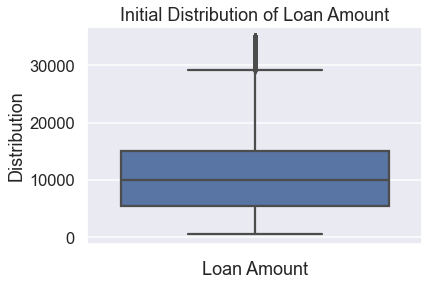

In [64]:
plt.title("Initial Distribution of Loan Amount")
sns.boxplot(y=data['loan_amnt'])
plt.xlabel("Loan Amount")
plt.ylabel("Distribution")
plt.show()

In [65]:
data['loan_amnt'].describe()

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [66]:
data['loan_amnt'].quantile(1)/data['loan_amnt'].median()

3.5

The above graph shows there are outliers present. The highest outlier value is around 3 times the mean and approximately 4 times the median. The 99th percentile has the equivalent value of the maximum outlier value. I would not intend to treat these because it is not very high or rare values. The area of outlier is quite densed 

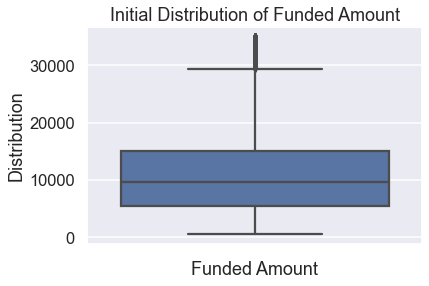

In [67]:
plt.title("Initial Distribution of Funded Amount")
sns.boxplot(y=data['funded_amnt'])
plt.xlabel("Funded Amount")
plt.ylabel("Distribution")
plt.show()

In [68]:
data['funded_amnt'].describe()

count    39717.000000
mean     10947.713196
std       7187.238670
min        500.000000
25%       5400.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64

The above graph shows there are outliers present. The highest outlier value is around 3 times the mean and approximately 4 times the median. The 99th percentile has the equivalent value of the maximum outlier value. I would not intend to treat these because it is not very high or rare values. The area of outlier is quite densed 

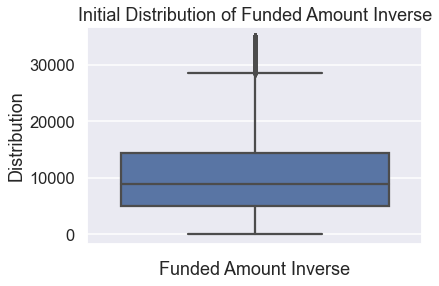

In [69]:
plt.title("Initial Distribution of Funded Amount Inverse")
sns.boxplot(y=data['funded_amnt_inv'])
plt.xlabel("Funded Amount Inverse")
plt.ylabel("Distribution")
plt.show()

In [70]:
data['funded_amnt_inv'].describe()

count    39717.000000
mean     10397.448868
std       7128.450439
min          0.000000
25%       5000.000000
50%       8975.000000
75%      14400.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64

The above graph shows there are outliers present. The highest outlier value is around 3 times the mean and approximately 4 times the median. The 99th percentile has the equivalent value of the maximum outlier value. I would not intend to treat these because it is not very high or rare values. The area of outlier is quite densed 

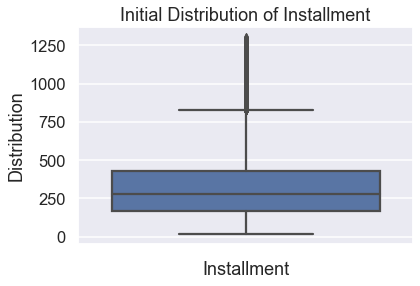

In [71]:
plt.title("Initial Distribution of Installment")
sns.boxplot(y=data['installment'])
plt.xlabel("Installment")
plt.ylabel("Distribution")
plt.show()

In [72]:
data['installment'].describe()

count    39717.000000
mean       324.561922
std        208.874874
min         15.690000
25%        167.020000
50%        280.220000
75%        430.780000
max       1305.190000
Name: installment, dtype: float64

In [73]:
data['installment'].quantile(.99)

931.5415999999983

In [74]:
data['installment'].quantile(1)/data['installment'].median()

4.657733209621012

The above graph shows there are outliers present. The highest outlier value is around 4 times the mean and approximately 5 times the median. The outliers are present above the 99th percentile. We can either drop the outliers or clip the outliers. Dropping would be a loss in information, hence i intend to clip the outliers to the upper bound!

In [75]:
outlier_detection(data,'installment')

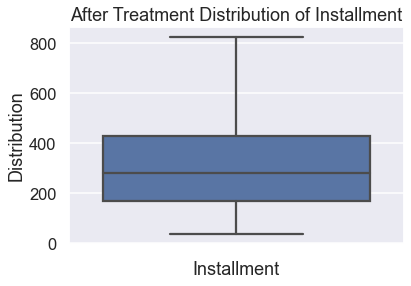

In [76]:
plt.title("After Treatment Distribution of Installment")
sns.boxplot(y=data['installment'])
plt.xlabel("Installment")
plt.ylabel("Distribution")
plt.show()

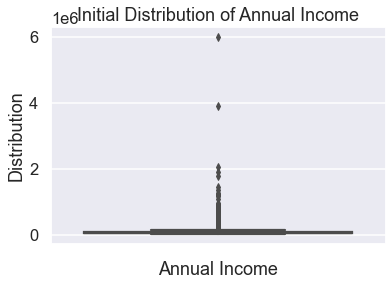

In [77]:
plt.title("Initial Distribution of Annual Income")
sns.boxplot(y=data['annual_inc'])
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.show()

In [78]:
round(data['annual_inc'].describe(),2)

count      39717.00
mean       68968.93
std        63793.77
min         4000.00
25%        40404.00
50%        59000.00
75%        82300.00
max      6000000.00
Name: annual_inc, dtype: float64

In [79]:
data['annual_inc'].max()/data['annual_inc'].median()

101.69491525423729

The above graph shows that there is a high amount outlier present. Maximum value is 30 times higher than Mean 
and 34 times high than Median. So dropping the rarest values which we see in the above graph.

In [80]:
data.drop(data[data['annual_inc']>=3000000].index.values,axis=0,inplace=True)

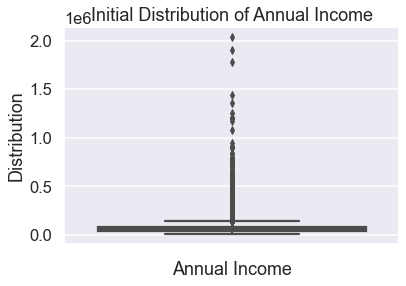

In [81]:
plt.title("Initial Distribution of Annual Income")
sns.boxplot(y=data['annual_inc'])
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.show()

In [82]:
data['annual_inc'].quantile(.99)

234516.00000000035

In [83]:
data[data['annual_inc']>=data['annual_inc'].quantile(.99)].shape

(398, 45)

It is found that the outliers lies above 99th percentiles.

In [84]:
data.drop(data[data['annual_inc']>=1000000].index.values,axis=0,inplace=True)

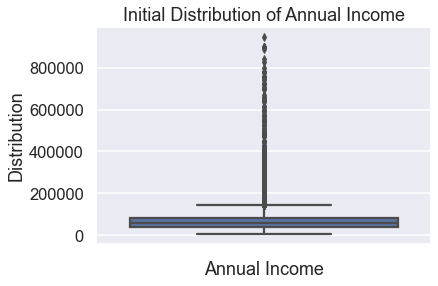

In [85]:
plt.title("Initial Distribution of Annual Income")
sns.boxplot(y=data['annual_inc'])
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.show()

In [86]:
outlier_detection(data,'annual_inc')

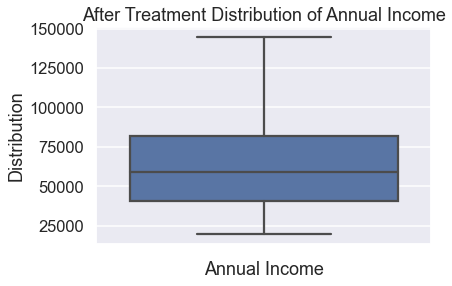

In [87]:
plt.title("After Treatment Distribution of Annual Income")
sns.boxplot(y=data['annual_inc'])
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.show()

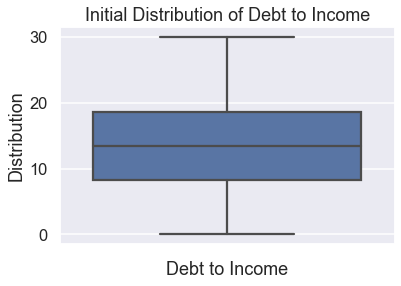

In [88]:
plt.title("Initial Distribution of Debt to Income")
sns.boxplot(y=data['dti'])
plt.xlabel("Debt to Income")
plt.ylabel("Distribution")
plt.show()

In above distribution we can not see any potential outliers

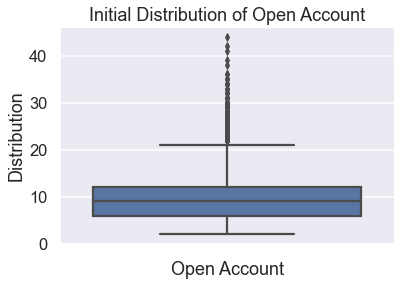

In [89]:
plt.title("Initial Distribution of Open Account")
sns.boxplot(y=data['open_acc'])
plt.xlabel("Open Account")
plt.ylabel("Distribution")
plt.show()

In [90]:
data['open_acc'].quantile(.99)

22.0

In [91]:
data[data['open_acc']>=22.0].shape

(515, 45)

We can see that above the 99th percentile we have outliers , of all the outliers lets drop the rarest occuring , i.e 40 and above

In [92]:
data.drop(data[data['open_acc']>=40.0].index.values,axis=0,inplace=True)

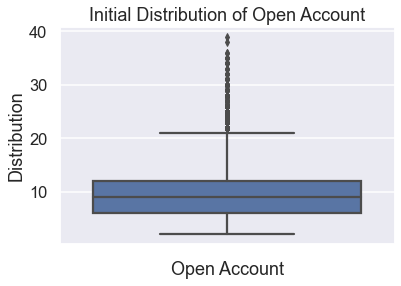

In [93]:
plt.title("Initial Distribution of Open Account")
sns.boxplot(y=data['open_acc'])
plt.xlabel("Open Account")
plt.ylabel("Distribution")
plt.show()

In [94]:
data[data['open_acc']>=22.0].shape

(512, 45)

In [95]:
outlier_detection(data,'open_acc')

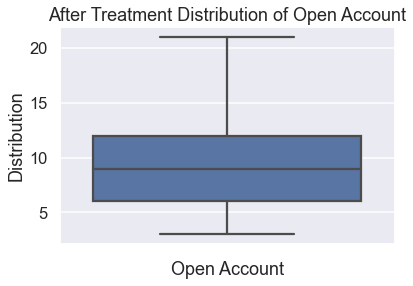

In [96]:
plt.title("After Treatment Distribution of Open Account")
sns.boxplot(y=data['open_acc'])
plt.xlabel("Open Account")
plt.ylabel("Distribution")
plt.show()

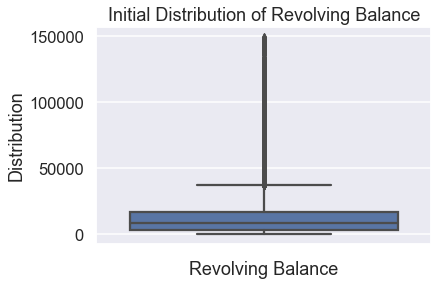

In [97]:
plt.title("Initial Distribution of Revolving Balance")
sns.boxplot(y=data['revol_bal'])
plt.xlabel("Revolving Balance")
plt.ylabel("Distribution")
plt.show()

In [98]:
data['revol_bal'].quantile(.99)

83171.9300000002

In [99]:
data['revol_bal'].describe()

count     39700.000000
mean      13378.624257
std       15879.828527
min           0.000000
25%        3703.000000
50%        8850.000000
75%       17054.500000
max      149588.000000
Name: revol_bal, dtype: float64

In [100]:
data['revol_bal'].quantile(1)/data['revol_bal'].mean()

11.181119756954748

In [101]:
data[data['revol_bal']>=40000].shape[0]/data.shape[0]

0.053828715365239296

We can see above distribution have lot of outliers . The maximum outlier is 16 times the median and 11 times the mean. Outliers are 5% of the data , we can either clip or drop them . Dropping would be loss in information and hence we choose to clip the data.

In [102]:
outlier_detection(data,'revol_bal')

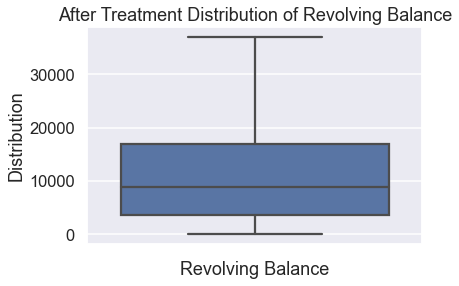

In [103]:
plt.title("After Treatment Distribution of Revolving Balance")
sns.boxplot(y=data['revol_bal'])
plt.xlabel("Revolving Balance")
plt.ylabel("Distribution")
plt.show()

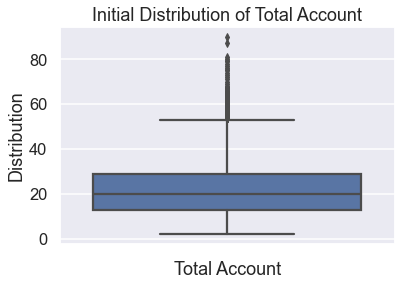

In [104]:
plt.title("Initial Distribution of Total Account")
sns.boxplot(y=data['total_acc'])
plt.xlabel("Total Account")
plt.ylabel("Distribution")
plt.show()

In [105]:
data['total_acc'].describe()

count    39700.000000
mean        22.084635
std         11.395502
min          2.000000
25%         13.000000
50%         20.000000
75%         29.000000
max         90.000000
Name: total_acc, dtype: float64

In [106]:
data['total_acc'].quantile(.99)

56.0

In [107]:
data['total_acc'].quantile(1)/data['total_acc'].mean()

4.075231534285323

In the above distrbution we see that the outlier lies above 99th percentile. The highest value of the outlier is approximately 5 times the median and 4 times the mean. There are few seperate outliers above 80 , they seems to be the rarest event. First let us remove those then will decide what to do for the rest !

In [108]:
data[data['total_acc']>=80]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,loan_id
13595,779179,981840,18000,18000,17975.00000,60,13.99,418.74,C,C3,united states airforce,10+ years,MORTGAGE,76000.0,Source Verified,jun-11,Fully Paid,debt_consolidation,debt,890xx,NV,18.25,0,jan-00,2,12.0,0,6330.0,34.0,87,0.0,0.0,20051.92,20024.07,18000.0,2051.92,0.0,0.0,0.0,aug-12,10119.43,0,may-16,0.0,779179
29291,523116,676788,12000,12000,11897.00616,60,19.41,314.01,F,F4,west i-10 fire department,10+ years,MORTGAGE,75996.0,Source Verified,jun-10,Fully Paid,major_purchase,eric's loan,774xx,TX,16.49,0,feb-95,1,21.0,0,6078.0,14.9,81,0.0,0.0,15624.23,15486.19,12000.0,3624.23,0.0,0.0,0.0,apr-12,38.71,0,jul-14,0.0,523116
29470,521974,675105,11500,11500,10375.00000,36,10.38,373.13,B,B1,san mateo county,4 years,RENT,125000.0,Not Verified,may-10,Fully Paid,debt_consolidation,bofa,941xx,CA,5.16,0,jun-97,1,19.0,0,21134.0,32.2,90,0.0,0.0,12188.68,10996.33,11500.0,688.69,0.0,0.0,0.0,mar-11,4154.22,0,mar-11,0.0,521974
29542,521028,673702,10000,10000,10000.00000,36,15.33,348.28,D,D3,western state hospital,1 year,MORTGAGE,61476.0,Not Verified,may-10,Fully Paid,credit_card,credit card refinance loan,984xx,WA,21.32,0,sep-89,1,21.0,0,8791.0,18.1,80,0.0,0.0,12512.46,12512.46,10000.0,2512.46,0.0,0.0,0.0,mar-13,1374.05,0,dec-15,0.0,521028


In [109]:
data['int_rate']=data['int_rate'].astype('float64')
data['dti']=data['dti'].astype('float64')

In [110]:
data=data[data['total_acc']<80]

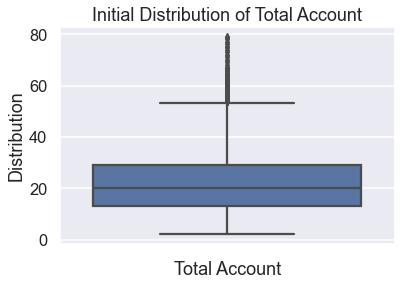

In [111]:
plt.title("Initial Distribution of Total Account")
sns.boxplot(y=data['total_acc'])
plt.xlabel("Total Account")
plt.ylabel("Distribution")
plt.show()

We would not treat the black dense area as outlier because , it does not seems to be rare events.

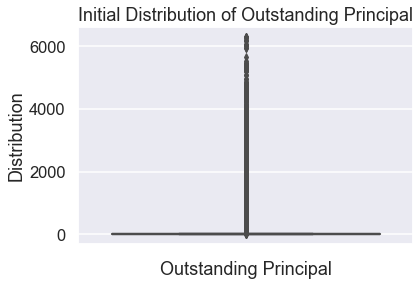

In [112]:
plt.title("Initial Distribution of Outstanding Principal")
sns.boxplot(y=data['out_prncp'])
plt.xlabel("Outstanding Principal")
plt.ylabel("Distribution")
plt.show()

In [113]:
data['out_prncp'].describe()

count    39696.000000
mean        51.254988
std        375.270215
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       6311.470000
Name: out_prncp, dtype: float64

In [114]:
data['out_prncp'].quantile(.99)

2096.6515000000604

In [115]:
data['out_prncp'].quantile(1)/data['out_prncp'].mean()

123.1386496728132

We see 75% of data lies below 0. The maximum outlier value is 123 times the mean. We can either drop the column or clip the value. But we would not do any, the reason is that , these 0 are for those borrowers who either have fully paid off or have been charged off. Rest are the 3% data approximately which represents the current borrowers

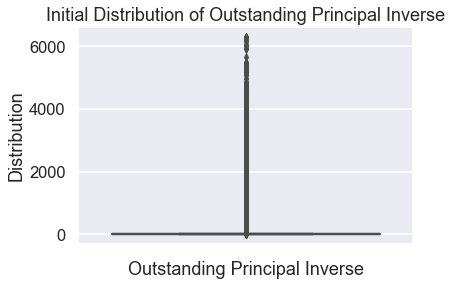

In [116]:
plt.title("Initial Distribution of Outstanding Principal Inverse")
sns.boxplot(y=data['out_prncp_inv'])
plt.xlabel("Outstanding Principal Inverse")
plt.ylabel("Distribution")
plt.show()

In [117]:
data['out_prncp_inv'].describe()

count    39696.000000
mean        51.016743
std        373.921487
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       6307.370000
Name: out_prncp_inv, dtype: float64

We see 75% of data lies below 0. The maximum outlier value is 123 times the mean. We can either drop the column or clip the value. But we would not do any, the reason is that , these 0 are for those borrowers who either have fully paid off or have been charged off. Rest are the 3% data approximately which represents the current borrowers

In [118]:
outlier_columns

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'installment',
 'annual_inc',
 'dti',
 'open_acc',
 'revol_bal',
 'total_acc',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_amnt']

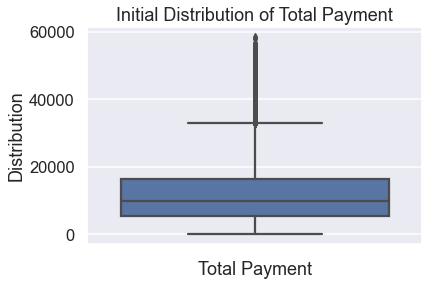

In [119]:
plt.title("Initial Distribution of Total Payment")
sns.boxplot(y=data['total_pymnt'])
plt.xlabel("Total Payment")
plt.ylabel("Distribution")
plt.show()

In [120]:
data['total_pymnt'].describe()

count    39696.000000
mean     12153.210039
std       9042.669264
min          0.000000
25%       5576.685000
50%       9898.740000
75%      16534.567500
max      58563.680000
Name: total_pymnt, dtype: float64

In [121]:
data['total_pymnt'].quantile(.99)

42218.04700000002

In [122]:
data['total_pymnt'].quantile(1)/data['total_pymnt'].mean()

4.818782841063584

The above graph shows there are outliers present. The highest outlier value is around 5 times the mean and approximately 6 times the median. We can either drop the outliers or clip the outliers or it can be treated as non-outlier values .

In [123]:
outlier_detection(data,'total_pymnt')

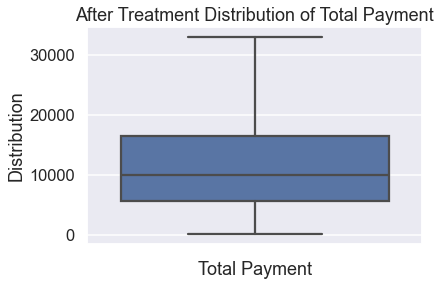

In [124]:
plt.title("After Treatment Distribution of Total Payment")
sns.boxplot(y=data['total_pymnt'])
plt.xlabel("Total Payment")
plt.ylabel("Distribution")
plt.show()

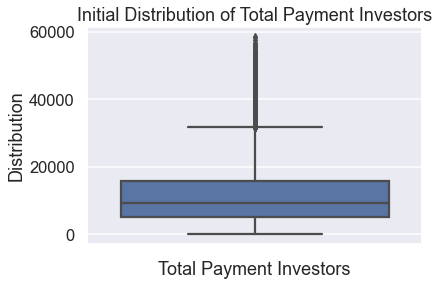

In [125]:
plt.title("Initial Distribution of Total Payment Investors")
sns.boxplot(y=data['total_pymnt_inv'])
plt.xlabel("Total Payment Investors")
plt.ylabel("Distribution")
plt.show()

In [126]:
data['total_pymnt_inv'].describe()

count    39696.000000
mean     11567.001820
std       8943.194556
min          0.000000
25%       5111.615000
50%       9286.170000
75%      15799.970000
max      58563.680000
Name: total_pymnt_inv, dtype: float64

The above graph shows there are outliers present. The highest outlier value is around 5 times the mean and approximately 6 times the median. We can either drop the outliers or clip the outliers or it can be treated as non-outlier values .

In [127]:
outlier_detection(data,'total_pymnt_inv')

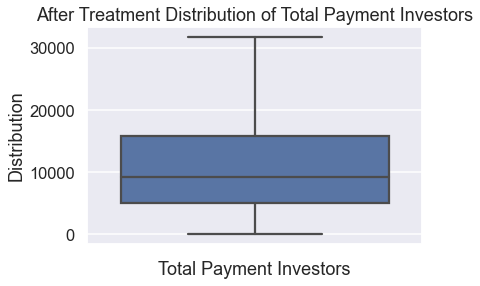

In [128]:
plt.title("After Treatment Distribution of Total Payment Investors")
sns.boxplot(y=data['total_pymnt_inv'])
plt.xlabel("Total Payment Investors")
plt.ylabel("Distribution")
plt.show()

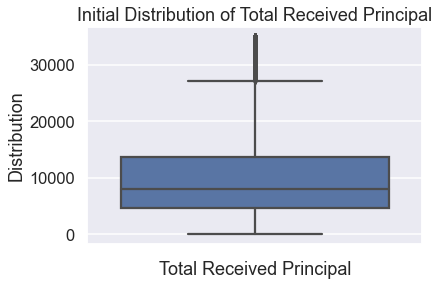

In [129]:
plt.title("Initial Distribution of Total Received Principal")
sns.boxplot(y=data['total_rec_prncp'])
plt.xlabel("Total Received Principal")
plt.ylabel("Distribution")
plt.show()

In [130]:
data['total_rec_prncp'].describe()

count    39696.000000
mean      9792.940350
std       7066.160895
min          0.000000
25%       4595.990000
50%       8000.000000
75%      13659.027500
max      35000.020000
Name: total_rec_prncp, dtype: float64

In [131]:
data['total_rec_prncp'].quantile(.99)

33950.0

In [132]:
data['total_rec_prncp'].quantile(1)/data['total_rec_prncp'].mean()

3.574005227176064

The above graph shows there are outliers present. The highest outlier value is around 4 times the mean and approximately 4 times the median. We can either drop the outliers or clip the outliers or it can be treated as non-outlier values .We do not intend to treat it as outlier because there is not much bigger difference of maximum value from the 99th percentile .

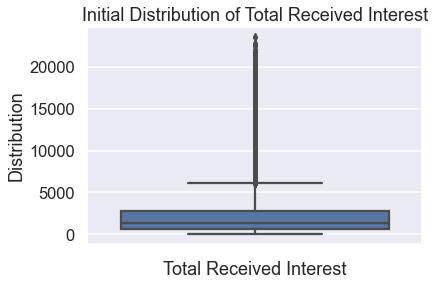

In [133]:
plt.title("Initial Distribution of Total Received Interest")
sns.boxplot(y=data['total_rec_int'])
plt.xlabel("Total Received Interest")
plt.ylabel("Distribution")
plt.show()

In [134]:
data['total_rec_int'].describe()

count    39696.000000
mean      2263.634533
std       2608.267657
min          0.000000
25%        662.077500
50%       1348.850000
75%       2833.480000
max      23563.680000
Name: total_rec_int, dtype: float64

In [135]:
data['total_rec_int'].quantile(.99)

12800.905000000039

There seems to be large number of outliers in the above distribution , which shows some erroneous values for total interest received by the bank from the borrower. We would like to drop those which are above the 99th percentile.

In [136]:
data=data[data['total_rec_int']<=data['total_rec_int'].quantile(.99)]

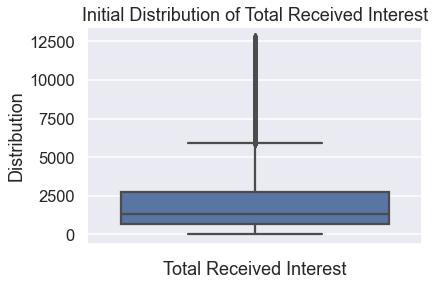

In [137]:
plt.title("Initial Distribution of Total Received Interest")
sns.boxplot(y=data['total_rec_int'])
plt.xlabel("Total Received Interest")
plt.ylabel("Distribution")
plt.show()

In [138]:
data['total_rec_int'].quantile(.99)

10614.13859999998

In [139]:
data=data[data['total_rec_int']<=6000]

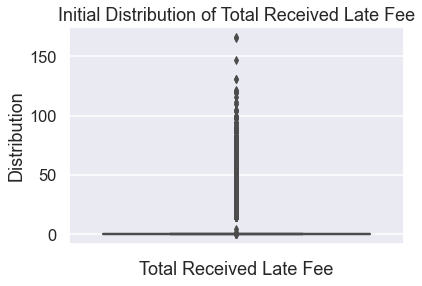

In [140]:
plt.title("Initial Distribution of Total Received Late Fee")
sns.boxplot(y=data['total_rec_late_fee'])
plt.xlabel("Total Received Late Fee")
plt.ylabel("Distribution")
plt.show()

In [141]:
data['total_rec_late_fee'].describe()

count    36446.000000
mean         1.267656
std          6.806829
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        166.429711
Name: total_rec_late_fee, dtype: float64

The distribution shows there are lot of outliers and 75% of received late fee is 0 or below. We can drop the column or we can clip the values . Lets Explore

In [142]:
data[data['total_rec_late_fee']==0].shape[0]/data.shape[0]

0.9495143499972563

It appears to be 94% of borrower have not paid late fee , either they paid timely or have been charged off! We should not drop the column now and should not treat the outliers as there are not any , rather let us find if it has any meaningful pattern .

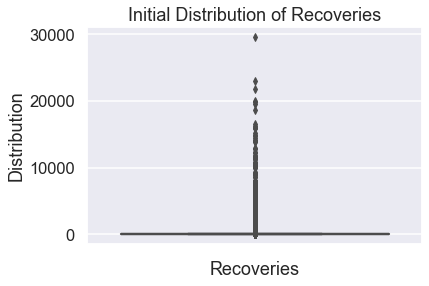

In [143]:
plt.title("Initial Distribution of Recoveries")
sns.boxplot(y=data['recoveries'])
plt.xlabel("Recoveries")
plt.ylabel("Distribution")
plt.show()

In [144]:
data[data['recoveries']==0].shape[0]/data.shape[0]

0.8950776491247325

The above distribution states that 89% of borrowers , we could not get recoveries as 82% of them were fully paid and 14% were charged off. We should not drop or treat it for outliers, let us find some pattern if exists

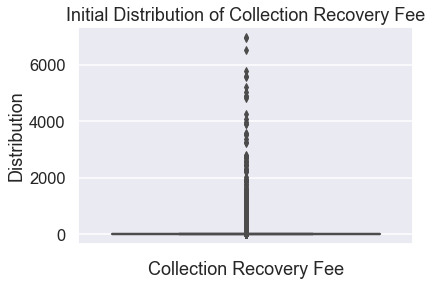

In [145]:
plt.title("Initial Distribution of Collection Recovery Fee")
sns.boxplot(y=data['collection_recovery_fee'])
plt.xlabel("Collection Recovery Fee")
plt.ylabel("Distribution")
plt.show()

In [146]:
data[data['collection_recovery_fee']==0].shape[0]/data.shape[0]

0.9060527904296768

The above distribution states that 91% of borrowers , we could not get recoveries as 82% of them were fully paid and 14% were charged off. We should not drop or treat it for outliers, let us find some pattern if exists

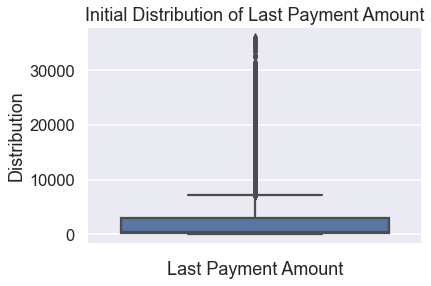

In [147]:
plt.title("Initial Distribution of Last Payment Amount")
sns.boxplot(y=data['last_pymnt_amnt'])
plt.xlabel("Last Payment Amount")
plt.ylabel("Distribution")
plt.show()

In [148]:
data['last_pymnt_amnt'].describe()

count    36446.000000
mean      2470.670863
std       4158.196873
min          0.000000
25%        205.332500
50%        502.755000
75%       3022.725000
max      36115.200000
Name: last_pymnt_amnt, dtype: float64

In [149]:
data['last_pymnt_amnt'].quantile(.99)

19973.517000000058

We see that there are large number of outliers in the above distribution , we can either clip or drop them. 

In [150]:
data=data[data['last_pymnt_amnt']<=data['last_pymnt_amnt'].quantile(.99)]

In [151]:
data.shape

(36081, 45)

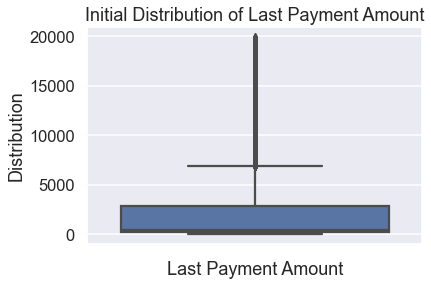

In [152]:
plt.title("Initial Distribution of Last Payment Amount")
sns.boxplot(y=data['last_pymnt_amnt'])
plt.xlabel("Last Payment Amount")
plt.ylabel("Distribution")
plt.show()

In [153]:
outlier_detection(data,'last_pymnt_amnt')

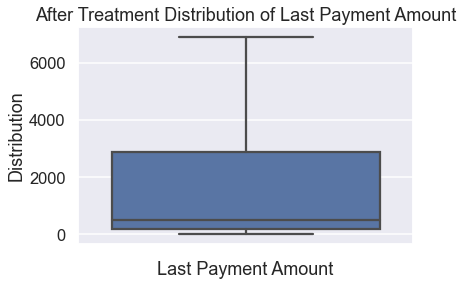

In [154]:
plt.title("After Treatment Distribution of Last Payment Amount")
sns.boxplot(y=data['last_pymnt_amnt'])
plt.xlabel("Last Payment Amount")
plt.ylabel("Distribution")
plt.show()

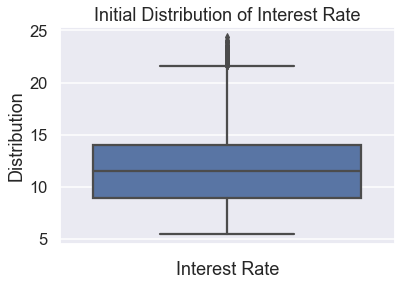

In [155]:
plt.title("Initial Distribution of Interest Rate")
sns.boxplot(y=data['int_rate'])
plt.xlabel("Interest Rate")
plt.ylabel("Distribution")
plt.show()

In [156]:
data['int_rate'].quantile(.99)

20.03

We see there some potential outliers aboce 22.5, they does not appear to be rare of interest charged. Hence would not treat it

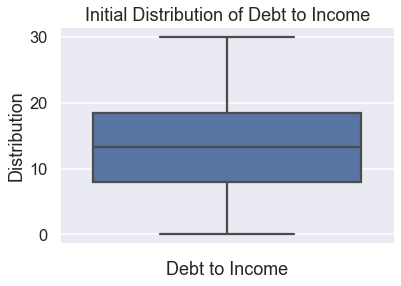

In [157]:
plt.title("Initial Distribution of Debt to Income")
sns.boxplot(y=data['dti'])
plt.xlabel("Debt to Income")
plt.ylabel("Distribution")
plt.show()

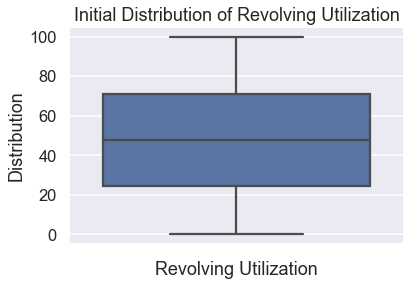

In [158]:
plt.title("Initial Distribution of Revolving Utilization")
sns.boxplot(y=data['revol_util'])
plt.xlabel("Revolving Utilization")
plt.ylabel("Distribution")
plt.show()

### Derived Metrics

In [159]:
# Extracting years to estimate year wise loans issued 
data['issue_yr'] = pd.to_datetime(data['issue_d'], format = '%b-%y').dt.year

In [160]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,loan_id,issue_yr
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,us army,10+ years,RENT,24000.00,Verified,dec-11,Fully Paid,credit_card,computer,860xx,AZ,27.65,0,jan-85,1,3.0,0,13648.0,83.7,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,jan-15,171.62,0,may-16,0.0,1077501,2011
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,ryder,< 1 year,RENT,30000.00,Source Verified,dec-11,Charged Off,car,bike,309xx,GA,1.00,0,apr-99,5,3.0,0,1687.0,9.4,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,apr-13,119.66,0,sep-13,0.0,1077430,2011
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,us army,10+ years,RENT,19425.42,Not Verified,dec-11,Fully Paid,small_business,real estate business,606xx,IL,8.72,0,nov-01,2,3.0,0,2956.0,98.5,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,jun-14,649.91,0,may-16,0.0,1077175,2011
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,air resources board,10+ years,RENT,49200.00,Source Verified,dec-11,Fully Paid,other,personel,917xx,CA,20.00,0,feb-96,1,10.0,0,5598.0,21.0,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,jan-15,357.48,0,apr-16,0.0,1076863,2011
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,university medical group,1 year,RENT,80000.00,Source Verified,dec-11,Current,other,personal,972xx,OR,17.94,0,jan-96,0,15.0,0,27783.0,53.9,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,may-16,67.79,Jun-16,may-16,0.0,1075358,2011


In [161]:
# Extracting years to estimate year wise last payment made 
data['last_pymnt_yr'] = pd.to_datetime(data['last_pymnt_d'], format = '%b-%y').dt.year

In [162]:
# Extracting years to estimate year wise Credit Pulled 
data['last_credit_pull_yr'] = pd.to_datetime(data['last_credit_pull_d'], format = '%b-%y').dt.year

In [163]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,loan_id,issue_yr,last_pymnt_yr,last_credit_pull_yr
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,us army,10+ years,RENT,24000.00,Verified,dec-11,Fully Paid,credit_card,computer,860xx,AZ,27.65,0,jan-85,1,3.0,0,13648.0,83.7,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,jan-15,171.62,0,may-16,0.0,1077501,2011,2015,2016
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,ryder,< 1 year,RENT,30000.00,Source Verified,dec-11,Charged Off,car,bike,309xx,GA,1.00,0,apr-99,5,3.0,0,1687.0,9.4,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,apr-13,119.66,0,sep-13,0.0,1077430,2011,2013,2013
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,us army,10+ years,RENT,19425.42,Not Verified,dec-11,Fully Paid,small_business,real estate business,606xx,IL,8.72,0,nov-01,2,3.0,0,2956.0,98.5,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,jun-14,649.91,0,may-16,0.0,1077175,2011,2014,2016
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,air resources board,10+ years,RENT,49200.00,Source Verified,dec-11,Fully Paid,other,personel,917xx,CA,20.00,0,feb-96,1,10.0,0,5598.0,21.0,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,jan-15,357.48,0,apr-16,0.0,1076863,2011,2015,2016
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,university medical group,1 year,RENT,80000.00,Source Verified,dec-11,Current,other,personal,972xx,OR,17.94,0,jan-96,0,15.0,0,27783.0,53.9,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,may-16,67.79,Jun-16,may-16,0.0,1075358,2011,2016,2016


In [164]:
#Estimating tenure of last payment from loan issued year
data['last_pymnt_to_issue_Tenure']=data['last_pymnt_yr']-data['issue_yr']

In [165]:
#Estimating tenure of issue year to Credit Pull year
data['LC_pull_to_issue_Tenure']=data['last_credit_pull_yr']-data['issue_yr']

In [166]:
#Estimating tenure of Last Paymet year to Credit Pull year
data['LC_pull_to_pymnt_Tenure']=data['last_credit_pull_yr']-data['last_pymnt_yr']

In [167]:
#It depicts do the borrower gets funds different from what he/she applied for. Negative values shows that they have received lesser amount from what they have applied for 
data['funded_to_applied_amt_diff']=data['funded_amnt']-data['loan_amnt']

In [168]:
#It depicts do the borrower are promissed by investor funds different from what he/she applied for. Negative values shows that they have received lesser amount from what they have applied for 
data['funded_inv_to_applied_amt_diff']=data['funded_amnt_inv']-data['loan_amnt']

In [169]:
data['funded_inv_to_funded_amt_diff']=data['funded_amnt_inv']-data['funded_amnt']

In [170]:
#Data type conversion
data['term']=data['term'].astype('int64')

In [171]:
#Total installment paid by the borrower
data['total_inst']=data['term']*data['installment']

In [172]:
#Balance amount the borrower need to pay or balance left after charging off the customer
data['balance_amt_of_charged_off']=data['total_inst']-data['total_pymnt']

In [173]:
data['installment_to_income']=round(data['total_inst']*100/(data['annual_inc']*data['term']/12),2)

In [174]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,loan_id,issue_yr,last_pymnt_yr,last_credit_pull_yr,last_pymnt_to_issue_Tenure,LC_pull_to_issue_Tenure,LC_pull_to_pymnt_Tenure,funded_to_applied_amt_diff,funded_inv_to_applied_amt_diff,funded_inv_to_funded_amt_diff,total_inst,balance_amt_of_charged_off,installment_to_income
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,us army,10+ years,RENT,24000.00,Verified,dec-11,Fully Paid,credit_card,computer,860xx,AZ,27.65,0,jan-85,1,3.0,0,13648.0,83.7,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,jan-15,171.62,0,may-16,0.0,1077501,2011,2015,2016,4,5,1,0,-25.0,-25.0,5863.32,0.16,8.14
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,ryder,< 1 year,RENT,30000.00,Source Verified,dec-11,Charged Off,car,bike,309xx,GA,1.00,0,apr-99,5,3.0,0,1687.0,9.4,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,apr-13,119.66,0,sep-13,0.0,1077430,2011,2013,2013,2,2,0,0,0.0,0.0,3589.80,2581.09,2.39
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,us army,10+ years,RENT,19425.42,Not Verified,dec-11,Fully Paid,small_business,real estate business,606xx,IL,8.72,0,nov-01,2,3.0,0,2956.0,98.5,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,jun-14,649.91,0,may-16,0.0,1077175,2011,2014,2016,3,5,2,0,0.0,0.0,3035.88,30.21,5.21
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,air resources board,10+ years,RENT,49200.00,Source Verified,dec-11,Fully Paid,other,personel,917xx,CA,20.00,0,feb-96,1,10.0,0,5598.0,21.0,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,jan-15,357.48,0,apr-16,0.0,1076863,2011,2015,2016,4,5,1,0,0.0,0.0,12215.16,-16.73,8.28
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,university medical group,1 year,RENT,80000.00,Source Verified,dec-11,Current,other,personal,972xx,OR,17.94,0,jan-96,0,15.0,0,27783.0,53.9,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,may-16,67.79,Jun-16,may-16,0.0,1075358,2011,2016,2016,5,5,0,0,0.0,0.0,4067.40,554.07,1.02


**dti = debt/income => debt=dti*income/12**

In [175]:
#Calculating total debt from debt to income ratio using above formula 
data['debt']=round((data['annual_inc']/12)*data['dti'],2)

In [176]:
data.drop(['loan_id','id','member_id'],axis=1,inplace=True)

### Univariate Analysis

In [177]:
#Number of borrowers who have received different funds from what they have applied for 
data[data['loan_amnt']!= data['funded_amnt']]['loan_amnt'].count()

1544


There are 1544 observations, where amount which borrower requested does not equal what borrower was funded. So,for our analysis we need consider funded_amnt as that is the final amount funded to borrower.

It is also mentioned in the data dictionary that "If at some point in time, the credit department reduces the loan amount, then it will be reflected in this loan_amnt field". So there is a high possibility that the data has not been updated by the credit deparment. 

#### Univariate Analysis - Unordered Categorical Variable :

Unordered Categorical Variable :

- loan_status

- home_ownership

- purpose

- addr_state

- emp_title

- verification_status

- title



In [178]:
#Value counts of loan status
loan_status_counts=pd.DataFrame(data['loan_status'].value_counts())
loan_status_counts.rename(columns={'loan_status':'freq'},inplace=True)
loan_status_counts['rank']=loan_status_counts['freq'].rank(ascending=False)

In [179]:
loan_status_counts

,freq,rank
Fully Paid,30386,1.0
Charged Off,5166,2.0
Current,529,3.0


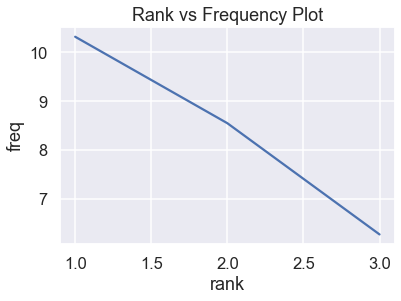

In [180]:
#Rank Frequency plot of loan status
plt.title("Rank vs Frequency Plot")
sns.lineplot(x=loan_status_counts['rank'],y=np.log(loan_status_counts['freq']))
plt.show()

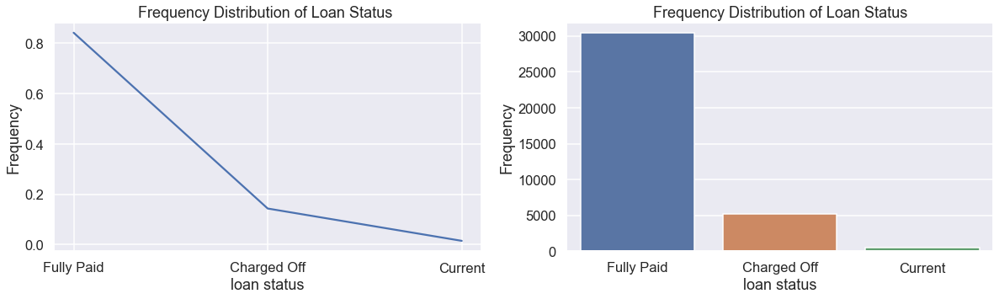

In [181]:
#loan status distribution
loan_status_dist=data['loan_status'].value_counts(normalize=True).sort_values(ascending=False)
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.title("Frequency Distribution of Loan Status ")
sns.lineplot(data=loan_status_dist)
plt.xlabel("loan status")
plt.ylabel("Frequency")
plt.subplot(1,2,2)
plt.title("Frequency Distribution of Loan Status")
sns.countplot(x='loan_status',data=data,)
plt.xlabel("loan status")
plt.ylabel("Frequency")
plt.show()

As the rank increases the frequency of decreases , hence the order from maximum to minumum : Fully Paid => Charged Off => Current. Atleast 14% have been charged off. We need to focus on the paid off and charged off customers as current customers has unknown outcome.

In [182]:
#Ownership value counts
ownership_counts=pd.DataFrame(data['home_ownership'].value_counts())
ownership_counts.rename(columns={'home_ownership':'freq'},inplace=True)
ownership_counts['rank']=ownership_counts['freq'].rank(ascending=False)

In [183]:
ownership_counts

,freq,rank
RENT,17693,1.0
MORTGAGE,15450,2.0
OWN,2838,3.0
OTHER,100,4.0


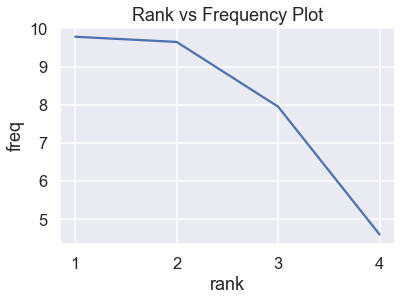

In [184]:
#Ownership rank plot and distribution
plt.title("Rank vs Frequency Plot")
sns.lineplot(x=ownership_counts['rank'],y=np.log(ownership_counts['freq']))
plt.show()

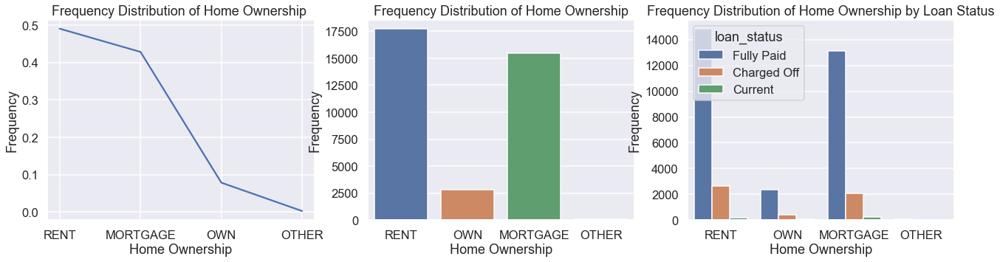

In [185]:
#Ownership rank plot and distribution
ownership_dist=data['home_ownership'].value_counts(normalize=True).sort_values(ascending=False)
plt.figure(figsize=(22,5))
plt.subplot(1,3,1)
plt.title("Frequency Distribution of Home Ownership ")
sns.lineplot(data=ownership_dist)
plt.xlabel("Home Ownership")
plt.ylabel("Frequency")
plt.subplot(1,3,2)
plt.title("Frequency Distribution of Home Ownership")
sns.countplot(x='home_ownership',data=data)
plt.xlabel("Home Ownership")
plt.ylabel("Frequency")
plt.subplot(1,3,3)
plt.title("Frequency Distribution of Home Ownership by Loan Status")
sns.countplot(x='home_ownership',data=data,hue='loan_status')
plt.xlabel("Home Ownership")
plt.ylabel("Frequency")
plt.show()

**It shows that frequencies for rent and mortgage ownerwship is high for charged off loan status**

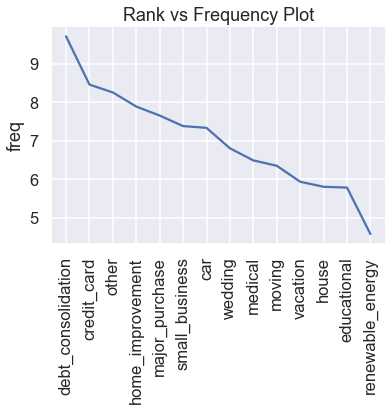

In [186]:
#Purpose rank plot and distribution
purpose_counts=pd.DataFrame(data['purpose'].value_counts().sort_values(ascending=False))
purpose_counts.rename(columns={'purpose':'freq'},inplace=True)
purpose_counts['rank']=purpose_counts['freq'].rank(ascending=False)
plt.title("Rank vs Frequency Plot")
plt.xticks(rotation=90)
sns.lineplot(x=purpose_counts.index,y=np.log(purpose_counts['freq']))
plt.show()

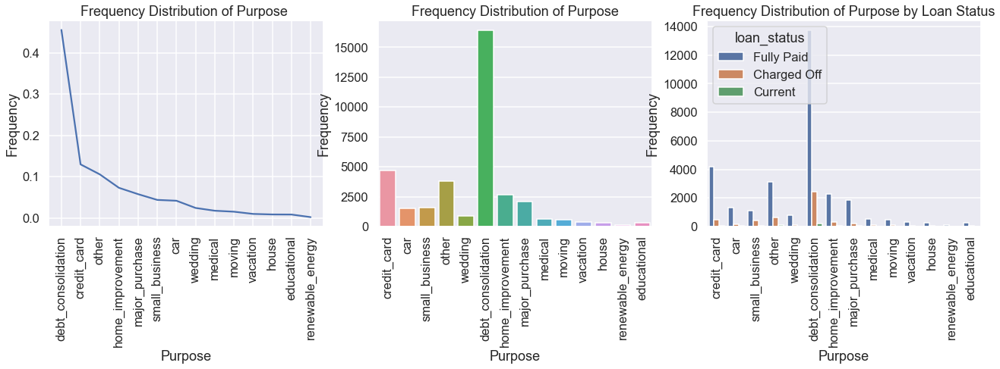

In [187]:
#Purpose rank plot and distribution
purpose_dist=data['purpose'].value_counts(normalize=True).sort_values(ascending=False)
plt.figure(figsize=(22,5))
plt.subplot(1,3,1)
plt.title("Frequency Distribution of Purpose ")
sns.lineplot(data=purpose_dist)
plt.xlabel("Purpose")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(1,3,2)
plt.title("Frequency Distribution of Purpose")
sns.countplot(x='purpose',data=data)
plt.xlabel("Purpose")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(1,3,3)
plt.title("Frequency Distribution of Purpose by Loan Status")
sns.countplot(x='purpose',data=data,hue='loan_status')
plt.xlabel("Purpose")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

**Debt Consolidation , Other and Credit Card purposes are the more frequent purposes of borrowers who were charged-off**. We can see there are high frequencies for debt consolidation , credit card and other on the whole

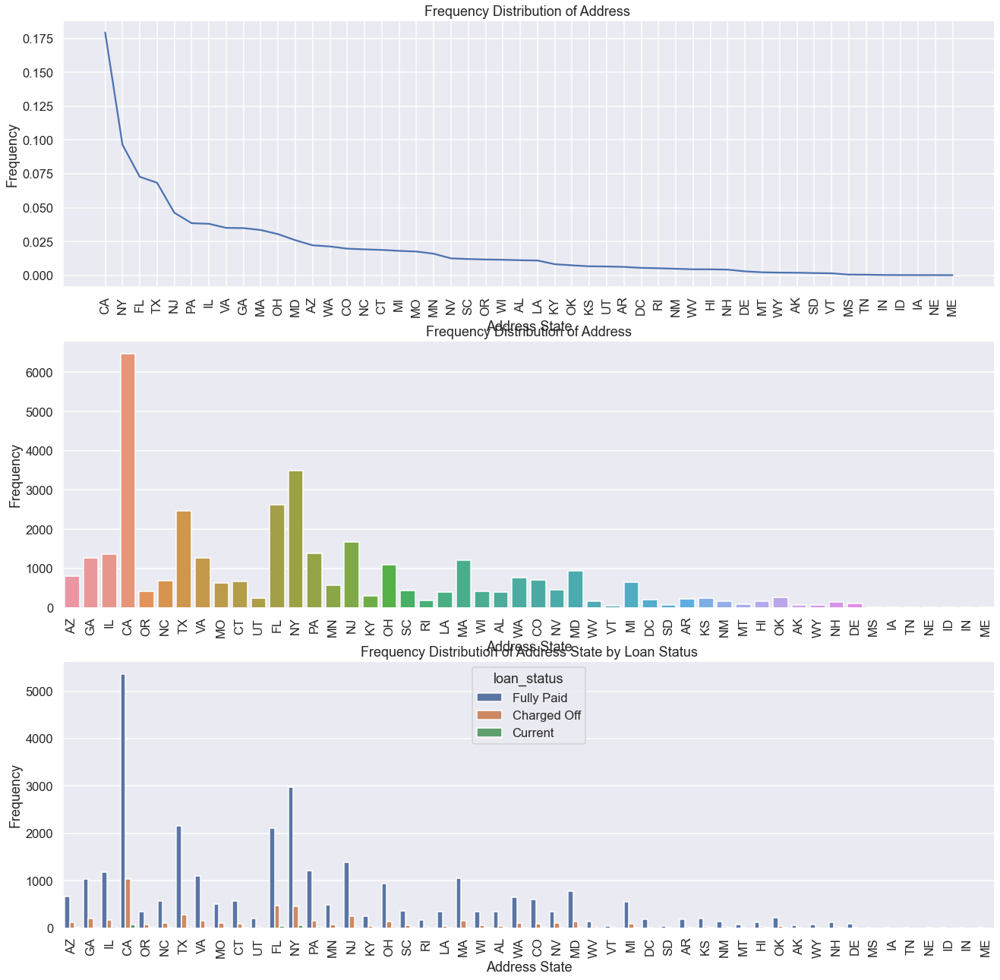

In [188]:
#Address State rank plot and distribution
addr_dist=data['addr_state'].value_counts(normalize=True).sort_values(ascending=False)
plt.figure(figsize=(22,22))
plt.subplot(3,1,1)
plt.title("Frequency Distribution of Address ")
sns.lineplot(data=addr_dist)
plt.xlabel("Address State")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(3,1,2)
plt.title("Frequency Distribution of Address")
sns.countplot(x='addr_state',data=data)
plt.xlabel("Address State")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(3,1,3)
plt.title("Frequency Distribution of Address State by Loan Status")
sns.countplot(x='addr_state',data=data,hue='loan_status')
plt.xlabel("Address State")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

In [189]:
#Getting charged off to paid ratio based on states and top 10 states 
state_wise_status=pd.crosstab(data['addr_state'],data['loan_status']).drop('Current',axis=1)
state_wise_status.sort_values(by='Charged Off',ascending=False,inplace=True)
state_wise_status['ratio']=round(state_wise_status['Charged Off']/state_wise_status['Fully Paid'],4)
state_wise_status.sort_values(by=['Charged Off','ratio'],ascending=False,inplace=True)

<AxesSubplot:ylabel='ratio'>

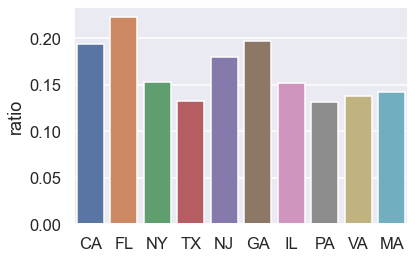

In [190]:
#Getting charged off to paid ratio based on states and top 10 states 
sns.barplot(x=state_wise_status.head(10).index.values,y=state_wise_status['ratio'].head(10))

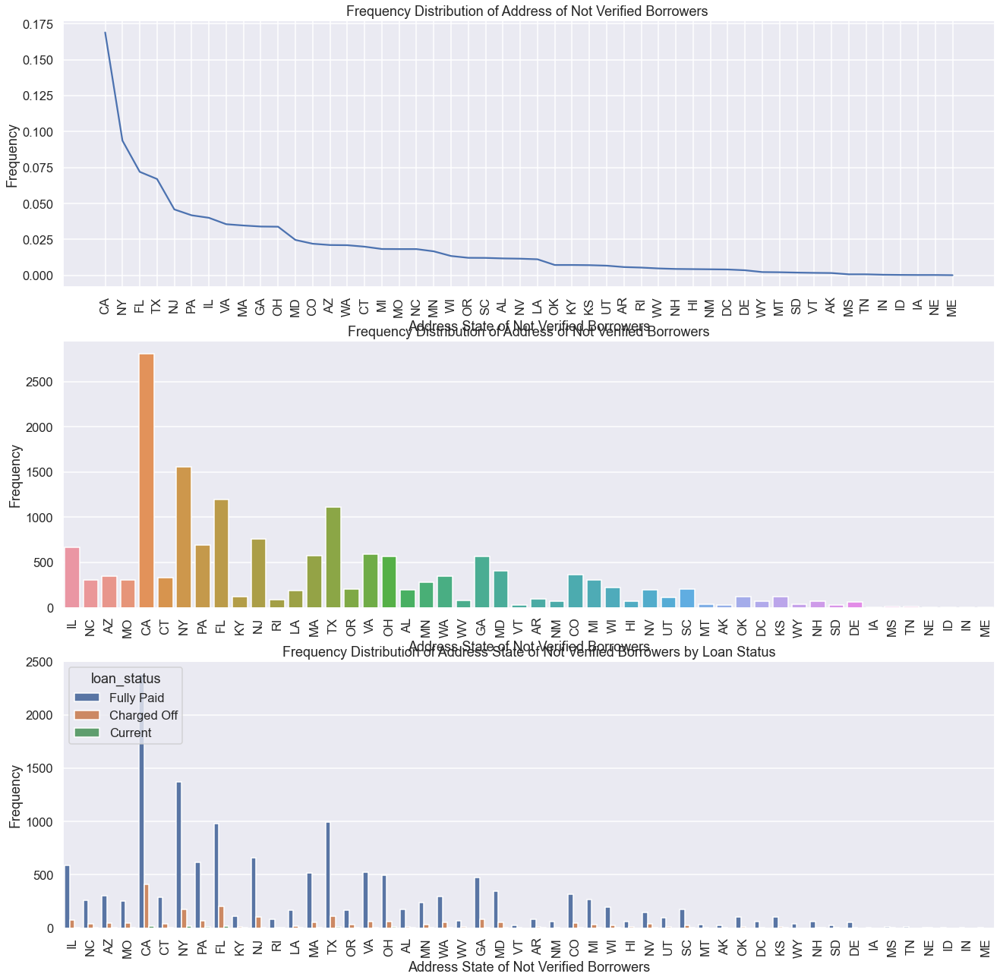

In [191]:
#Finding is borrower being not verified one of the key reason for default state wise
not_verified=data[data['verification_status']=="Not Verified"]
addr_dist=not_verified['addr_state'].value_counts(normalize=True).sort_values(ascending=False)
plt.figure(figsize=(22,22))
plt.subplot(3,1,1)
plt.title("Frequency Distribution of Address of Not Verified Borrowers ")
sns.lineplot(data=addr_dist)
plt.xlabel("Address State of Not Verified Borrowers")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(3,1,2)
plt.title("Frequency Distribution of Address of Not Verified Borrowers")
sns.countplot(x='addr_state',data=not_verified)
plt.xlabel("Address State of Not Verified Borrowers")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(3,1,3)
plt.title("Frequency Distribution of Address State of Not Verified Borrowers by Loan Status")
sns.countplot(x='addr_state',data=not_verified,hue='loan_status')
plt.xlabel("Address State of Not Verified Borrowers")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

- It states Florida, California, Georgia and New Jersey has highest charged off ratio, it means:

    - Florida : When there are 100 fully paid borrowers there will be approximately 22 charged off borrowers . You can say out off 122 borrowers, there will be 22 charged off borrowers
    
    - California : When there are 100 fully paid borrowers there will be approximately 19 charged off borrowers . You can say out off 119 borrowers, there will be 19 charged off borrowers
    
    - Georgia : When there are 100 fully paid borrowers there will be approximately 19 charged off borrowers . You can say out off 119 borrowers, there will be 19 charged off borrowers
    
    - New Jersey : When there are 100 fully paid borrowers there will be approximately 18 charged off borrowers . You can say out off 118 borrowers, there will be 18 charged off borrowers
    
These states have high propensity to have borrowers which get charged off

In [192]:
#Finding interest rate ratio of charged off to paid off borrower- & barplot
interest_addr_status=pd.pivot_table(data=data,index='addr_state',columns='loan_status',values='int_rate',aggfunc=np.median).drop('Current',axis=1)
interest_addr_status.sort_values(by='Charged Off',ascending=False,inplace=True)
interest_addr_status['ratio']=round(interest_addr_status['Charged Off']/interest_addr_status['Fully Paid'],4)
interest_addr_status.sort_values(by='ratio',ascending=False,inplace=True)

<AxesSubplot:ylabel='ratio'>

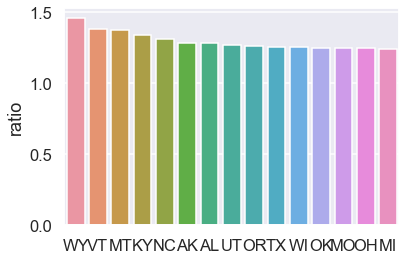

In [193]:

sns.barplot(x=interest_addr_status.head(15).index.values,y=interest_addr_status['ratio'].head(15))

In [194]:
#Average interest ratio
interest_addr_status['ratio'].mean()

1.2058297872340427

In wyoming charged off borrowers had paid interest 1.5 times more than Fully Paid Borrower. Also, it is seen that those who have got charged off have paid interest on an average 1.2 times the fully paid.

In [195]:
#Employee title rank plot and distribution
emp_counts=pd.DataFrame(data['emp_title'].value_counts().sort_values(ascending=False).head(10))
emp_counts.rename(columns={'emp_title':'freq'},inplace=True)
emp_counts['rank']=emp_counts['freq'].rank(ascending=False)


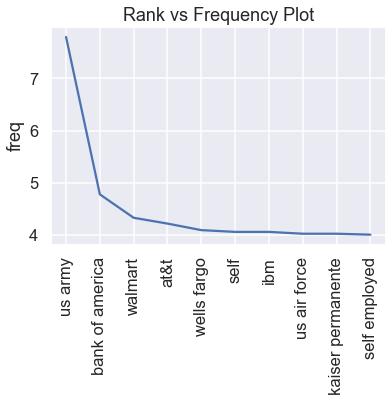

In [196]:
plt.title("Rank vs Frequency Plot")
plt.xticks(rotation=90)
sns.lineplot(x=emp_counts.index,y=np.log(emp_counts['freq']))
plt.show()

<AxesSubplot:xlabel='loan_status,emp_title'>

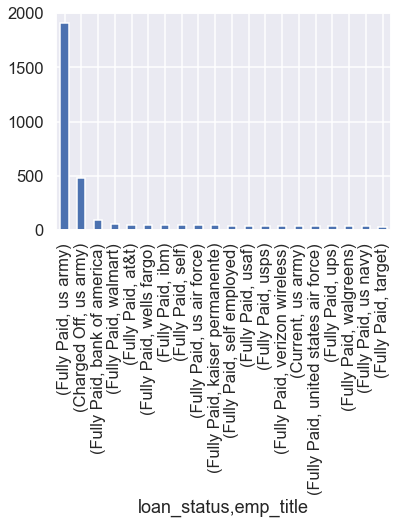

In [197]:
#Frequency of employee title based on loan status
data.groupby(['loan_status','emp_title'],sort=True)['purpose'].size().sort_values(ascending=False).head(20).plot(kind='bar')

We can see that maximum employee title is US Army,and maximum charged off as well as fully paid are from the same employee title

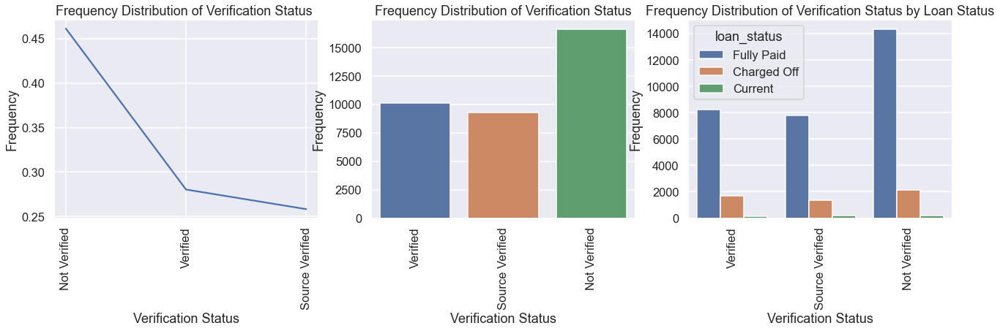

In [198]:
#Rank plot of verification and distribution
verification_dist=data['verification_status'].value_counts(normalize=True).sort_values(ascending=False)
plt.figure(figsize=(22,5))
plt.subplot(1,3,1)
plt.title("Frequency Distribution of Verification Status ")
sns.lineplot(data=verification_dist)
plt.xlabel("Verification Status")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(1,3,2)
plt.title("Frequency Distribution of Verification Status")
sns.countplot(x='verification_status',data=data)
plt.xlabel("Verification Status")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.subplot(1,3,3)
plt.title("Frequency Distribution of Verification Status by Loan Status")
sns.countplot(x='verification_status',data=data,hue='loan_status')
plt.xlabel("Verification Status")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

We can see that maximum borrowers were not verified. Out of all the borrowers who were charged off were not verified.

#### Univariate Analysis - Ordered Categorical Variable :

Ordered Categorical Variable :

- term

- Grade

- Sub Grade

- emp_length

- issue_d

- last_pymnt_d	

- last_credit_pull_d	

- pub_rec_bankruptcies


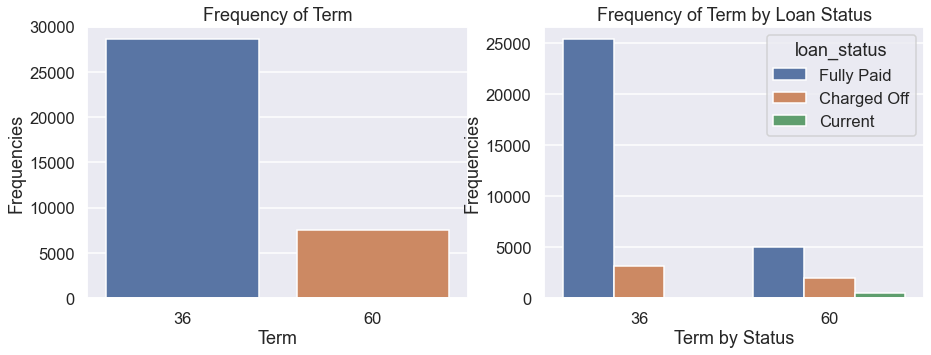

In [199]:
#Term Distribution 
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title("Frequency of Term")
sns.countplot(x='term',data=data)
plt.xlabel("Term")
plt.ylabel("Frequencies")
plt.subplot(1,2,2)
plt.title("Frequency of Term by Loan Status")
sns.countplot(x='term',data=data,hue='loan_status')
plt.xlabel("Term by Status")
plt.ylabel("Frequencies")
plt.show()

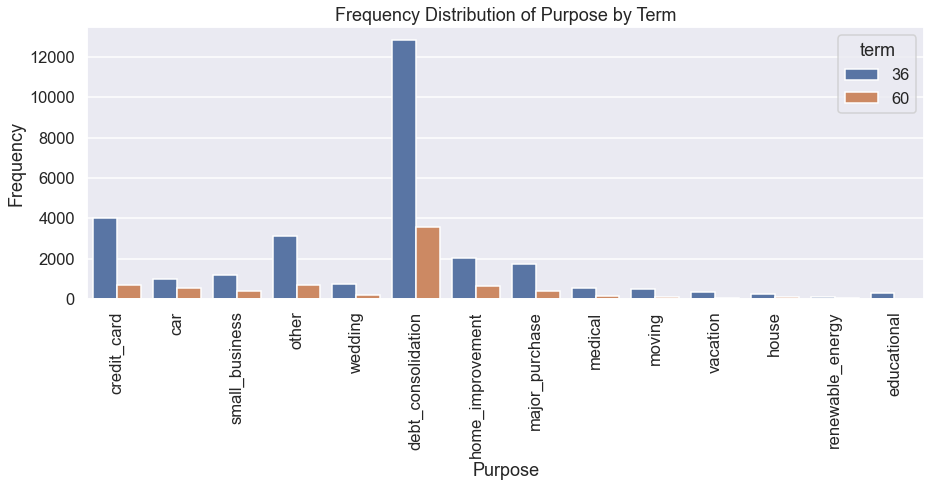

In [200]:
#Term Distribution based on purpose
plt.figure(figsize=(15,5))
plt.title("Frequency Distribution of Purpose by Term")
sns.countplot(x='purpose',data=data,hue='term')
plt.xlabel("Purpose")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

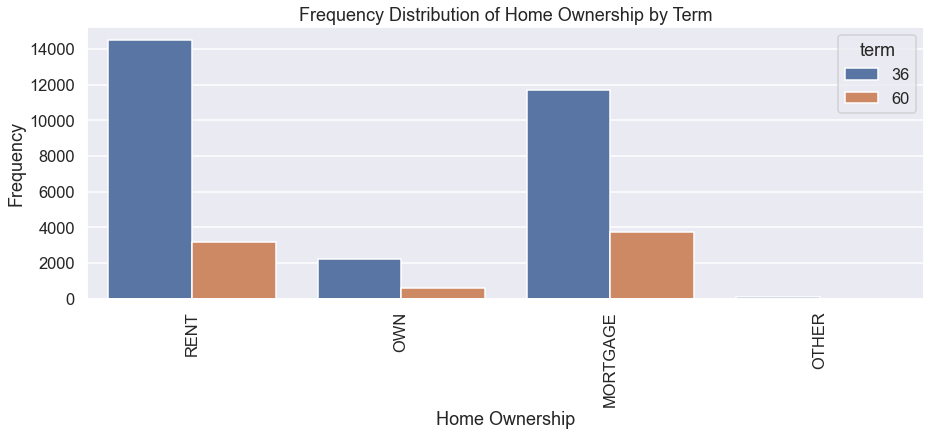

In [201]:
#Term Distribution based on ownership
plt.figure(figsize=(15,5))
plt.title("Frequency Distribution of Home Ownership by Term")
sns.countplot(x='home_ownership',data=data,hue='term')
plt.xlabel("Home Ownership")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

- We have seen most borrowers prefer 36 months duration , i.e short duration
- Most charged off borrowers are from 36 months duration. 
- Majority of borrowers who prefer 60 months duration have purpose of debt consolidation
- Majorly for Rent and Mortgage, long duration loan were taken

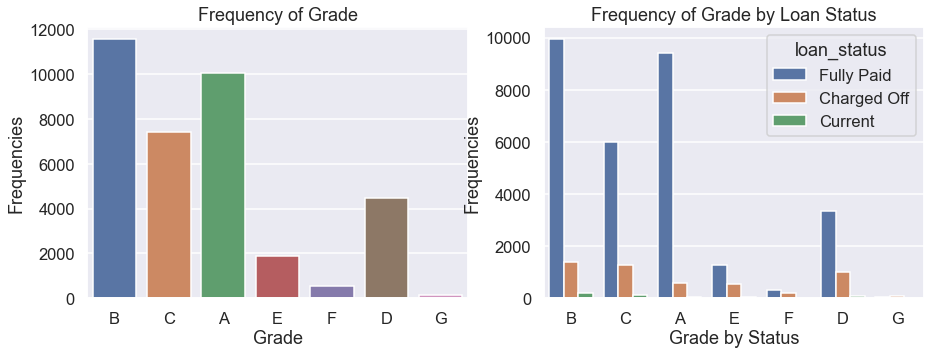

In [202]:
#Grade Distribution
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title("Frequency of Grade")
sns.countplot(x='grade',data=data)
plt.xlabel("Grade")
plt.ylabel("Frequencies")
plt.subplot(1,2,2)
plt.title("Frequency of Grade by Loan Status")
sns.countplot(x='grade',data=data,hue='loan_status')
plt.xlabel("Grade by Status")
plt.ylabel("Frequencies")
plt.show()

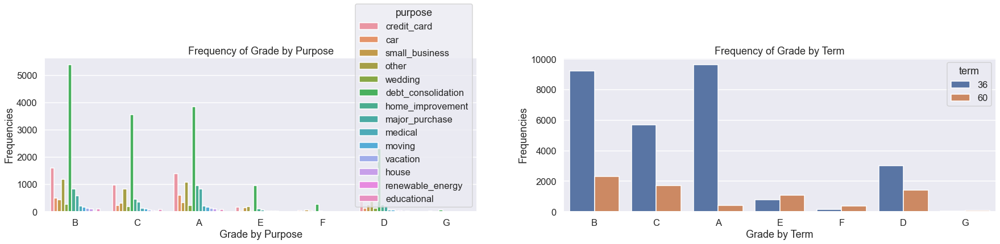

In [203]:
#Grade by purpose and term
plt.figure(figsize=(30,5))
plt.subplot(1,2,1)
plt.title("Frequency of Grade by Purpose")
sns.countplot(x='grade',data=data,hue='purpose')
plt.xlabel("Grade by Purpose")
plt.ylabel("Frequencies")
plt.subplot(1,2,2)
plt.title("Frequency of Grade by Term")
sns.countplot(x='grade',data=data,hue='term')
plt.xlabel("Grade by Term")
plt.ylabel("Frequencies")
plt.show()

- Most of the customers belong to Grade B and A. 
- Most of the borrowers who were charged off belongs to grade B,C & D
- Of all the grades , there is higher frequencies for debt consoldiation and credit card. 
- Grade E & F have higher frequencies for longer duration , i.e 60 months than shorter duration , i.e 36 months

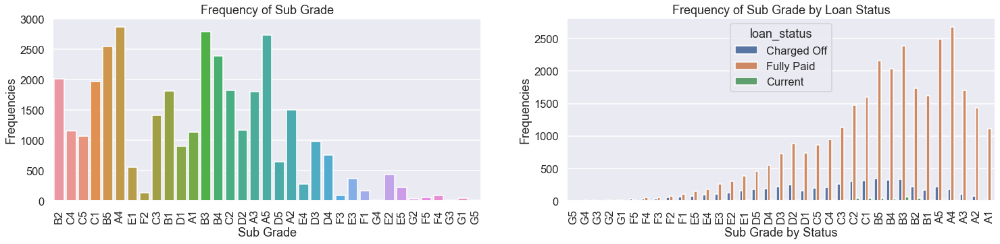

In [204]:
#Sub Grade Distribution
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Sub Grade")
sns.countplot(x='sub_grade',data=data)
plt.xlabel("Sub Grade")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Sub Grade by Loan Status")
sns.countplot(x='sub_grade',data=data.sort_values(by='sub_grade',ascending=False),hue='loan_status')
plt.xlabel("Sub Grade by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

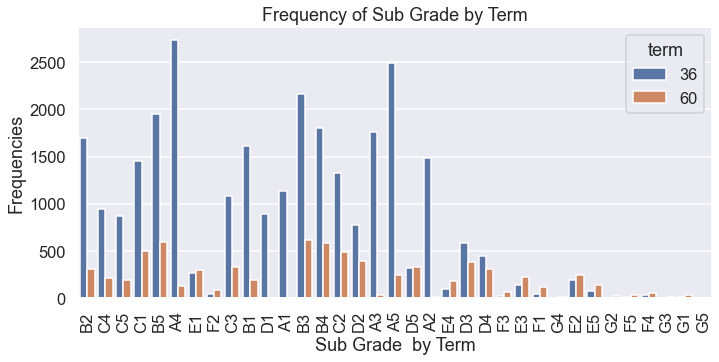

In [205]:
#Sub Grade Distribution By term 
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Sub Grade by Term")
sns.countplot(x='sub_grade',data=data,hue='term')
plt.xlabel("Sub Grade  by Term")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)

plt.show()

- Most of the people belong to A4,A5,B3,B5
- Majority of Charged of Borrowers belongs to C1,B5,B3 & B4
- Majority of long term loan borrower lies in B3,B4,C2
- Off the grades B,C & D , most of the charged off borrowers belonged to :

    1. Grade B : B3,B4,B5
    
    2. Grade C : C1,C3,C2
    
    3. Grade D : D2,D3,D4

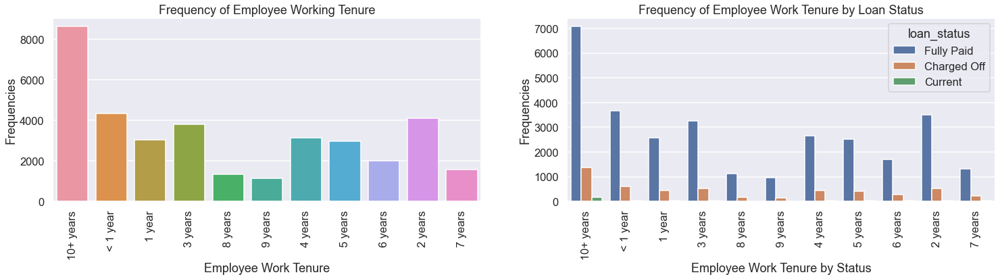

In [206]:
#Employee work tenure Distribution
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Employee Working Tenure")
sns.countplot(x='emp_length',data=data)
plt.xlabel("Employee Work Tenure")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Employee Work Tenure by Loan Status")
sns.countplot(x='emp_length',data=data,hue='loan_status')
plt.xlabel("Employee Work Tenure by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

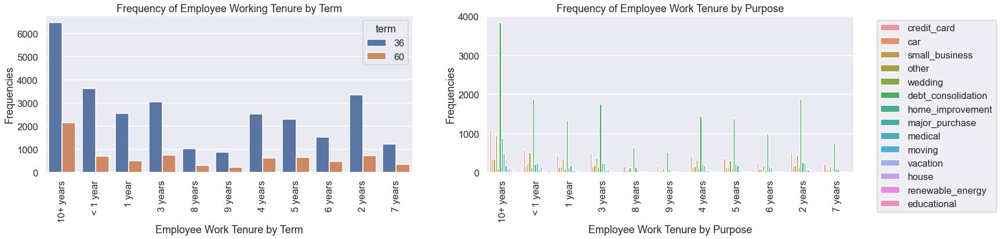

In [207]:
#Employee work tenure Distribution based on term and purpose
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Employee Working Tenure by Term")
sns.countplot(x='emp_length',data=data,hue='term')
plt.xlabel("Employee Work Tenure by Term")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Employee Work Tenure by Purpose")
sns.countplot(x='emp_length',data=data,hue='purpose')
plt.xlabel("Employee Work Tenure by Purpose")
plt.ylabel("Frequencies")
plt.legend(loc='upper right', bbox_to_anchor=(1.4, 1))
plt.xticks(rotation=90)
plt.show()

- We see maximum working tenure of a borrower is of 10+ years. Borrowers of the same have been charged off the most!
- Maximum 36 months and 60 months loans were taken by borrowers who had 10+ years experience
- Majority of borrowers with 10+ years of experience , their purpose of loan was debt consolidation


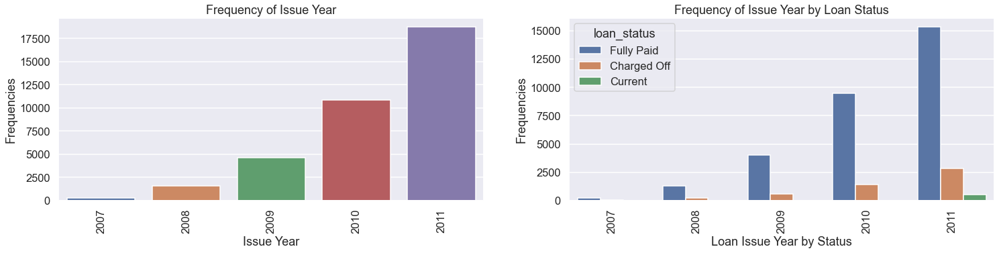

In [208]:
#Issue Year Distribution of Issue Year
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Issue Year")
sns.countplot(x='issue_yr',data=data)
plt.xlabel("Issue Year")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Issue Year by Loan Status")
sns.countplot(x='issue_yr',data=data,hue='loan_status')
plt.xlabel("Loan Issue Year by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

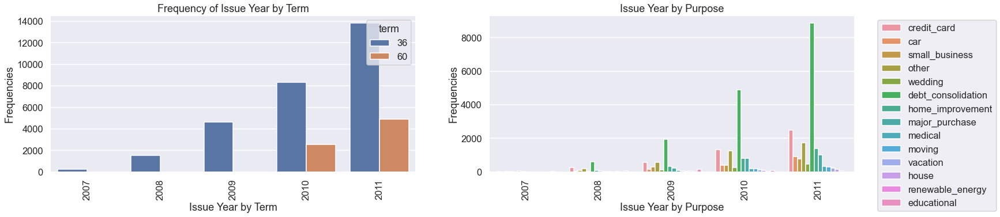

In [209]:
#Issue Year Distribution of Issue Year by Term and purpose
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Issue Year by Term")
sns.countplot(x='issue_yr',data=data,hue='term')
plt.xlabel("Issue Year by Term")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Issue Year by Purpose")
sns.countplot(x='issue_yr',data=data,hue='purpose')
plt.xlabel("Issue Year by Purpose")
plt.ylabel("Frequencies")
plt.legend(loc='upper right', bbox_to_anchor=(1.4, 1))
plt.xticks(rotation=90)
plt.show()

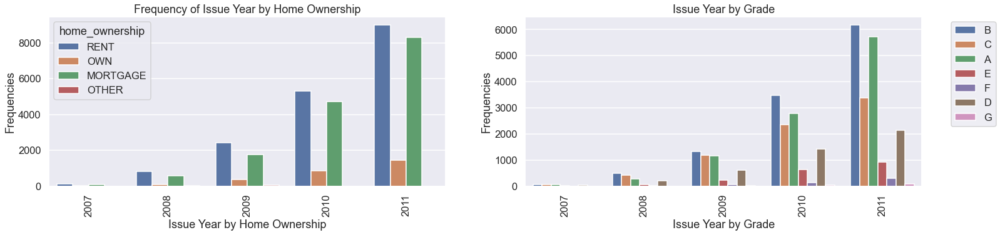

In [210]:
#Issue Year Distribution of Issue Year by home ownership and grade
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Issue Year by Home Ownership")
sns.countplot(x='issue_yr',data=data,hue='home_ownership')
plt.xlabel("Issue Year by Home Ownership")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Issue Year by Grade")
sns.countplot(x='issue_yr',data=data,hue='grade')
plt.xlabel("Issue Year by Grade")
plt.ylabel("Frequencies")
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.xticks(rotation=90)
plt.show()

- Most of the loans were issued in 2010 and 2011. Majority of charged off loans are in 2011 and 2010
- 60 months loans were only given in 2011 and 2010.
- In 2011 and 2010 majority of loans were given for debt consolidation and credit card
- In 2011 and 2010 majority of home ownership was either rented or mortgaged. And majority of them were having grade as B or A

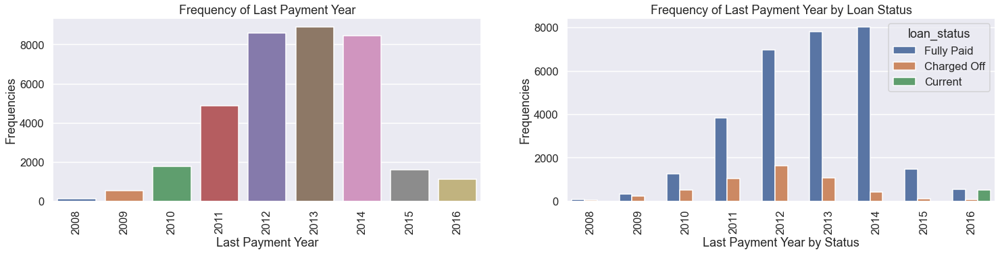

In [211]:
#Issue Year Distribution of Last Payment Year
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Last Payment Year")
sns.countplot(x='last_pymnt_yr',data=data)
plt.xlabel("Last Payment Year")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Last Payment Year by Loan Status")
sns.countplot(x='last_pymnt_yr',data=data,hue='loan_status')
plt.xlabel("Last Payment Year by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

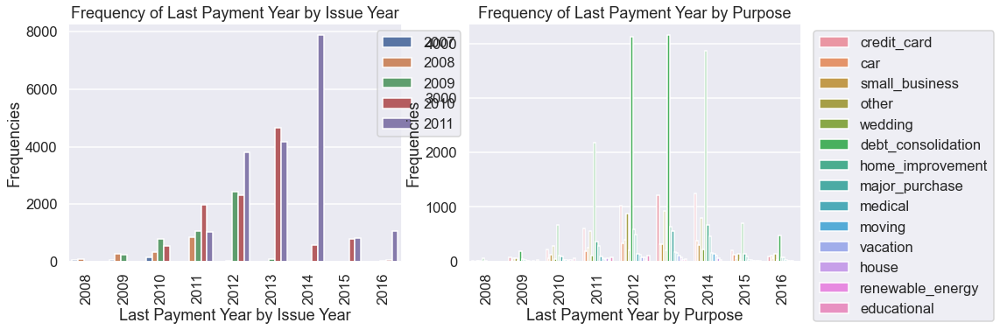

In [212]:
#Issue Year Distribution of Last Payment Year by issue year and purpose
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title("Frequency of Last Payment Year by Issue Year")
sns.countplot(x='last_pymnt_yr',data=data,hue='issue_yr')
plt.xlabel("Last Payment Year by Issue Year")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.subplot(1,2,2)
plt.title("Frequency of Last Payment Year by Purpose")
sns.countplot(x='last_pymnt_yr',data=data,hue='purpose')
plt.xlabel("Last Payment Year by Purpose")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.6, 1))
plt.show()

- Majority of charged off borrowers are those who had made last payment in years between 2010 to 2014
- Majority of borrowers who had made last payment in years between 2010 to 2014, got loan issued in 2010,2011 and 2009. Majority of last payments were made in lieu of debt consolidation and credit card 


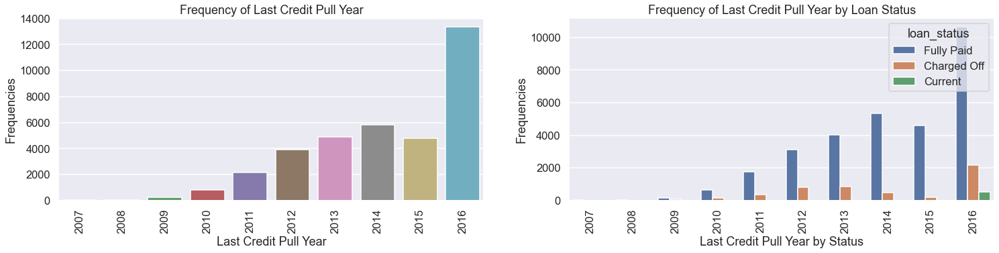

In [213]:
#Issue Year Distribution of Last Credit Pull Year 
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Last Credit Pull Year")
sns.countplot(x='last_credit_pull_yr',data=data)
plt.xlabel("Last Credit Pull Year")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Last Credit Pull Year by Loan Status")
sns.countplot(x='last_credit_pull_yr',data=data,hue='loan_status')
plt.xlabel("Last Credit Pull Year by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

In years 2016,2013,2012 of last credit pull year there were maximum charged off borrowers

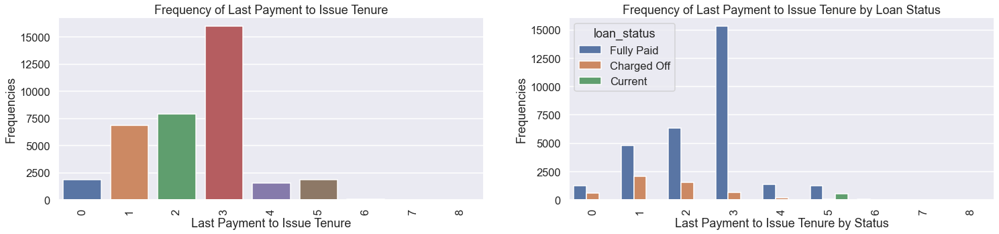

In [214]:
#Issue Year Distribution of Last Payment to Tenure
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Last Payment to Issue Tenure")
sns.countplot(x='last_pymnt_to_issue_Tenure',data=data)
plt.xlabel("Last Payment to Issue Tenure")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Last Payment to Issue Tenure by Loan Status")
sns.countplot(x='last_pymnt_to_issue_Tenure',data=data,hue='loan_status')
plt.xlabel("Last Payment to Issue Tenure by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

- There were maximum charged off borrowers seen for the tenure from the last payment to issue of 1 and 2 year(s) 

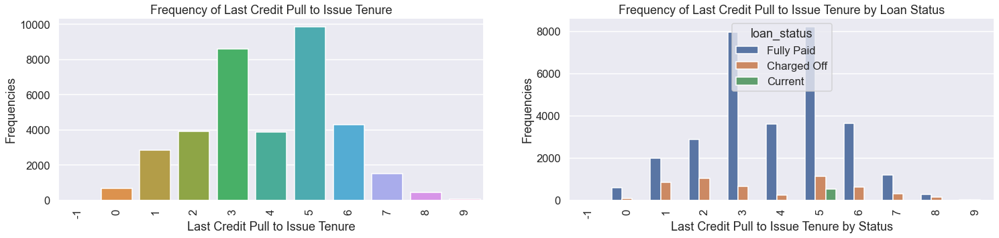

In [215]:
#Issue Year Distribution of Last Credit Pull to issue Tenure
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Last Credit Pull to Issue Tenure")
sns.countplot(x='LC_pull_to_issue_Tenure',data=data)
plt.xlabel("Last Credit Pull to Issue Tenure")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Last Credit Pull to Issue Tenure by Loan Status")
sns.countplot(x='LC_pull_to_issue_Tenure',data=data,hue='loan_status')
plt.xlabel("Last Credit Pull to Issue Tenure by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.show()

For 1,2,3,5 & 6 years of last credit pull to issue tenure we see majority of charged off borrowers

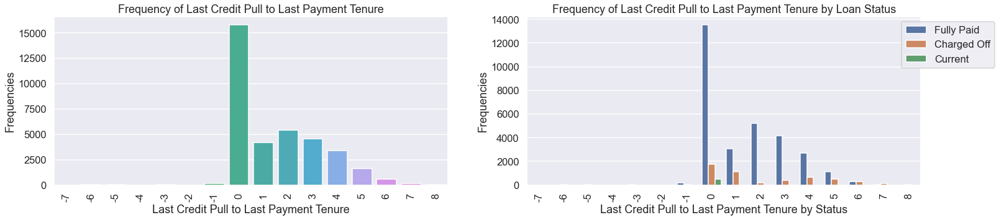

In [216]:
#Issue Year Distribution of Last Payment to Last Payment Tenure
plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
plt.title("Frequency of Last Credit Pull to Last Payment Tenure")
sns.countplot(x='LC_pull_to_pymnt_Tenure',data=data)
plt.xlabel("Last Credit Pull to Last Payment Tenure")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title("Frequency of Last Credit Pull to Last Payment Tenure by Loan Status")
sns.countplot(x='LC_pull_to_pymnt_Tenure',data=data,hue='loan_status')
plt.xlabel("Last Credit Pull to Last Payment Tenure by Status")
plt.ylabel("Frequencies")
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

Most of the last credit pull to last payment tenure is of 0 years, i.e LC pulled the credit mostly in no gap from the last payment.

Major borrowers charged off during tenure of 0 & 1 years

In [217]:
def IQR(x):
    return x.quantile(.75)-x.quantile(.25)
def ninetynine_Perc(x):
    return x.quantile(.99)
def Range(x):
    return x.max()-x.min()

#### Univariate Analysis - Quantitative Variables :

- loan_amnt

- funded_amnt

- funded_amnt_inv

- int_rate

- installment

- annual_inc

- dti

- open_acc

- revol_bal

- revol_util

- total_acc

- out_prncp

- out_prncp_inv

- total_pymnt

- total_pymnt_inv

- total_rec_prncp

- total_rec_int

- total_rec_late_fee

- recoveries

- collection_recovery_fee

- last_pymnt_amnt

- funded_to_applied_amt_diff

- funded_inv_to_applied_amt_diff

- funded_inv_to_funded_amt_diff	

- total_inst	

- balance_amt_of_charged_off

- installment_to_income

- debt


count    36081.000000
mean      9901.306782
std       6157.996320
min        500.000000
25%       5000.000000
50%       8800.000000
75%      13250.000000
max      35000.000000
Name: loan_amnt, dtype: float64


IQR of Loan Amount 8250.0


            loan_amnt                                                      \
             describe                                                       
                count          mean          std     min     25%      50%   
loan_status                                                                 
Charged Off    5166.0  10933.502710  7110.916436   900.0  5000.0   9800.0   
Current         529.0  10267.580340  4677.429638  1000.0  6000.0  11100.0   
Fully Paid    30386.0   9719.443987  5986.343153   500.0  5000.0   8500.0   

                                                                             
                                    IQR ninetynine_Perc     Range      skew  
                 75%      max loan_amnt       loan_amnt loan_amnt 

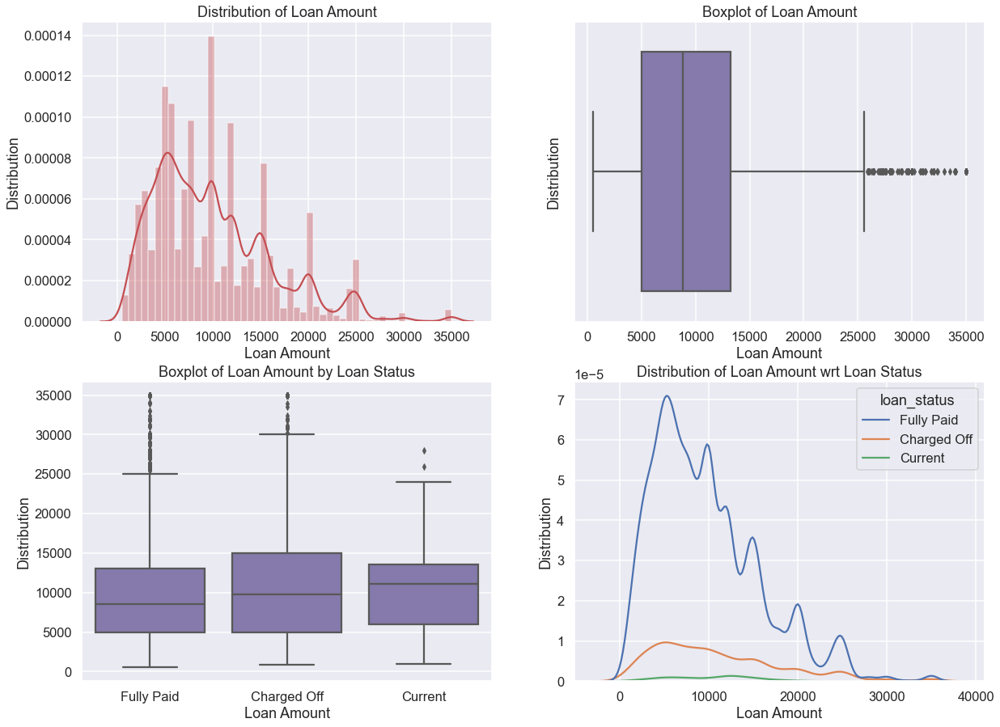

In [218]:
#Distribution of Loan Amount
print(data['loan_amnt'].describe())
print('\n')
print("IQR of Loan Amount {0}".format(IQR(data['loan_amnt'])))
print('\n')
print(data.groupby('loan_status').agg({'loan_amnt':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Loan Amount")
sns.distplot(data['loan_amnt'],hist=True,kde=True,color='r')
plt.xlabel("Loan Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Loan Amount")
sns.boxplot(x='loan_amnt',data=data,color='m')
plt.xlabel("Loan Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Loan Amount by Loan Status")
sns.boxplot(y='loan_amnt',x='loan_status',data=data,color='m')
plt.xlabel("Loan Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Loan Amount wrt Loan Status")
sns.kdeplot(data['loan_amnt'],hue=data['loan_status'])
plt.xlabel('Loan Amount')
plt.ylabel("Distribution")
plt.show()

- Most loans applied for were in range of 5000 to 15000

- We can see that the distribution of loan amount is right skewed

- The true representative of loan amount is of 8800

- The variation in loan amount is around 8250 , i.e It captures 50% of borrowers.

- The trend of median increases from fully paid till current , it states that the borrowers who have fully paid had applied or being issued lesser loan amount , whereas borrowers which were charged off, they have got highest loan amount on the average.

- We see that loan amount for the charged off borrowers have high variation, i.e it means that borrowers tend to be in large debt. Also it states that for different purposes the loans have been taken for.

- We see that the third quantile of charged off borrowers is more than the fully paid and also current borrowers , it states that chance of defaulting is more, but there are around 50% of borrowers who could have avoided to default but they could not . 

- Variation in current is low comparatively to others, which indicate that their purpose for loan is quite similar

count    36081.000000
mean      9668.037887
std       5901.099540
min        500.000000
25%       5000.000000
50%       8500.000000
75%      13000.000000
max      35000.000000
Name: funded_amnt, dtype: float64


IQR of Funded Amount 8000.0


            funded_amnt                                                      \
               describe                                                       
                  count          mean          std     min     25%      50%   
loan_status                                                                   
Charged Off      5166.0  10606.368564  6757.461553   900.0  5000.0   9600.0   
Current           529.0  10024.527410  4392.254370  1000.0  6000.0  10400.0   
Fully Paid      30386.0   9502.303692  5750.920178   500.0  5000.0   8400.0   

                                                                       \
                                      IQR ninetynine_Perc       Range   
                 75%      max funded_amnt     funded_amnt 

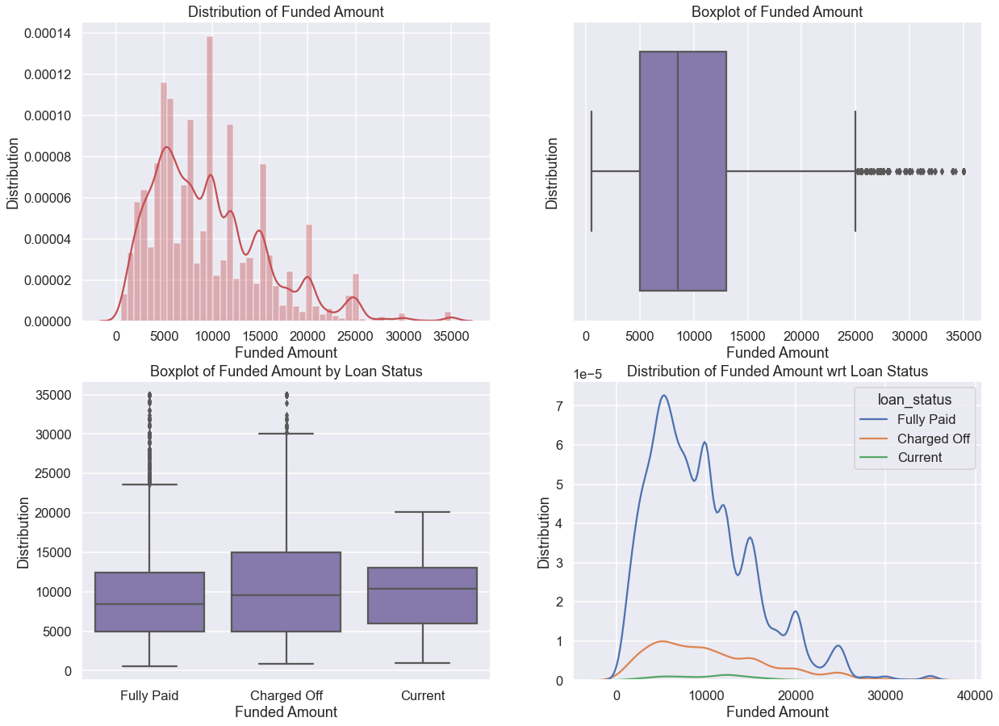

In [219]:
#Distribution of Funded Amount
print(data['funded_amnt'].describe())
print('\n')
print("IQR of Funded Amount {0}".format(IQR(data['funded_amnt'])))
print('\n')
print(data.groupby('loan_status').agg({'funded_amnt':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Funded Amount")
sns.distplot(data['funded_amnt'],hist=True,kde=True,color='r')
plt.xlabel("Funded Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Funded Amount")
sns.boxplot(x='funded_amnt',data=data,color='m')
plt.xlabel("Funded Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Funded Amount by Loan Status")
sns.boxplot(y='funded_amnt',x='loan_status',data=data,color='m')
plt.xlabel("Funded Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Funded Amount wrt Loan Status")
sns.kdeplot(data['funded_amnt'],hue=data['loan_status'])
plt.xlabel('Funded Amount')
plt.ylabel("Distribution")
plt.show()

- Most loan funded were in range of 5000 to 15000

- We can see that the distribution of loan amount is right skewed

- The true representative of loan amount is of 8500

- The variation in loan amount is around 8000 , i.e It captures 50% of borrowers.

- The average funded amount of borrowers who got charged off is more than the fully paid.

- We see that funded amount for the charged off borrowers have high variation, i.e it means that borrowers tend to be in large debt. Also it states that for different purposes the loans have been taken for. 

- We see that the third quantile of charged off borrowers is more than the fully paid and also current borrowers , it states that chance of defaulting is more, but there are around 50% of borrowers who could have avoided to default but they could not . 

- Variation in current is low comparatively to others, which indicate that their purpose for loan is quite similar

- The distribution of funded amount is more similar to loan amount. It also means that it is most likely that qualified borrowers are going to get the loan they had applied for. Let's see if they have high correlation , then we can choose a variable of the two . 

count    36081.000000
mean      9123.818051
std       5817.612025
min          0.000000
25%       4900.000000
50%       8000.000000
75%      12000.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64


IQR of Funded Amount by Investor 7100.0


            funded_amnt_inv                                            \
                   describe                                             
                      count         mean          std     min     25%   
loan_status                                                             
Charged Off          5166.0  9690.938288  6561.340280     0.0  4800.0   
Current               529.0  9937.119554  4334.709515  1000.0  6000.0   
Fully Paid          30386.0  9013.241482  5697.810021     0.0  4900.0   

                                                                            \
                                                       IQR ninetynine_Perc   
                     50%      75%      max funded_amnt_inv funded_amnt_inv

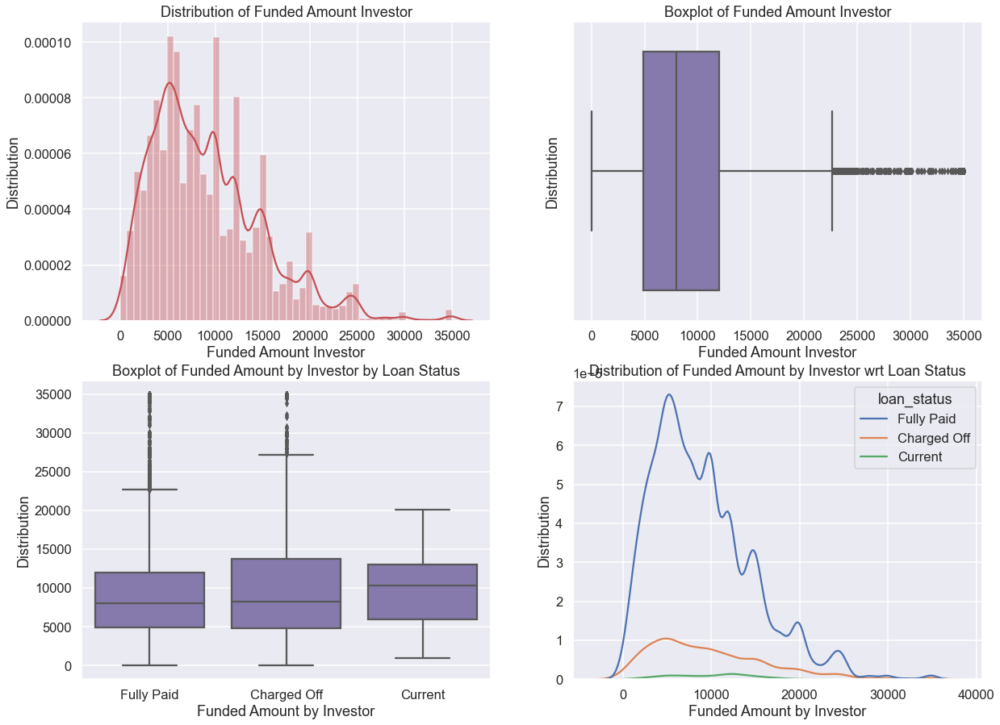

In [220]:
#Distribution of Funded Amount by Investor
print(data['funded_amnt_inv'].describe())
print('\n')
print("IQR of Funded Amount by Investor {0}".format(IQR(data['funded_amnt_inv'])))
print('\n')
print(data.groupby('loan_status').agg({'funded_amnt_inv':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Funded Amount Investor")
sns.distplot(data['funded_amnt_inv'],hist=True,kde=True,color='r')
plt.xlabel("Funded Amount Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Funded Amount Investor")
sns.boxplot(x='funded_amnt_inv',data=data,color='m')
plt.xlabel("Funded Amount Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Funded Amount by Investor by Loan Status")
sns.boxplot(y='funded_amnt_inv',x='loan_status',data=data,color='m')
plt.xlabel("Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Funded Amount by Investor wrt Loan Status")
sns.kdeplot(data['funded_amnt_inv'],hue=data['loan_status'])
plt.xlabel('Funded Amount by Investor')
plt.ylabel("Distribution")
plt.show()

- We can see that the distribution of loan amount is right skewed

- The true representative of loan amount is of 8000

- The variation in loan amount is around 7100 , i.e It captures 50% of borrowers.

- The trend of median increases from fully paid till current , it states that the borrowers who have fully paid had applied or being issued lesser loan amount , where off lately the borrowers which are current they have got highest loan amount on the average.

- We see that funded amount investor for the charged off borrowers have high variation, i.e it means that borrowers tend to be in large debt. Also it states that for different purposes the loans have been taken for. 

- We see that the third quantile of charged off borrowers is more than the fully paid and also current borrowers , it states that chance of defaulting is more, but there are around 50% of borrowers who could have avoided to default but they could not . 

- Variation in current is low comparatively to others, which indicate that their purpose for loan is quite similar

- The distribution of funded amount is more similar to loan amount , let's see if they have high correlation , then we can choose a variable of the two .

- The distribution of Funded amount by investor with respect to current borrowers are left skewed

In [221]:
#Correlation 
data[['loan_amnt','funded_amnt','funded_amnt_inv']].corr()

,loan_amnt,funded_amnt,funded_amnt_inv
loan_amnt,1.000000,0.978088,0.918579
funded_amnt,0.978088,1.000000,0.940744
funded_amnt_inv,0.918579,0.940744,1.000000


**We confirm that there is high correlation between loan amount , funded amount and funded amount by investors. Also the distribution of these are very alike. Hence its change on loan status will also be alike.**

count    36081.000000
mean        11.566447
std          3.465442
min          5.420000
25%          8.880000
50%         11.490000
75%         13.980000
max         24.400000
Name: int_rate, dtype: float64


IQR of Interest Rate 5.1


            int_rate                                                         \
            describe                                                          
               count       mean       std   min    25%    50%    75%    max   
loan_status                                                                   
Charged Off   5166.0  13.472559  3.513656  5.42  11.09  13.45  15.96  24.40   
Current        529.0  13.407448  3.237369  6.00  10.99  12.99  15.96  22.94   
Fully Paid   30386.0  11.210333  3.343037  5.42   8.00  11.11  13.49  23.91   

                                                         
                 IQR ninetynine_Perc    Range      skew  
            int_rate        int_rate int_rate  int_rate  
loan_status                         

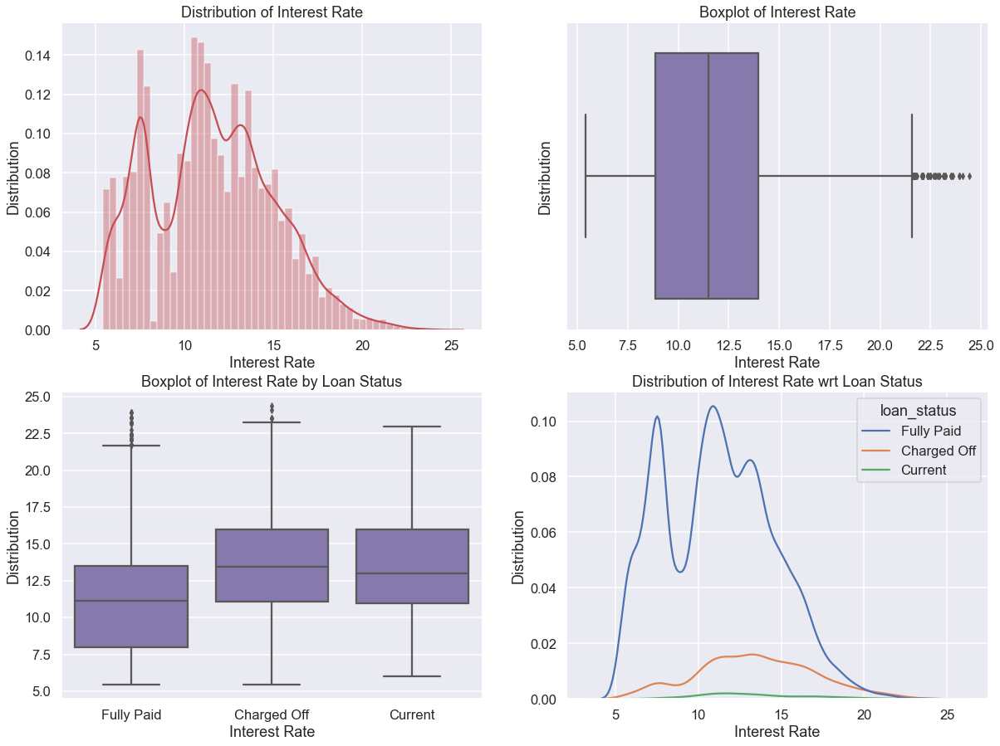

In [222]:
#Distribution of Interest rate
print(data['int_rate'].describe())
print('\n')
print("IQR of Interest Rate {0}".format(IQR(data['int_rate'])))
print('\n')
print(data.groupby('loan_status').agg({'int_rate':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Interest Rate")
sns.distplot(data['int_rate'],hist=True,kde=True,color='r')
plt.xlabel("Interest Rate")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Interest Rate")
sns.boxplot(x='int_rate',data=data,color='m')
plt.xlabel("Interest Rate")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Interest Rate by Loan Status")
sns.boxplot(y='int_rate',x='loan_status',data=data,color='m')
plt.xlabel("Interest Rate")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Interest Rate wrt Loan Status")
sns.kdeplot(data['int_rate'],hue=data['loan_status'])
plt.xlabel('Interest Rate')
plt.ylabel("Distribution")
plt.show()

- Data is positive skewed

- Variation in IQR is 5.1

- Representative Average of IQR is 11.49

- There is high variation in interest rate for those who have fully paid their debt, but their interest rate range is lesser as compared to Charged of & Current . For Fully Paid 75% borrowers had interest rate below : 13.49% whereas interest rate for borrowers who were charged off and are current, it lies below 15.96%.

- Which means that , lot of people those who have fully paid , had borrowed because of the lower interest rate.

- Variation for charged off and current are quite condensed, which means interest rate are not volatile and they are in respect for some specific type of loans for specific purposes.

count    36081.000000
mean       293.287415
std        179.495917
min         35.140000
25%        159.590000
50%        258.450000
75%        385.070000
max        826.420000
Name: installment, dtype: float64


IQR of Installment 225.48


            installment                                                 \
               describe                                                  
                  count        mean         std    min     25%     50%   
loan_status                                                              
Charged Off      5166.0  307.094582  190.971949  35.14  163.01  271.45   
Current           529.0  227.872949   94.957753  35.14  146.74  247.94   
Fully Paid      30386.0  292.078846  178.305972  35.14  159.29  256.76   

                                                                       \
                                      IQR ninetynine_Perc       Range   
                  75%     max installment     installment installment   
loan_status           

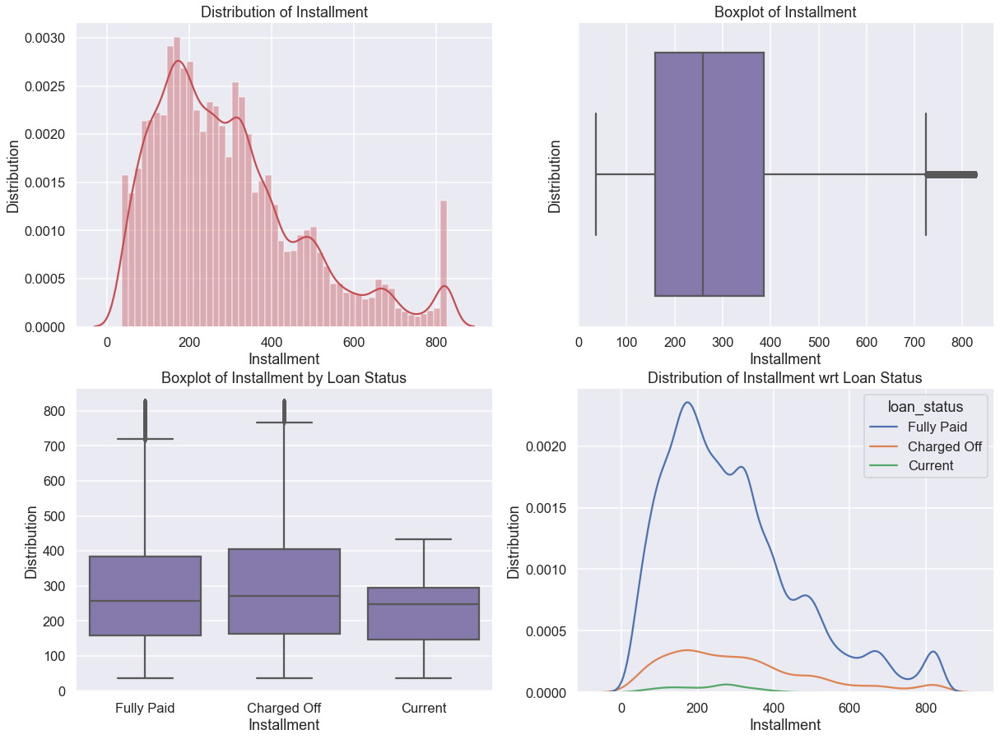

In [223]:
#Distribution of Installment
print(data['installment'].describe())
print('\n')
print("IQR of Installment {0}".format(IQR(data['installment'])))
print('\n')
print(data.groupby('loan_status').agg({'installment':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Installment")
sns.distplot(data['installment'],hist=True,kde=True,color='r')
plt.xlabel("Installment")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Installment")
sns.boxplot(x='installment',data=data,color='m')
plt.xlabel("Installment")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Installment by Loan Status")
sns.boxplot(y='installment',x='loan_status',data=data,color='m')
plt.xlabel("Installment")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Installment wrt Loan Status")
sns.kdeplot(data['installment'],hue=data['loan_status'])
plt.xlabel('Installment')
plt.ylabel("Distribution")
plt.show()

- We see the data is bit right skewed

- The average installment paid by a borrower is 258.45

- Variation in the installment is 225.48, which means it captures 50% of the borrowers installments.

- The average installment paid by the borrowers who were charged off was 271.45, which was more than fully paid and current borrowers.

- Borrowers belonging to charged off category had highest variation in their installments. Which states borrowers tend to pay more installment amount than others. It though includes those also who pay lesser installments , but majority is of those paying higher installment amount. It can be because they had been charged higher interest rate.

- Current borrowers installment variation is minimum though it has high interest rate, it can be because of that their payment tenure is probably bigger or their loan amount is lesser than the others.


count     36081.000000
mean      62948.992440
std       31364.857947
min       19425.420000
25%       40000.000000
50%       56000.000000
75%       80000.000000
max      144792.900000
Name: annual_inc, dtype: float64


IQR of Annual Income 40000.0


            annual_inc                                                 \
              describe                                                  
                 count          mean           std       min      25%   
loan_status                                                             
Charged Off     5166.0  57690.969125  29511.068525  19425.42  36000.0   
Current          529.0  59411.415009  27676.696427  19425.42  40000.0   
Fully Paid     30386.0  63904.509023  31637.867170  19425.42  40000.0   

                                                                               \
                                               IQR ninetynine_Perc      Range   
                 50%      75%       max annual_inc      annual_inc annual_in

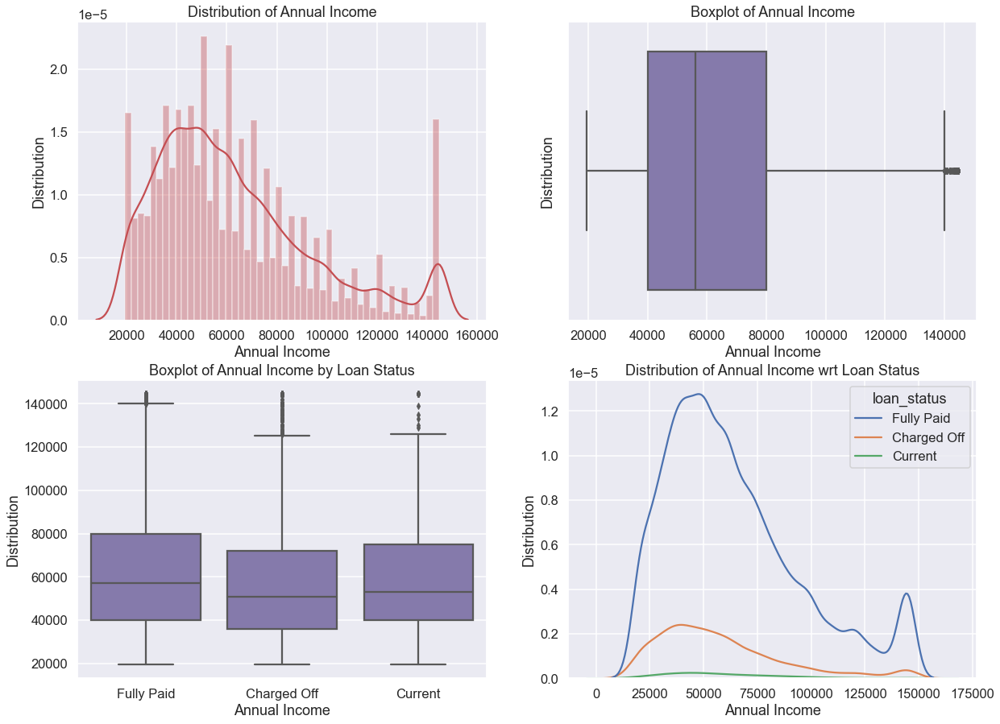

In [224]:
#Distribution of Annual Income
print(data['annual_inc'].describe())
print('\n')
print("IQR of Annual Income {0}".format(IQR(data['annual_inc'])))
print('\n')
print(data.groupby('loan_status').agg({'annual_inc':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Annual Income")
sns.distplot(data['annual_inc'],hist=True,kde=True,color='r')
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Annual Income")
sns.boxplot(x='annual_inc',data=data,color='m')
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Annual Income by Loan Status")
sns.boxplot(y='annual_inc',x='loan_status',data=data,color='m')
plt.xlabel("Annual Income")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Annual Income wrt Loan Status")
sns.kdeplot(data['annual_inc'],hue=data['loan_status'])
plt.xlabel('Annual Income')
plt.ylabel("Distribution")
plt.show()

- Data seems to be right skewed

- Average annual income of borrower is 56000

- Variation in annual income is 40000

- Average income of borrowers of charged off category is minimum off the all category, this can be also a reason for them being charged off with their debt.

- We can see the Third Quantile and First Quantile decreases from fully paid to charged off, it means that the borrowers which are charged off they do not belong to sound income group. Such people income distribution is low , either they are not well experienced or they do not have good jobs.

- There is high variation in annual income of Fully paid customers , which states that having good income is a plus for clearing off the debt, though there are people who did not have sound income , but still they managed to clear out the debt. It can be because of other factors also like co-applicants , family have other source of income. He/she had prominent job.

count    36081.000000
mean        13.176673
std          6.694538
min          0.000000
25%          8.000000
50%         13.220000
75%         18.460000
max         29.990000
Name: dti, dtype: float64


IQR of Debt to Income 10.46


                 dti                                                         \
            describe                                                          
               count       mean       std  min   25%    50%      75%    max   
loan_status                                                                   
Charged Off   5166.0  13.891957  6.635776  0.0  8.92  14.16  19.2575  29.85   
Current        529.0  14.470548  7.084368  0.0  9.09  14.02  19.9800  29.95   
Fully Paid   30386.0  13.032540  6.687503  0.0  7.84  13.03  18.2775  29.99   

                                                       
                 IQR ninetynine_Perc  Range      skew  
                 dti             dti    dti       dti  
loan_status                                 

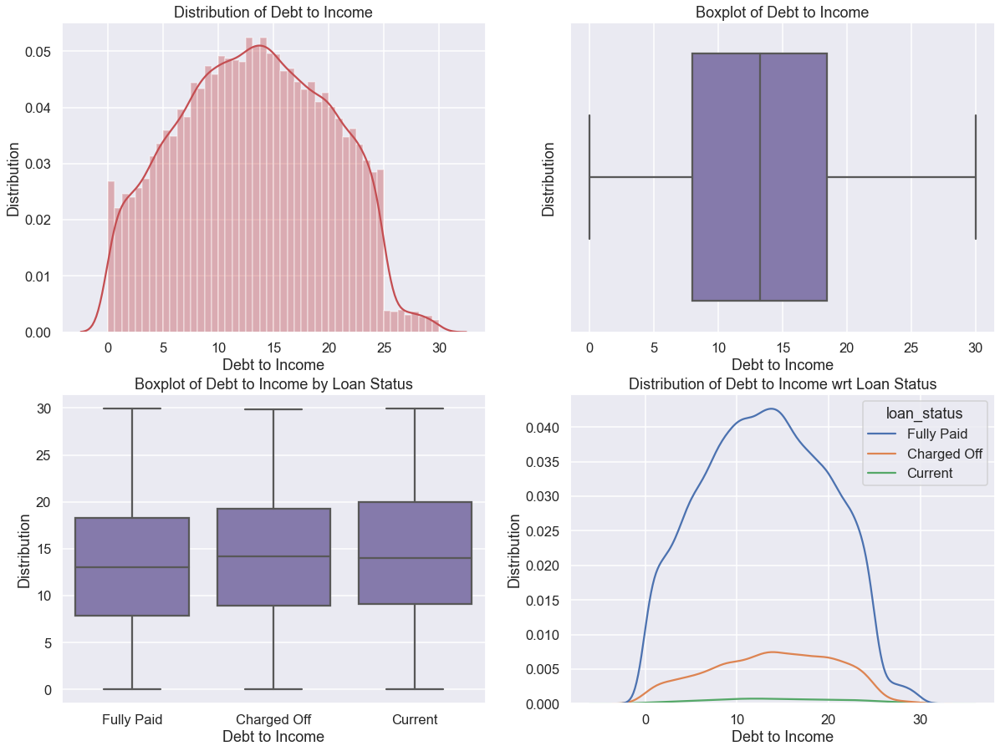

In [225]:
#Distribution of DTI
print(data['dti'].describe())
print('\n')
print("IQR of Debt to Income {0}".format(IQR(data['dti'])))
print('\n')
print(data.groupby('loan_status').agg({'dti':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Debt to Income")
sns.distplot(data['dti'],hist=True,kde=True,color='r')
plt.xlabel("Debt to Income")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Debt to Income")
sns.boxplot(x='dti',data=data,color='m')
plt.xlabel("Debt to Income")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Debt to Income by Loan Status")
sns.boxplot(y='dti',x='loan_status',data=data,color='m')
plt.xlabel("Debt to Income")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Debt to Income wrt Loan Status")
sns.kdeplot(data['dti'],hue=data['loan_status'])
plt.xlabel('Debt to Income')
plt.ylabel("Distribution")
plt.show()

- Data does not seem to be skewed 

- Average debt to income ratio is 13.22

- Variation in debt to income ratio is 10.46

- We can see that average debt to income ratio is more of charged off borrowers . Which means that their debt was a higher chunk of contribution from their income as compared to fully paid and current.

- We can see that current borrowers have high variation in debt to income ratio, which states that there are major portion of the current borrowers whose dti is more , which make them potential defaulters. 

count    36081.000000
mean         9.147834
std          4.181370
min          3.000000
25%          6.000000
50%          8.000000
75%         12.000000
max         21.000000
Name: open_acc, dtype: float64


IQR of Open Account 6.0


            open_acc                                                          \
            describe                                                     IQR   
               count      mean       std  min  25%  50%   75%   max open_acc   
loan_status                                                                    
Charged Off   5166.0  9.049748  4.278002  3.0  6.0  8.0  11.0  21.0      5.0   
Current        529.0  9.438563  3.983929  3.0  6.0  9.0  12.0  21.0      6.0   
Fully Paid   30386.0  9.159448  4.167832  3.0  6.0  8.0  12.0  21.0      6.0   

                                                
            ninetynine_Perc    Range      skew  
                   open_acc open_acc  open_acc  
loan_status                                     
Charged 

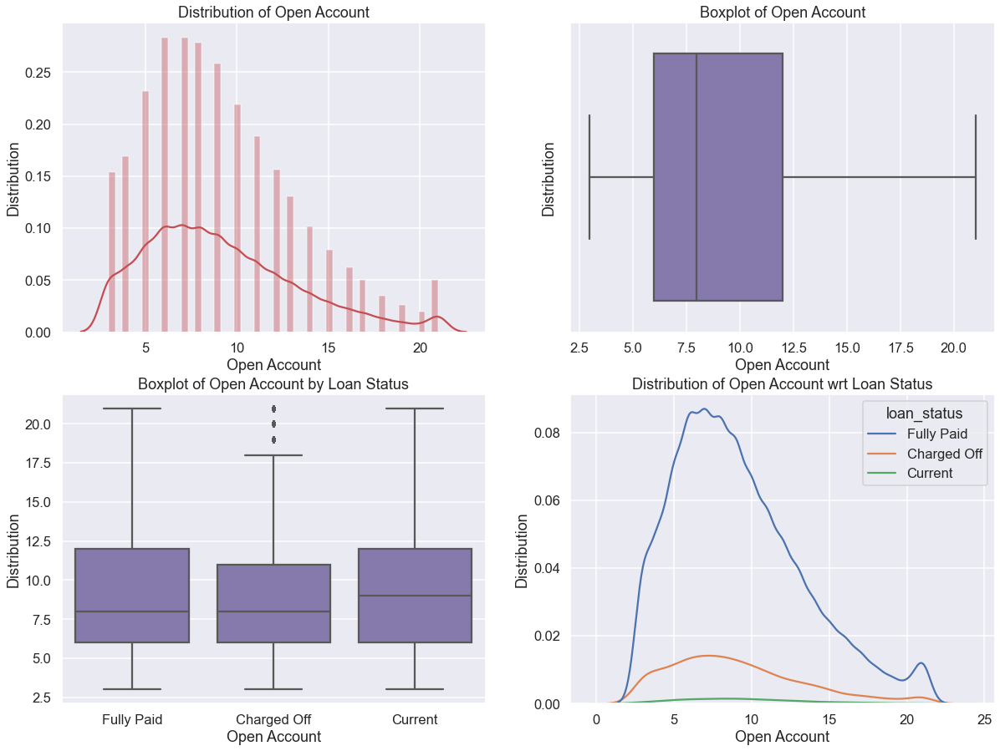

In [226]:
#Distribution of Open Account
print(data['open_acc'].describe())
print('\n')
print("IQR of Open Account {0}".format(IQR(data['open_acc'])))
print('\n')
print(data.groupby('loan_status').agg({'open_acc':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Open Account")
sns.distplot(data['open_acc'],hist=True,kde=True,color='r')
plt.xlabel("Open Account")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Open Account")
sns.boxplot(x='open_acc',data=data,color='m')
plt.xlabel("Open Account")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Open Account by Loan Status")
sns.boxplot(y='open_acc',x='loan_status',data=data,color='m')
plt.xlabel("Open Account")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Open Account wrt Loan Status")
sns.kdeplot(data['open_acc'],hue=data['loan_status'])
plt.xlabel('Open Account')
plt.ylabel("Distribution")
plt.show()

- Data is positive skewed 

- There is not much difference in the average of open account with respect to different loan statuses , hence it is not possible to state with surety that open account has any affect on loan status or not 

count    36081.000000
mean     11238.003880
std      10147.978687
min          0.000000
25%       3440.000000
50%       8260.000000
75%      15860.000000
max      37081.750000
Name: revol_bal, dtype: float64


IQR of Revolving Balance 12420.0


            revol_bal                                                    \
             describe                                                     
                count          mean           std  min      25%     50%   
loan_status                                                               
Charged Off    5166.0  11600.052023  10308.621564  0.0  3704.50  8581.0   
Current         529.0  11289.236295   9622.773378  0.0  4197.00  8868.0   
Fully Paid    30386.0  11175.559246  10128.368574  0.0  3404.25  8180.0   

                                                                               
                                      IQR ninetynine_Perc     Range      skew  
                  75%       max revol_bal       revol_bal revol_bal r

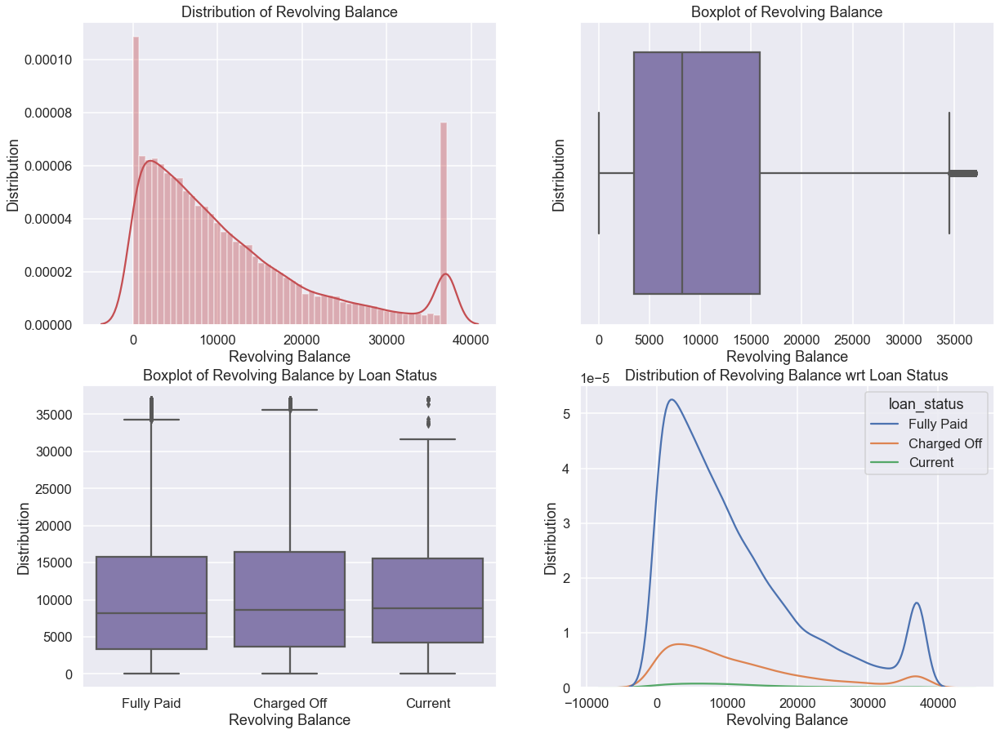

In [227]:
#Distribution of Revolving Balance
print(data['revol_bal'].describe())
print('\n')
print("IQR of Revolving Balance {0}".format(IQR(data['revol_bal'])))
print('\n')
print(data.groupby('loan_status').agg({'revol_bal':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Revolving Balance")
sns.distplot(data['revol_bal'],hist=True,kde=True,color='r')
plt.xlabel("Revolving Balance")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Revolving Balance")
sns.boxplot(x='revol_bal',data=data,color='m')
plt.xlabel("Revolving Balance")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Revolving Balance by Loan Status")
sns.boxplot(y='revol_bal',x='loan_status',data=data,color='m')
plt.xlabel("Revolving Balance")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Revolving Balance wrt Loan Status")
sns.kdeplot(data['revol_bal'],hue=data['loan_status'])
plt.xlabel('Revolving Balance')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average revolving balance - 8260

- Variation in revolving balance - 12420

- Average revolving balance is high for current borrowers - 8868

- We can see highest variation in revolving balance of charged off borrowers , which means major portion of installments goes unpaid at the end of billing cycle. There are large number of people having high unpaid balance . 

- We see that Q3 of Charged Off borrowers is more than fully paid and current borrowers,which states that chance of leaving the balance for next payment(revolving balance) is higher.

count    36081.000000
mean        47.873335
std         28.263122
min          0.000000
25%         24.400000
50%         47.900000
75%         71.200000
max         99.900000
Name: revol_util, dtype: float64


IQR of Revolving Utilization 46.800000000000004


            revol_util                                                       \
              describe                                                        
                 count       mean        std  min     25%   50%   75%   max   
loan_status                                                                   
Charged Off     5166.0  54.672031  28.022194  0.0  33.325  57.2  78.1  99.9   
Current          529.0  46.886030  27.361340  0.0  24.800  45.9  69.3  99.9   
Fully Paid     30386.0  46.734660  28.157791  0.0  23.200  46.4  69.9  99.9   

                                                              
                   IQR ninetynine_Perc      Range       skew  
            revol_util      revol_util revol_util revol_uti

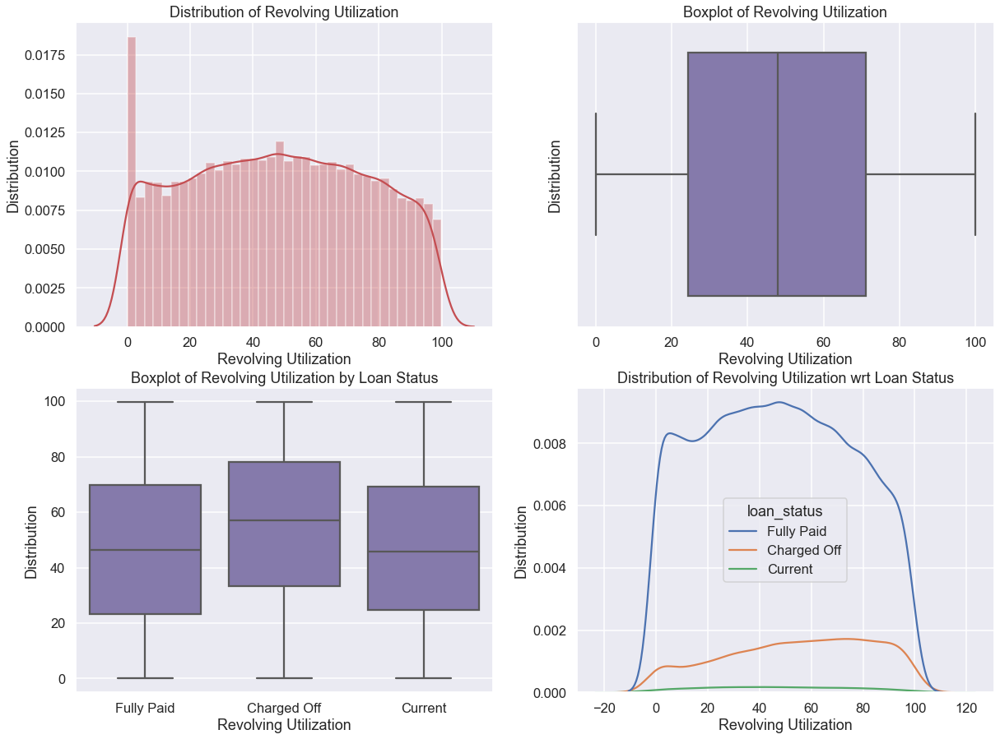

In [228]:
#Distribution of Revolving utilization
print(data['revol_util'].describe())
print('\n')
print("IQR of Revolving Utilization {0}".format(IQR(data['revol_util'])))
print('\n')
print(data.groupby('loan_status').agg({'revol_util':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Revolving Utilization")
sns.distplot(data['revol_util'],hist=True,kde=True,color='r')
plt.xlabel("Revolving Utilization")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Revolving Utilization")
sns.boxplot(x='revol_util',data=data,color='m')
plt.xlabel("Revolving Utilization")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Revolving Utilization by Loan Status")
sns.boxplot(y='revol_util',x='loan_status',data=data,color='m')
plt.xlabel("Revolving Utilization")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Revolving Utilization wrt Loan Status")
sns.kdeplot(data['revol_util'],hue=data['loan_status'])
plt.xlabel('Revolving Utilization')
plt.ylabel("Distribution")
plt.show()

- Data skewness is not present

- Average credit utilization rate is 47.9, variation is 46.8

- Borrowers who were charged off had higher revolving utilization , i.e credit utilization which is 57.2, which means there was less difference in their debt and credit limit.

- Though there is high variation in revolving utilization for borrowers which were fully paid, but borrowers who were charged off comparitively had high revolving utilization rate..

count    36081.000000
mean        21.641224
std         11.282601
min          2.000000
25%         13.000000
50%         20.000000
75%         28.000000
max         79.000000
Name: total_acc, dtype: float64


IQR of Total Account 15.0


            total_acc                                                     \
             describe                                                      
                count       mean        std  min   25%   50%   75%   max   
loan_status                                                                
Charged Off    5166.0  21.009485  11.323258  2.0  12.0  19.0  28.0  74.0   
Current         529.0  21.396975   9.655686  3.0  14.0  21.0  27.0  53.0   
Fully Paid    30386.0  21.752880  11.298664  2.0  13.0  20.0  28.0  79.0   

                                                           
                  IQR ninetynine_Perc     Range      skew  
            total_acc       total_acc total_acc total_acc  
loan_status                                      

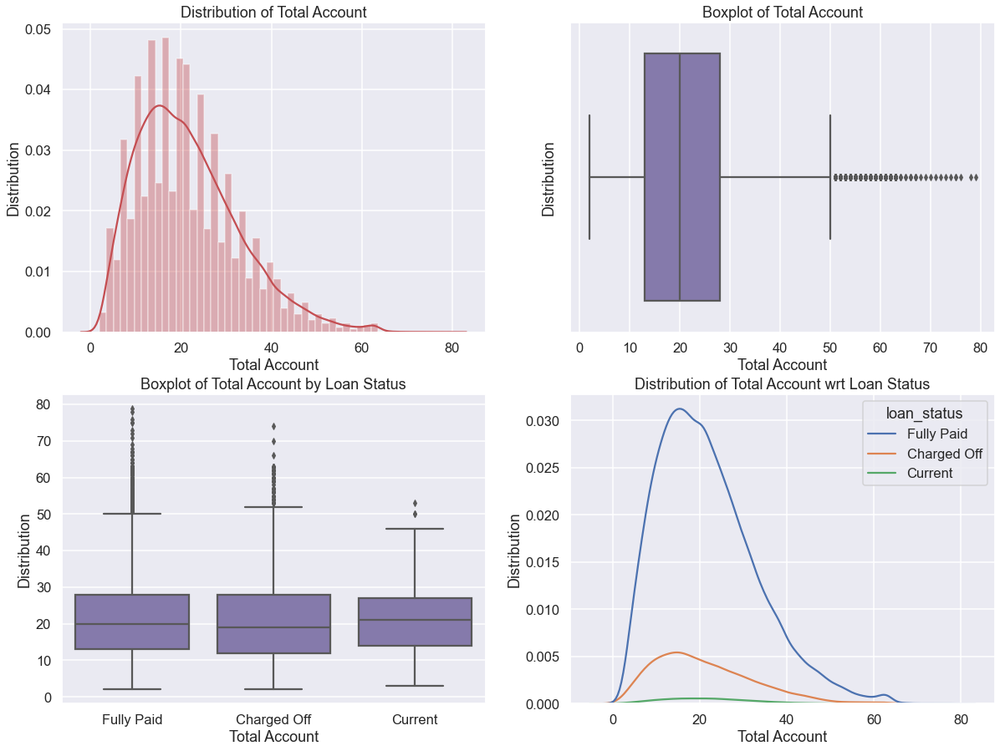

In [229]:
#Distribution of Total Account
print(data['total_acc'].describe())
print('\n')
print("IQR of Total Account {0}".format(IQR(data['total_acc'])))
print('\n')
print(data.groupby('loan_status').agg({'total_acc':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Total Account")
sns.distplot(data['total_acc'],hist=True,kde=True,color='r')
plt.xlabel("Total Account")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Total Account")
sns.boxplot(x='total_acc',data=data,color='m')
plt.xlabel("Total Account")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Total Account by Loan Status")
sns.boxplot(y='total_acc',x='loan_status',data=data,color='m')
plt.xlabel("Total Account")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Total Account wrt Loan Status")
sns.kdeplot(data['total_acc'],hue=data['loan_status'])
plt.xlabel('Total Account')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed 

- Average total account is 20, variation is 15

- Average of charged off, paid off and current are having almost similar , it can be because of randomness . Hence, can not say with surety about how total account affect loan status

- There is not much large difference in variation also between the charged off category vs others .

count    36081.000000
mean        13.823192
std        137.548668
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2943.450000
Name: out_prncp, dtype: float64


IQR of Outstanding Principal 0.0


            out_prncp                                                          \
             describe                                                           
                count        mean         std    min     25%     50%      75%   
loan_status                                                                     
Charged Off    5166.0    0.000000    0.000000   0.00    0.00    0.00     0.00   
Current         529.0  942.825312  644.434797  10.26  427.87  802.83  1359.61   
Fully Paid    30386.0    0.000000    0.000000   0.00    0.00    0.00     0.00   

                                                                    
                           IQR ninetynine_Perc     Range      skew  
                 max out_prncp       out_prncp ou

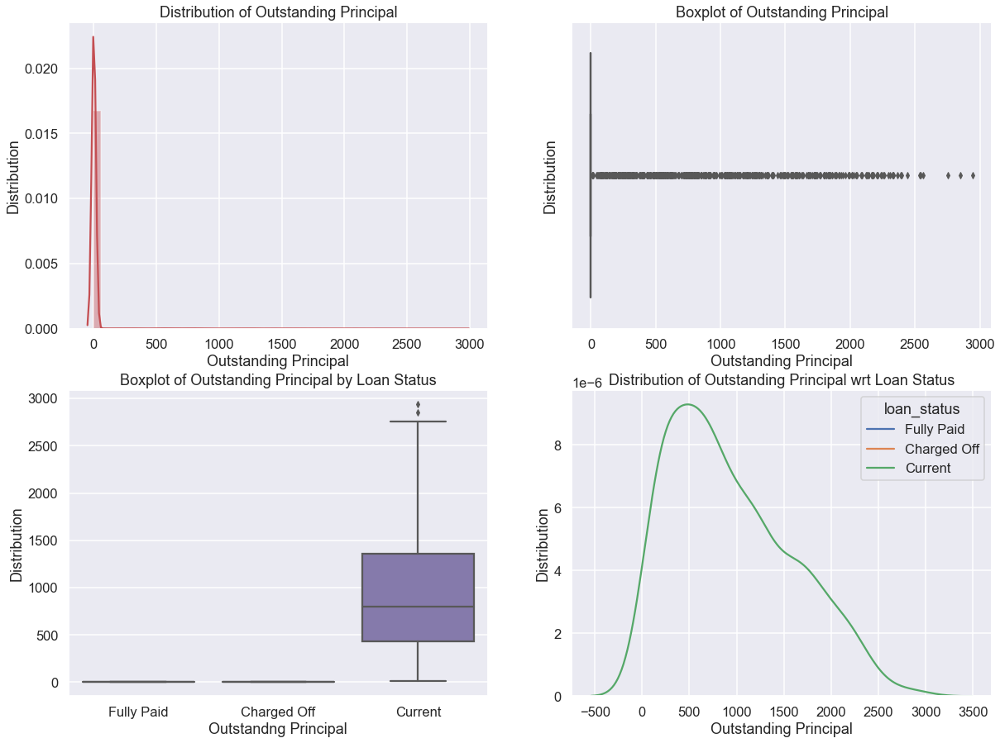

In [230]:
#Distribution of Outstaniding Principal
print(data['out_prncp'].describe())
print('\n')
print("IQR of Outstanding Principal {0}".format(IQR(data['out_prncp'])))
print('\n')
print(data.groupby('loan_status').agg({'out_prncp':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Outstanding Principal")
sns.distplot(data['out_prncp'],hist=True,kde=True,color='r')
plt.xlabel("Outstanding Principal")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Outstanding Principal")
sns.boxplot(x='out_prncp',data=data,color='m')
plt.xlabel("Outstanding Principal")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Outstanding Principal by Loan Status")
sns.boxplot(y='out_prncp',x='loan_status',data=data,color='m')
plt.xlabel("Outstandng Principal")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Outstanding Principal wrt Loan Status")
sns.kdeplot(data['out_prncp'],hue=data['loan_status'])
plt.xlabel('Outstanding Principal')
plt.ylabel("Distribution")
plt.show()

- The data is skewed

- It backs up my earlier made inference that outstanding principal in data is for those borrowers who are current . There won't be any outstanding principal for fully paid or those who have got charged off.

count    36081.000000
mean        13.750157
std        136.845943
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2903.170000
Name: out_prncp_inv, dtype: float64


IQR of Outstanding Principal Investor 0.0


            out_prncp_inv                                                \
                 describe                                                 
                    count        mean        std    min     25%     50%   
loan_status                                                               
Charged Off        5166.0    0.000000    0.00000   0.00    0.00    0.00   
Current             529.0  937.843913  641.38008  10.26  427.87  798.96   
Fully Paid        30386.0    0.000000    0.00000   0.00    0.00    0.00   

                                                                           \
                                        IQR ninetynine_Perc         Range   
                 75%      max out_prncp_inv   out_prncp_inv ou

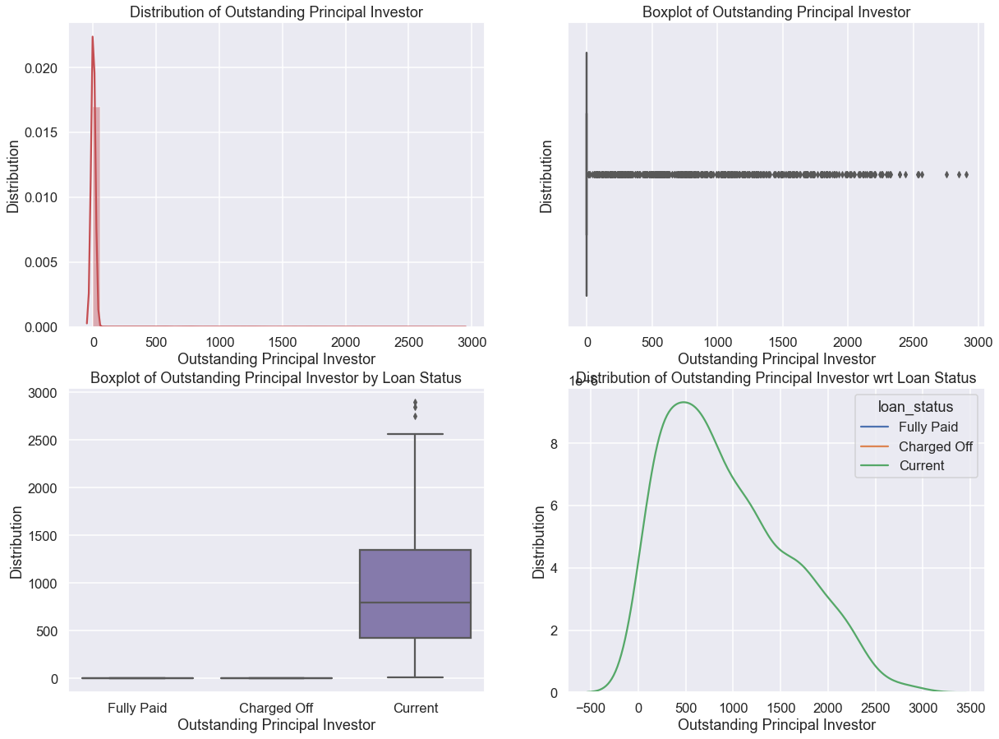

In [231]:
#Distribution of Outstanding Principal Investor
print(data['out_prncp_inv'].describe())
print('\n')
print("IQR of Outstanding Principal Investor {0}".format(IQR(data['out_prncp_inv'])))
print('\n')
print(data.groupby('loan_status').agg({'out_prncp_inv':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Outstanding Principal Investor")
sns.distplot(data['out_prncp_inv'],hist=True,kde=True,color='r')
plt.xlabel("Outstanding Principal Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Outstanding Principal Investor")
sns.boxplot(x='out_prncp_inv',data=data,color='m')
plt.xlabel("Outstanding Principal Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Outstanding Principal Investor by Loan Status")
sns.boxplot(y='out_prncp_inv',x='loan_status',data=data,color='m')
plt.xlabel("Outstanding Principal Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Outstanding Principal Investor wrt Loan Status")
sns.kdeplot(data['out_prncp_inv'],hue=data['loan_status'])
plt.xlabel('Outstanding Principal Investor')
plt.ylabel("Distribution")
plt.show()

- The data is skewed

- It backs up my earlier made inference that outstanding principal in data is for those borrowers who are current . There won't be any outstanding principal for fully paid or those who have got charged off.

count    36081.000000
mean     10318.940901
std       6728.320820
min         97.743750
25%       5265.180000
50%       8930.840000
75%      14220.460000
max      32971.391250
Name: total_pymnt, dtype: float64


IQR of Total Payment 8955.279999999999


            total_pymnt                                                   \
               describe                                                    
                  count          mean          std         min       25%   
loan_status                                                                
Charged Off      5166.0   5492.336770  4546.062805    97.74375  2035.810   
Current           529.0  12684.844839  5288.039087  1236.18000  8207.840   
Fully Paid      30386.0  11098.335154  6714.952436   526.33000  5881.475   

                                                                            \
                                                       IQR ninetynine_Perc   
                   50%        75%          max total_pymnt

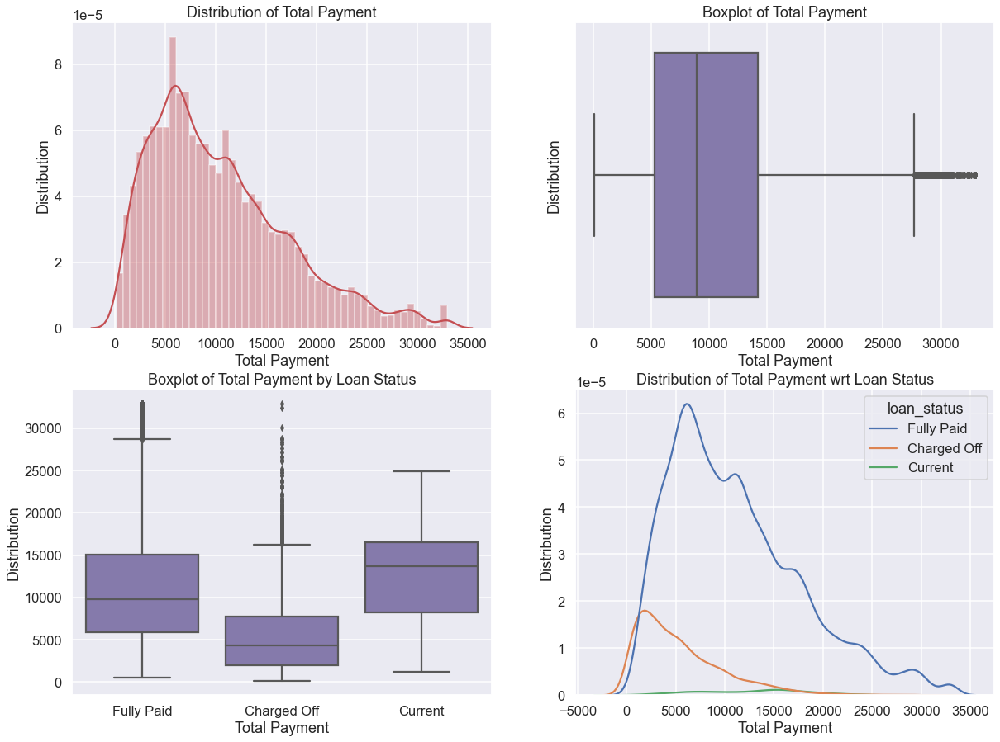

In [232]:
#Distribution of Total Payment
print(data['total_pymnt'].describe())
print('\n')
print("IQR of Total Payment {0}".format(IQR(data['total_pymnt'])))
print('\n')
print(data.groupby('loan_status').agg({'total_pymnt':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Total Payment")
sns.distplot(data['total_pymnt'],hist=True,kde=True,color='r')
plt.xlabel("Total Payment")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Total Payment")
sns.boxplot(x='total_pymnt',data=data,color='m')
plt.xlabel("Total Payment")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Total Payment by Loan Status")
sns.boxplot(y='total_pymnt',x='loan_status',data=data,color='m')
plt.xlabel("Total Payment")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Total Payment wrt Loan Status")
sns.kdeplot(data['total_pymnt'],hue=data['loan_status'])
plt.xlabel('Total Payment')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average total payment is 8930.84 and variation is 8955.28

- Charged Off borrowers have the minimum average of total payment in comparison to others, and variation is also low . Which mean they have paid lesser amount in comparison to others and their total paymnent pattern is very condensed, i.e borrowers who were charged off have similarity in their total payment pattern , their payment didnt differ much!


count    36081.000000
mean      9758.947413
std       6631.933069
min          0.000000
25%       4736.330000
50%       8373.540000
75%      13600.230000
max      31832.502500
Name: total_pymnt_inv, dtype: float64


IQR of Total Payment Investor 8863.9


            total_pymnt_inv                                                 \
                   describe                                                  
                      count          mean          std      min        25%   
loan_status                                                                  
Charged Off          5166.0   5049.592941  4405.748200     0.00  1708.7975   
Current               529.0  12557.796257  5206.019085  1236.18  8063.2300   
Fully Paid          30386.0  10510.870475  6631.980279     0.00  5519.7225   

                                                                \
                                                           IQR   
                   50%         75%         max total_pymnt_inv   


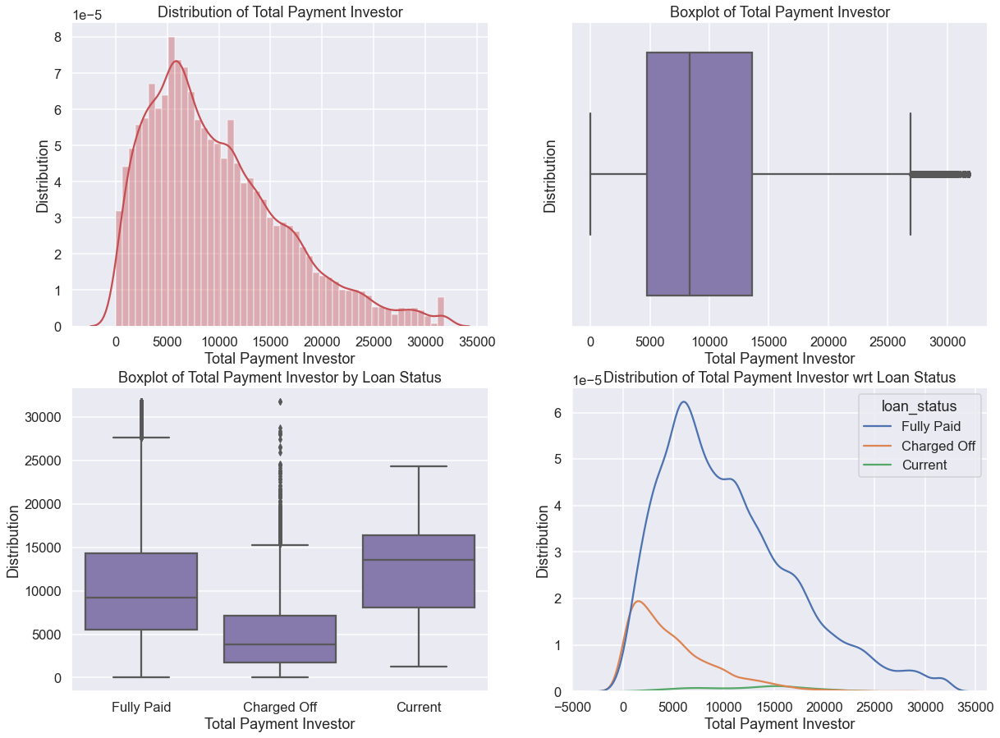

In [233]:
#Distribution of Total Payment Investor
print(data['total_pymnt_inv'].describe())
print('\n')
print("IQR of Total Payment Investor {0}".format(IQR(data['total_pymnt_inv'])))
print('\n')
print(data.groupby('loan_status').agg({'total_pymnt_inv':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Total Payment Investor")
sns.distplot(data['total_pymnt_inv'],hist=True,kde=True,color='r')
plt.xlabel("Total Payment Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Total Payment Investor")
sns.boxplot(x='total_pymnt_inv',data=data,color='m')
plt.xlabel("Total Payment Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Total Payment Investor by Loan Status")
sns.boxplot(y='total_pymnt_inv',x='loan_status',data=data,color='m')
plt.xlabel("Total Payment Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Total Payment Investor wrt Loan Status")
sns.kdeplot(data['total_pymnt_inv'],hue=data['loan_status'])
plt.xlabel('Total Payment Investor')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average total payment is 8373.54 and variation is 8863.9

- Charged Off borrowers have the minimum average in comparison to others, and variation is also low . Which mean they have paid lesser amount in comparison to others and their total paymnent pattern is very condensed, i.e borrowers who were charged off have similarity in their total payment pattern , their payment didnt differ much!


count    36081.000000
mean      8609.961813
std       5841.035910
min          0.000000
25%       4076.440000
50%       7500.000000
75%      12000.000000
max      35000.000000
Name: total_rec_prncp, dtype: float64


IQR of Principal Received to Date 7923.5599999999995


            total_rec_prncp                                               \
                   describe                                                
                      count         mean          std     min        25%   
loan_status                                                                
Charged Off          5166.0  3312.989048  3058.946458    0.00  1107.0025   
Current               529.0  9081.702495  4000.611367  911.61  5629.8700   
Fully Paid          30386.0  9502.300735  5750.921230  500.00  5000.0000   

                                                                            \
                                                       IQR ninetynine_Perc   
                 50%         75%       m

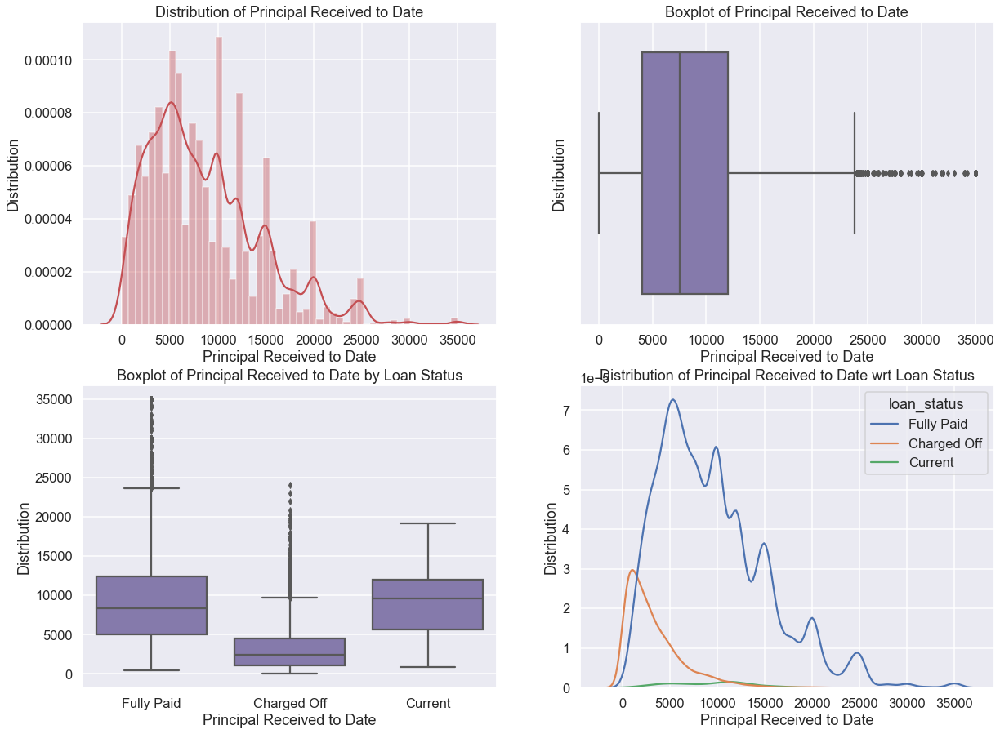

In [234]:
#Distribution of Total Received Principal
print(data['total_rec_prncp'].describe())
print('\n')
print("IQR of Principal Received to Date {0}".format(IQR(data['total_rec_prncp'])))
print('\n')
print(data.groupby('loan_status').agg({'total_rec_prncp':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Principal Received to Date")
sns.distplot(data['total_rec_prncp'],hist=True,kde=True,color='r')
plt.xlabel("Principal Received to Date")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Principal Received to Date")
sns.boxplot(x='total_rec_prncp',data=data,color='m')
plt.xlabel("Principal Received to Date")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Principal Received to Date by Loan Status")
sns.boxplot(y='total_rec_prncp',x='loan_status',data=data,color='m')
plt.xlabel("Principal Received to Date")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Principal Received to Date wrt Loan Status")
sns.kdeplot(data['total_rec_prncp'],hue=data['loan_status'])
plt.xlabel('Principal Received to Date')
plt.ylabel("Distribution")
plt.show()

- Data is positive skewed

- Average principal received by bank :7500 and have variation of 7923.55.

- We see that borrowers who were charged off have significantly on an average paid back the less principal amount and they have less variation , which mean almost all the borrower had similar pattern to default.

count    36081.000000
mean      1640.857236
std       1362.504433
min          0.000000
25%        613.480000
50%       1205.890000
75%       2311.830000
max       5999.500000
Name: total_rec_int, dtype: float64


IQR of Interest Received to Date 1698.35


            total_rec_int                                               \
                 describe                                                
                    count         mean          std     min        25%   
loan_status                                                              
Charged Off        5166.0  1597.078686  1410.305091    0.00   515.2025   
Current             529.0  3602.208147  1473.333376  302.01  2506.5900   
Fully Paid        30386.0  1614.154326  1326.851844    6.22   621.2750   

                                                                         \
                                                    IQR ninetynine_Perc   
                  50%        75%      max total_rec_int   total_rec_int   

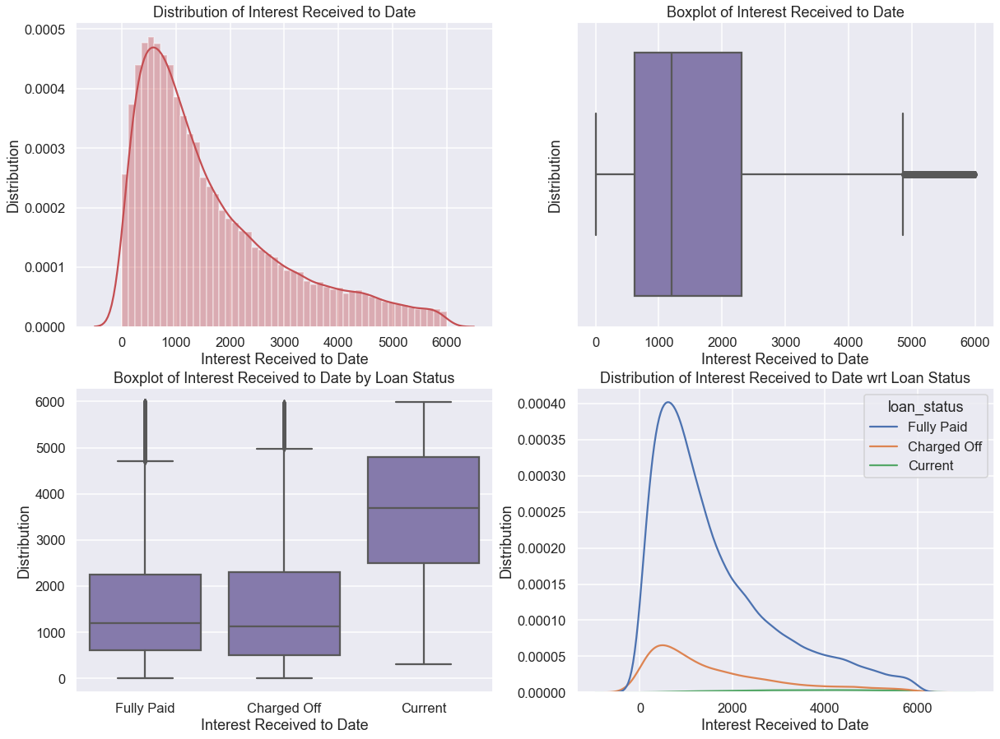

In [235]:
#Distribution of Total Received Interest
print(data['total_rec_int'].describe())
print('\n')
print("IQR of Interest Received to Date {0}".format(IQR(data['total_rec_int'])))
print('\n')
print(data.groupby('loan_status').agg({'total_rec_int':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Interest Received to Date")
sns.distplot(data['total_rec_int'],hist=True,kde=True,color='r')
plt.xlabel("Interest Received to Date")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Interest Received to Date")
sns.boxplot(x='total_rec_int',data=data,color='m')
plt.xlabel("Interest Received to Date")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Interest Received to Date by Loan Status")
sns.boxplot(y='total_rec_int',x='loan_status',data=data,color='m')
plt.xlabel("Interest Received to Date")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Interest Received to Date wrt Loan Status")
sns.kdeplot(data['total_rec_int'],hue=data['loan_status'])
plt.xlabel('Interest Received to Date')
plt.ylabel("Distribution")
plt.show()

- Data is positive skewed

- Average interest received by lending company : 1205.89 having variation of 1698.35

- There is not much significant difference in the average interest received by banks from borrowers who have fully paid or have been charged off 


count    36081.000000
mean         1.278427
std          6.834576
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        166.429711
Name: total_rec_late_fee, dtype: float64


IQR of Late Fee Received 0.0


            total_rec_late_fee                                           \
                      describe                                            
                         count      mean        std  min  25%  50%  75%   
loan_status                                                               
Charged Off             5166.0  3.961744  11.680433  0.0  0.0  0.0  0.0   
Current                  529.0  0.934245   4.465097  0.0  0.0  0.0  0.0   
Fully Paid             30386.0  0.828221   5.522643  0.0  0.0  0.0  0.0   

                                                               \
                                       IQR    ninetynine_Perc   
                    max total_rec_late_fee total_rec_late_fee   
loan_status                  

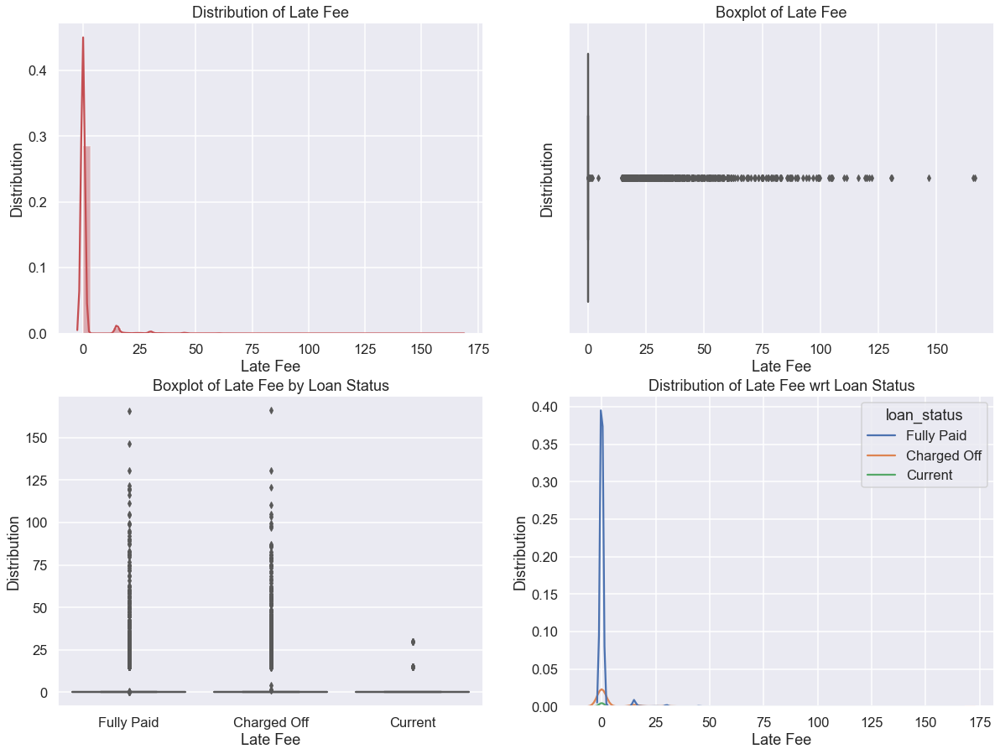

In [236]:
#Distribution of Total Received Late Fee
print(data['total_rec_late_fee'].describe())
print('\n')
print("IQR of Late Fee Received {0}".format(IQR(data['total_rec_late_fee'])))
print('\n')
print(data.groupby('loan_status').agg({'total_rec_late_fee':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Late Fee")
sns.distplot(data['total_rec_late_fee'],hist=True,kde=True,color='r')
plt.xlabel("Late Fee")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Late Fee")
sns.boxplot(x='total_rec_late_fee',data=data,color='m')
plt.xlabel("Late Fee")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Late Fee by Loan Status")
sns.boxplot(y='total_rec_late_fee',x='loan_status',data=data,color='m')
plt.xlabel("Late Fee")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Late Fee wrt Loan Status")
sns.kdeplot(data['total_rec_late_fee'],hue=data['loan_status'])
plt.xlabel('Late Fee')
plt.ylabel("Distribution")
plt.show()

- Average late fee is 0 , because not many have paid any late fee .loan status . 

- But out of the limited late fee received , major contribution is by the borrowers who have been charged off. (Instead of median , we are considoring mean here). Hence, one who has contributed more to late fee is likely to default.


count    36081.000000
mean        82.909072
std        645.538460
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      29623.350000
Name: recoveries, dtype: float64


IQR of recoveries 0.0


            recoveries                                                      \
              describe                                                       
                 count        mean          std  min  25%      50%     75%   
loan_status                                                                  
Charged Off     5166.0  579.063538  1619.761596  0.0  0.0  155.575  497.23   
Current          529.0    0.000000     0.000000  0.0  0.0    0.000    0.00   
Fully Paid     30386.0    0.000000     0.000000  0.0  0.0    0.000    0.00   

                                                                        
                             IQR ninetynine_Perc      Range       skew  
                  max recoveries      recoveries recoveries recoveries  

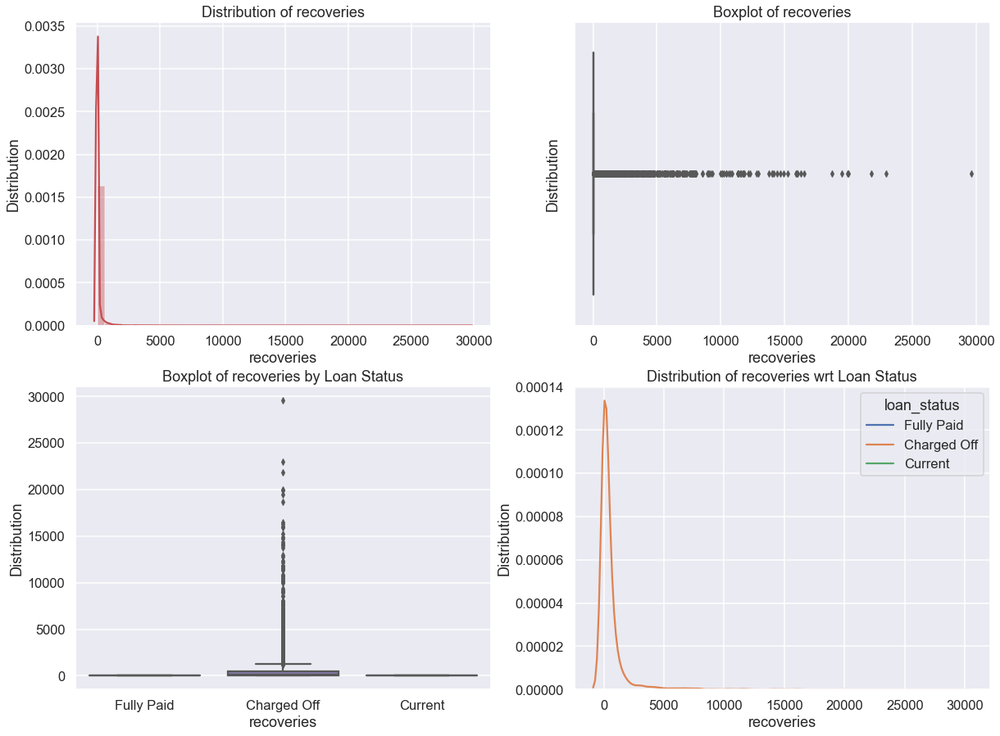

In [237]:
#Distribution of Recoveries
print(data['recoveries'].describe())
print('\n')
print("IQR of recoveries {0}".format(IQR(data['recoveries'])))
print('\n')
print(data.groupby('loan_status').agg({'recoveries':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of recoveries")
sns.distplot(data['recoveries'],hist=True,kde=True,color='r')
plt.xlabel("recoveries")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of recoveries")
sns.boxplot(x='recoveries',data=data,color='m')
plt.xlabel("recoveries")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of recoveries by Loan Status")
sns.boxplot(y='recoveries',x='loan_status',data=data,color='m')
plt.xlabel("recoveries")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of recoveries wrt Loan Status")
sns.kdeplot(data['recoveries'],hue=data['loan_status'])
plt.xlabel('recoveries')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- It belongs to those borrowers who had been charged off, as you can see average and variation of paid off and current borrowers is 0. 

- So we can say that from borrowers from whom recoveries are maid are likely to be charged off.

count    36081.000000
mean        11.294793
std        149.151169
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       7002.190000
Name: collection_recovery_fee, dtype: float64


IQR of recoveries fee 0.0


            collection_recovery_fee                                         \
                           describe                                          
                              count       mean         std  min  25%   50%   
loan_status                                                                  
Charged Off                  5166.0  78.886457  387.384006  0.0  0.0  2.15   
Current                       529.0   0.000000    0.000000  0.0  0.0  0.00   
Fully Paid                  30386.0   0.000000    0.000000  0.0  0.0  0.00   

                                                                             \
                                                IQR         ninetynine_Perc   
               75%      max collection_reco

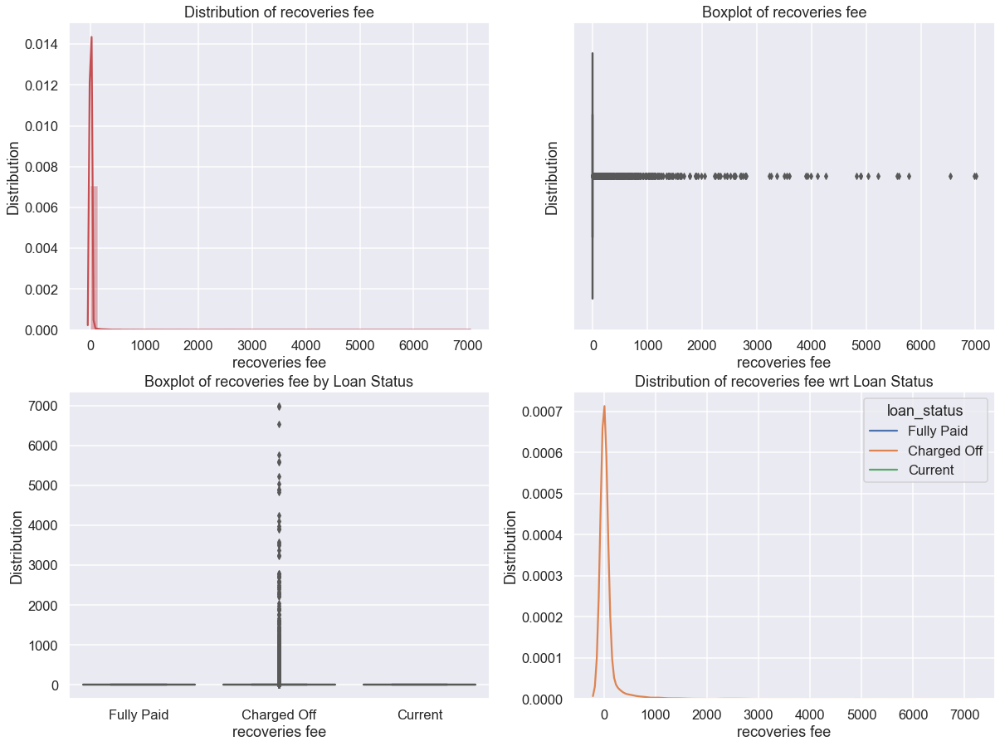

In [238]:
#Distribution of Collection Recovery Fee
print(data['collection_recovery_fee'].describe())
print('\n')
print("IQR of recoveries fee {0}".format(IQR(data['collection_recovery_fee'])))
print('\n')
print(data.groupby('loan_status').agg({'collection_recovery_fee':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of recoveries fee")
sns.distplot(data['collection_recovery_fee'],hist=True,kde=True,color='r')
plt.xlabel("recoveries fee")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of recoveries fee")
sns.boxplot(x='collection_recovery_fee',data=data,color='m')
plt.xlabel("recoveries fee")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of recoveries fee by Loan Status")
sns.boxplot(y='collection_recovery_fee',x='loan_status',data=data,color='m')
plt.xlabel("recoveries fee")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of recoveries fee wrt Loan Status")
sns.kdeplot(data['collection_recovery_fee'],hue=data['loan_status'])
plt.xlabel('recoveries fee')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- It belongs to those borrowers who had been charged off, as you can see average and variation of paid off and current borrowers is 0. 

- So we can say that from borrowers from whom recoveries fee are collected are likely to be charged off.

count    36081.000000
mean      1828.286054
std       2345.194006
min          0.000000
25%        203.380000
50%        492.700000
75%       2889.290000
max       6918.155000
Name: last_pymnt_amnt, dtype: float64


IQR of Last Payment Amount 2685.91


            last_pymnt_amnt                                             \
                   describe                                              
                      count         mean          std    min       25%   
loan_status                                                              
Charged Off          5166.0   301.557562   400.666228   0.00  111.7225   
Current               529.0   229.935123    99.931675  21.74  146.7400   
Fully Paid          30386.0  2115.675215  2445.393010   0.00  237.2825   

                                                                          \
                                                     IQR ninetynine_Perc   
                50%        75%       max last_pymnt_amnt last_pymnt_amnt   


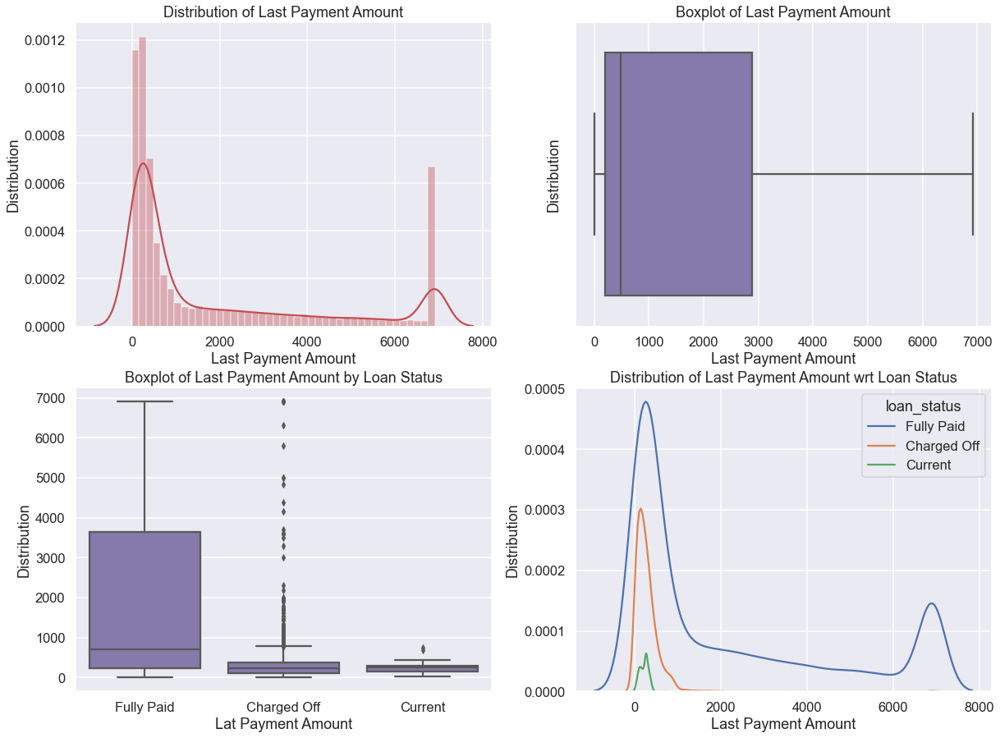

In [239]:
#Distribution of Last Payment Amount
print(data['last_pymnt_amnt'].describe())
print('\n')
print("IQR of Last Payment Amount {0}".format(IQR(data['last_pymnt_amnt'])))
print('\n')
print(data.groupby('loan_status').agg({'last_pymnt_amnt':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Last Payment Amount")
sns.distplot(data['last_pymnt_amnt'],hist=True,kde=True,color='r')
plt.xlabel("Last Payment Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Last Payment Amount")
sns.boxplot(x='last_pymnt_amnt',data=data,color='m')
plt.xlabel("Last Payment Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Last Payment Amount by Loan Status")
sns.boxplot(y='last_pymnt_amnt',x='loan_status',data=data,color='m')
plt.xlabel("Lat Payment Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Last Payment Amount wrt Loan Status")
sns.kdeplot(data['last_pymnt_amnt'],hue=data['loan_status'])
plt.xlabel('Last Payment Amount')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed 

- Average Last Payment Maid : 492.7 with variation of 2685.91

- Comparing Fully Paid and Charged off borrower , average last payment by borrowers who were charged off is significantly lower than fully paid. Even the variation is very less , which mean those who are likely to default are likely to make less/minimal last payment.

count    36081.000000
mean      -233.268895
std       1287.845765
min     -21025.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.000000
Name: funded_to_applied_amt_diff, dtype: float64


IQR of Difference in Applied and Funded Amount 0.0


            funded_to_applied_amt_diff                                         \
                              describe                                          
                                 count        mean          std      min  25%   
loan_status                                                                     
Charged Off                     5166.0 -327.134146  1577.033919 -20425.0  0.0   
Current                          529.0 -243.052930  1153.776609 -10400.0  0.0   
Fully Paid                     30386.0 -217.140295  1233.593730 -21025.0  0.0   

                                                       \
                                                  IQR   
             50%  75%  max funded_to_a

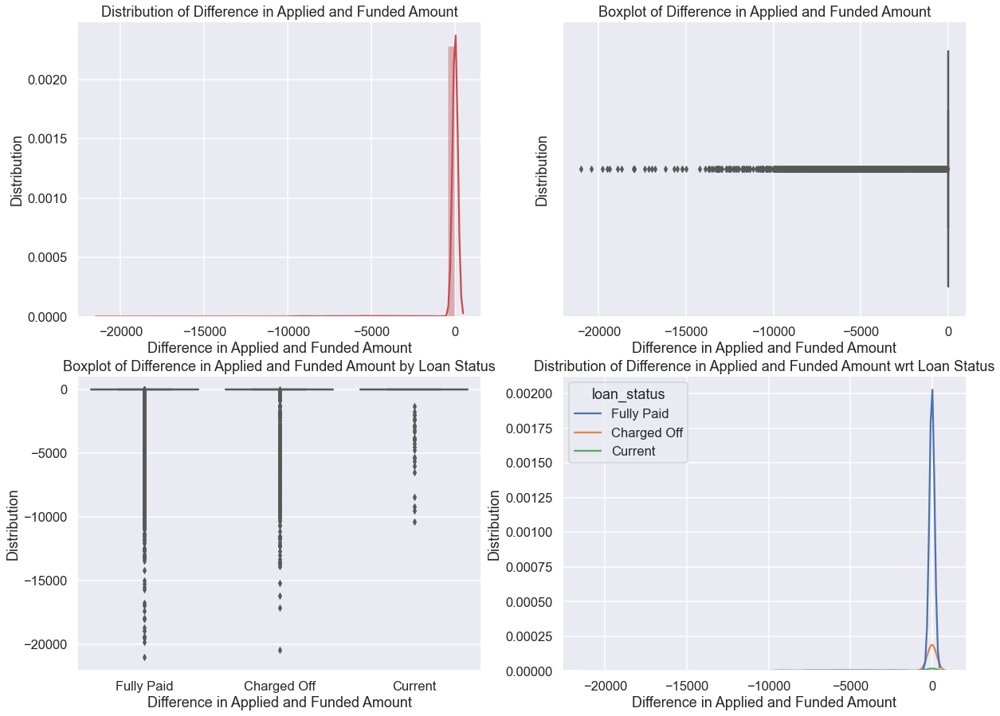

In [240]:
#Distribution of Funded to Applied amount Difference
print(data['funded_to_applied_amt_diff'].describe())
print('\n')
print("IQR of Difference in Applied and Funded Amount {0}".format(IQR(data['funded_to_applied_amt_diff'])))
print('\n')
print(data.groupby('loan_status').agg({'funded_to_applied_amt_diff':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Difference in Applied and Funded Amount")
sns.distplot(data['funded_to_applied_amt_diff'],hist=True,kde=True,color='r')
plt.xlabel("Difference in Applied and Funded Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Difference in Applied and Funded Amount")
sns.boxplot(x='funded_to_applied_amt_diff',data=data,color='m')
plt.xlabel("Difference in Applied and Funded Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Difference in Applied and Funded Amount by Loan Status")
sns.boxplot(y='funded_to_applied_amt_diff',x='loan_status',data=data,color='m')
plt.xlabel("Difference in Applied and Funded Amount")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Difference in Applied and Funded Amount wrt Loan Status")
sns.kdeplot(data['funded_to_applied_amt_diff'],hue=data['loan_status'])
plt.xlabel('Difference in Applied and Funded Amount')
plt.ylabel("Distribution")
plt.show()

- Data is skewed

- We see that mean contribution of what borrower applied and how much he/she was funded is lowest of Charged Off, it means these borrowers applied for much higher amount but they have not received that , have received significantly less as compared to other borrowers.

count    36081.000000
mean      -777.488731
std       2439.183930
min     -32474.996081
25%       -200.000000
50%          0.000000
75%          0.000000
max          0.000000
Name: funded_inv_to_applied_amt_diff, dtype: float64


IQR of Difference in Applied and Funded Amount by Investor 0.0


            funded_inv_to_applied_amt_diff                            \
                                  describe                             
                                     count         mean          std   
loan_status                                                            
Charged Off                         5166.0 -1242.564422  3438.644891   
Current                              529.0  -330.460786  1193.678080   
Fully Paid                         30386.0  -706.202506  2232.643287   

                                                      \
                                                       
                      min         25%  50%  75%  max   
loan_status                    

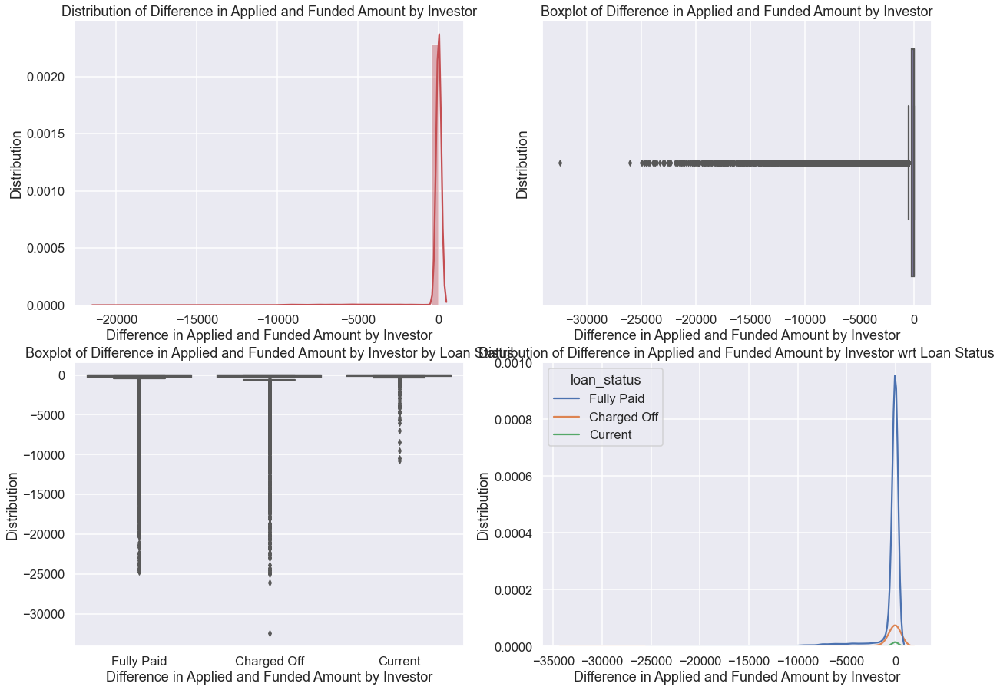

In [241]:
#Distribution of Funded to Applied amount Difference Investor
print(data['funded_inv_to_applied_amt_diff'].describe())
print('\n')
print("IQR of Difference in Applied and Funded Amount by Investor {0}".format(IQR(data['funded_to_applied_amt_diff'])))
print('\n')
print(data.groupby('loan_status').agg({'funded_inv_to_applied_amt_diff':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Difference in Applied and Funded Amount by Investor")
sns.distplot(data['funded_to_applied_amt_diff'],hist=True,kde=True,color='r')
plt.xlabel("Difference in Applied and Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Difference in Applied and Funded Amount by Investor")
sns.boxplot(x='funded_inv_to_applied_amt_diff',data=data,color='m')
plt.xlabel("Difference in Applied and Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Difference in Applied and Funded Amount by Investor by Loan Status")
sns.boxplot(y='funded_inv_to_applied_amt_diff',x='loan_status',data=data,color='m')
plt.xlabel("Difference in Applied and Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Difference in Applied and Funded Amount by Investor wrt Loan Status")
sns.kdeplot(data['funded_inv_to_applied_amt_diff'],hue=data['loan_status'])
plt.xlabel('Difference in Applied and Funded Amount by Investor')
plt.ylabel("Distribution")
plt.show()

- Data is left skewed

- We see that mean contribution of what borrower applied and how much he/she was funded is lowest of Charged Off, it means these borrowers applied for much higher amount but they have not received that , have received significantly less as compared to other borrowers.

count    36081.000000
mean      -544.219836
std       2018.799363
min     -32474.996081
25%       -150.000000
50%          0.000000
75%          0.000000
max          0.000000
Name: funded_inv_to_funded_amt_diff, dtype: float64


IQR of Difference in Funded and Funded Amount by Investor 150.0


            funded_inv_to_funded_amt_diff                           \
                                 describe                            
                                    count        mean          std   
loan_status                                                          
Charged Off                        5166.0 -915.430276  2998.003576   
Current                             529.0  -87.407856   215.094568   
Fully Paid                        30386.0 -489.062211  1811.266006   

                                                                               \
                                                                          IQR   
                      min    25%  50%  75%  max fun

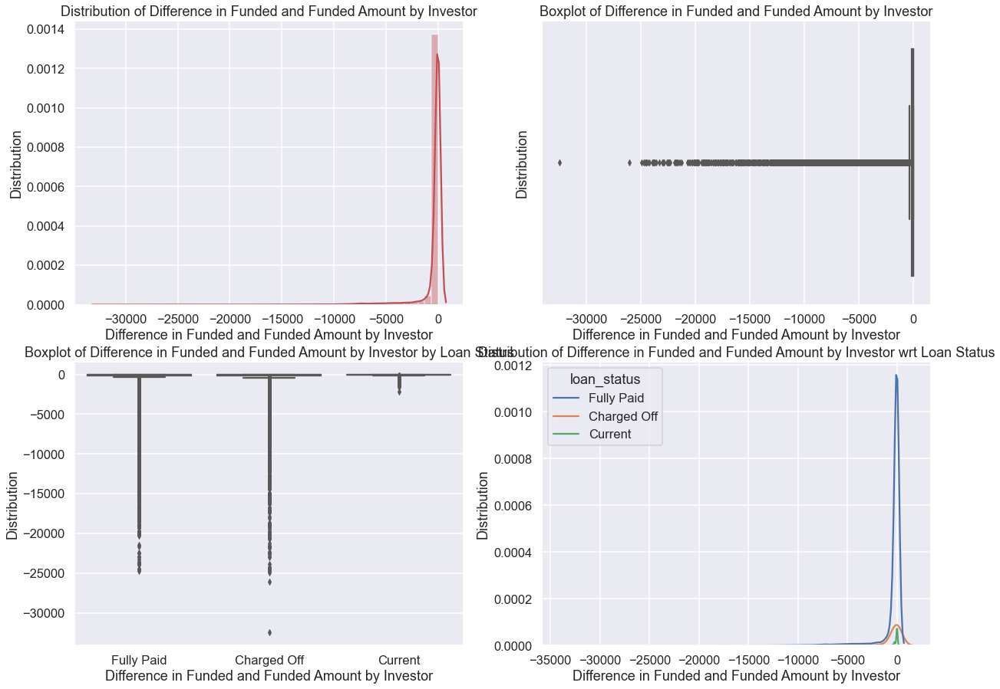

In [242]:
#Distribution of Funded to Funded Investor amount Difference
print(data['funded_inv_to_funded_amt_diff'].describe())
print('\n')
print("IQR of Difference in Funded and Funded Amount by Investor {0}".format(IQR(data['funded_inv_to_funded_amt_diff'])))
print('\n')
print(data.groupby('loan_status').agg({'funded_inv_to_funded_amt_diff':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Difference in Funded and Funded Amount by Investor")
sns.distplot(data['funded_inv_to_funded_amt_diff'],hist=True,kde=True,color='r')
plt.xlabel("Difference in Funded and Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Difference in Funded and Funded Amount by Investor")
sns.boxplot(x='funded_inv_to_funded_amt_diff',data=data,color='m')
plt.xlabel("Difference in Funded and Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Difference in Funded and Funded Amount by Investor by Loan Status")
sns.boxplot(y='funded_inv_to_funded_amt_diff',x='loan_status',data=data,color='m')
plt.xlabel("Difference in Funded and Funded Amount by Investor")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Distribution of Difference in Funded and Funded Amount by Investor wrt Loan Status")
sns.kdeplot(data['funded_inv_to_funded_amt_diff'],hue=data['loan_status'])
plt.xlabel('Difference in Funded and Funded Amount by Investor')
plt.ylabel("Distribution")
plt.show()

- Data is left skewed

- We see that mean contribution of what borrower applied and how much he/she was funded is lowest of Charged Off, it means these borrowers applied for much higher amount but they have not received that , have received significantly less as compared to other borrowers. There is variation between what was promised on first point of contact and amount which was funded for those borrowers who were charged off 

count    36081.000000
mean     11908.661103
std       7484.796946
min       1265.040000
25%       6107.760000
50%      10425.240000
75%      16386.480000
max      49585.200000
Name: total_inst, dtype: float64


IQR of Total Installments 10278.72


            total_inst                                                         \
              describe                                                          
                 count          mean          std      min      25%       50%   
loan_status                                                                     
Charged Off     5166.0  13936.456005  9417.666213  1265.04  6504.57  11845.80   
Current          529.0  13672.376938  5697.465164  2108.40  8804.40  14876.40   
Fully Paid     30386.0  11533.205493  7070.190935  1265.04  6038.28  10080.54   

                                                                      \
                                      IQR ninetynine_Perc      Range   
                  75%      max total_ins

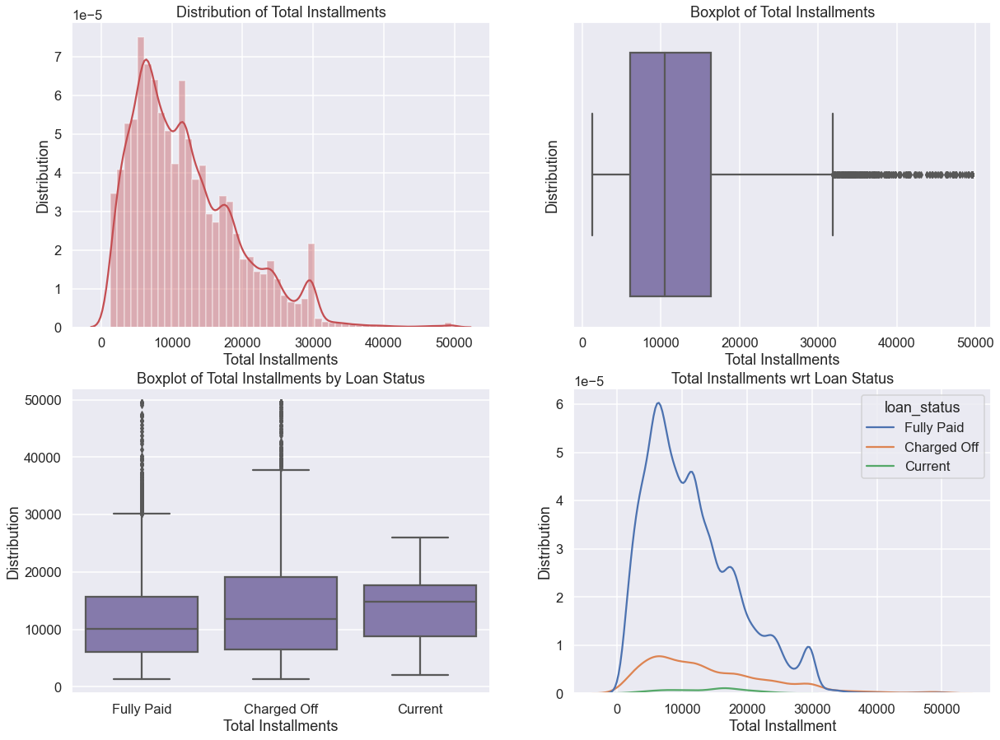

In [243]:
#Distribution of Total Installment
print(data['total_inst'].describe())
print('\n')
print("IQR of Total Installments {0}".format(IQR(data['total_inst'])))
print('\n')
print(data.groupby('loan_status').agg({'total_inst':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Total Installments")
sns.distplot(data['total_inst'],hist=True,kde=True,color='r')
plt.xlabel("Total Installments")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Total Installments")
sns.boxplot(x='total_inst',data=data,color='m')
plt.xlabel("Total Installments")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Total Installments by Loan Status")
sns.boxplot(y='total_inst',x='loan_status',data=data,color='m')
plt.xlabel("Total Installments")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Total Installments wrt Loan Status")
sns.kdeplot(data['total_inst'],hue=data['loan_status'])
plt.xlabel('Total Installment')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average total installment of borrower : 10425.24, with variation of 10278.72

- There is not much significant difference in average of fully paid and charged off borrowers

- But, borrowers who were charged off have high variation, which means there are borrowers who pay high installments . But there are borrowers who pay less installments but still they default. 

- Total Installments is an enabler not driver for borrower to default. We should find why are the borrowers who pay large total installments defaults

count    36081.000000
mean      1589.720202
std       4222.484605
min      -3220.271250
25%          0.230000
50%        126.420000
75%        963.760000
max      48754.856250
Name: balance_amt_of_charged_off, dtype: float64


IQR of Balance of Charged Off Borrowers 963.5299999999988


            balance_amt_of_charged_off                                        \
                              describe                                         
                                 count         mean          std         min   
loan_status                                                                    
Charged Off                     5166.0  8444.119235  7894.578806  -366.92000   
Current                          529.0   987.532098   674.013468  -747.52000   
Fully Paid                     30386.0   434.870340  1114.013575 -3220.27125   

                                                           \
                                                            
                   25%       5

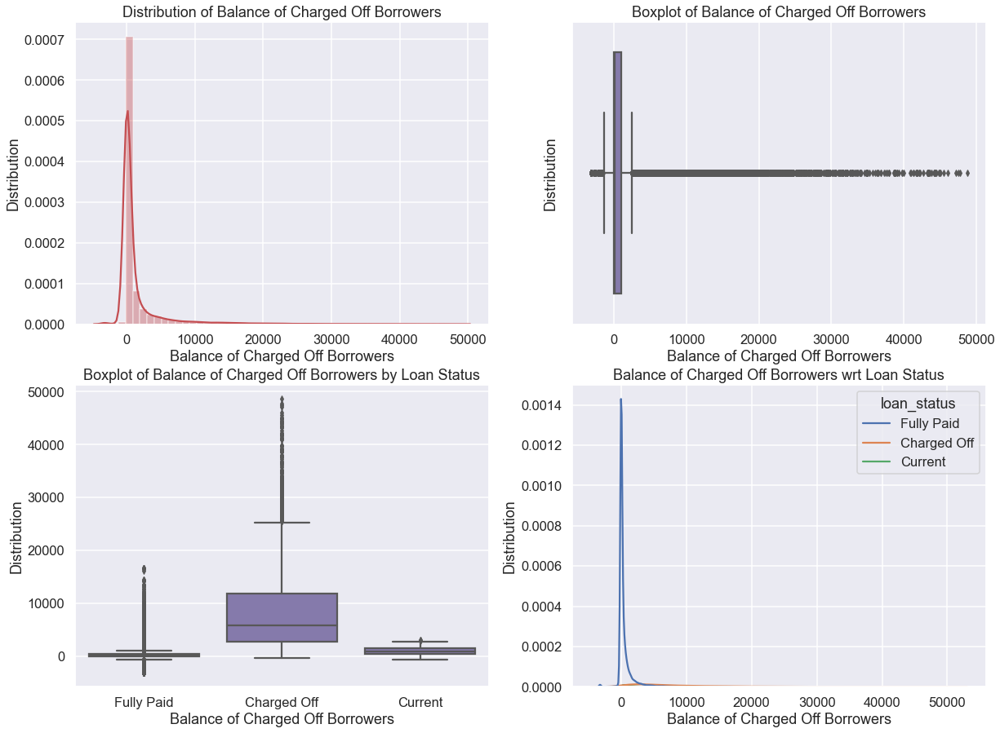

In [244]:
#Distribution of Balance amount of Charged Off
print(data['balance_amt_of_charged_off'].describe())
print('\n')
print("IQR of Balance of Charged Off Borrowers {0}".format(IQR(data['balance_amt_of_charged_off'])))
print('\n')
print(data.groupby('loan_status').agg({'balance_amt_of_charged_off':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Balance of Charged Off Borrowers")
sns.distplot(data['balance_amt_of_charged_off'],hist=True,kde=True,color='r')
plt.xlabel("Balance of Charged Off Borrowers")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Balance of Charged Off Borrowers")
sns.boxplot(x='balance_amt_of_charged_off',data=data,color='m')
plt.xlabel("Balance of Charged Off Borrowers")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Balance of Charged Off Borrowers by Loan Status")
sns.boxplot(y='balance_amt_of_charged_off',x='loan_status',data=data,color='m')
plt.xlabel("Balance of Charged Off Borrowers")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Balance of Charged Off Borrowers wrt Loan Status")
sns.kdeplot(data['balance_amt_of_charged_off'],hue=data['loan_status'])
plt.xlabel('Balance of Charged Off Borrowers')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average Remaining Balance is 126.42 with variation off 963.53

- It is very significant that average remaining balance is high of borrowers who were charged off as compared to fully paid

- It is also seen that there is high variation in balance remaining by borrowers who were charged off which states that very high amount is left unpaid. You can see the first quantle and the third quantile of the distribution of charged off borrowers is higher than the fully paid borrowers.

count    36081.000000
mean         6.287654
std          3.822303
min          0.290000
25%          3.390000
50%          5.520000
75%          8.360000
max         32.030000
Name: installment_to_income, dtype: float64


IQR of Installment to Income Ratio 4.969999999999999


            installment_to_income                                         \
                         describe                                          
                            count      mean       std   min   25%    50%   
loan_status                                                                
Charged Off                5166.0  7.054110  4.125535  0.42  3.84  6.330   
Current                     529.0  5.404140  3.058692  0.50  3.08  4.800   
Fully Paid                30386.0  6.172728  3.763764  0.29  3.34  5.415   

                                                                      \
                                           IQR       ninetynine_Perc   
              75%    max installment_to_income

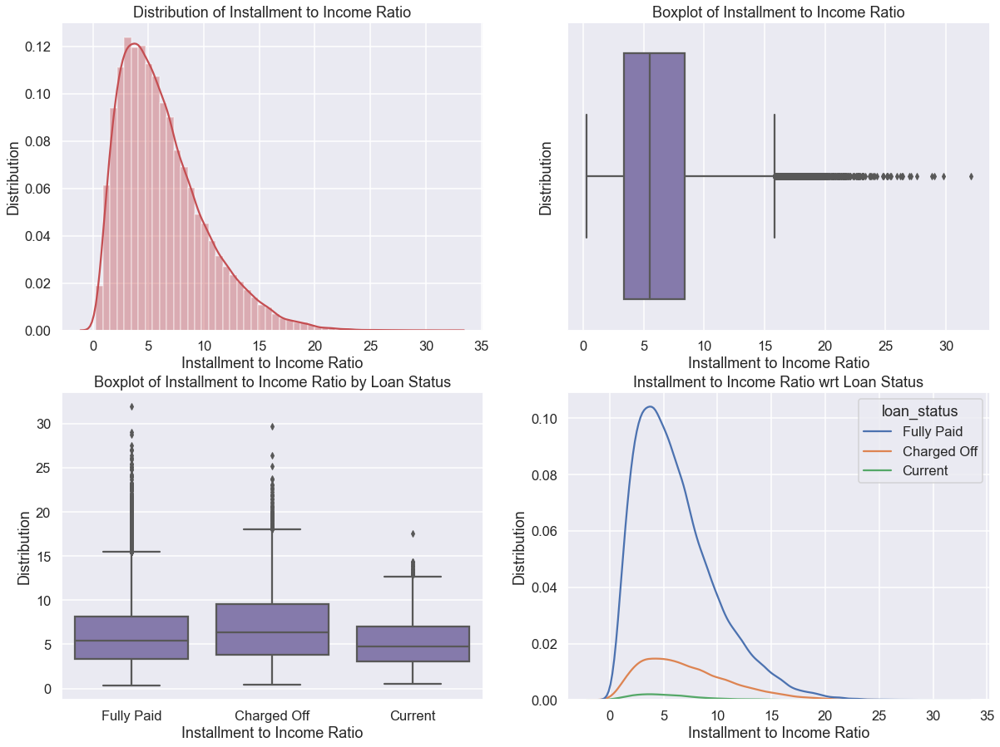

In [245]:
#Distribution of Installment to Income ratio
print(data['installment_to_income'].describe())
print('\n')
print("IQR of Installment to Income Ratio {0}".format(IQR(data['installment_to_income'])))
print('\n')
print(data.groupby('loan_status').agg({'installment_to_income':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Installment to Income Ratio")
sns.distplot(data['installment_to_income'],hist=True,kde=True,color='r')
plt.xlabel("Installment to Income Ratio")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Installment to Income Ratio")
sns.boxplot(x='installment_to_income',data=data,color='m')
plt.xlabel("Installment to Income Ratio")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Installment to Income Ratio by Loan Status")
sns.boxplot(y='installment_to_income',x='loan_status',data=data,color='m')
plt.xlabel("Installment to Income Ratio")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Installment to Income Ratio wrt Loan Status")
sns.kdeplot(data['installment_to_income'],hue=data['loan_status'])
plt.xlabel('Installment to Income Ratio')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average Installment to Income Ratio is 5.52 with variation of 4.9

- We can see in comparison to fully paid borrowers, borrowers who were charged off have higher installment to income ration which means, out of total income, major expenditure is made on the paying the installment , i.e installment was the larger chunk of their income. Also they had higher variation, which states that installment to income ratio of such borrowers are more likely to vary. We see that the first quartile and the third quartile is greater than fully paid which means these borrowers have larger installment amount and lesser income ( which we have validated above) 

count     36081.000000
mean      66838.455388
std       45841.584798
min           0.000000
25%       33291.670000
50%       58813.330000
75%       90723.750000
max      359448.370000
Name: debt, dtype: float64


IQR of Debt 57432.08


                debt                                                        \
            describe                                                         
               count          mean           std  min        25%       50%   
loan_status                                                                  
Charged Off   5166.0  65598.565763  45080.303898  0.0  32833.375  57818.33   
Current        529.0  68916.769868  43186.764844  0.0  36086.220  60600.00   
Fully Paid   30386.0  67013.070061  46011.902390  0.0  33300.000  58916.67   

                                                                           \
                                           IQR ninetynine_Perc      Range   
                    75%        max        debt            debt 

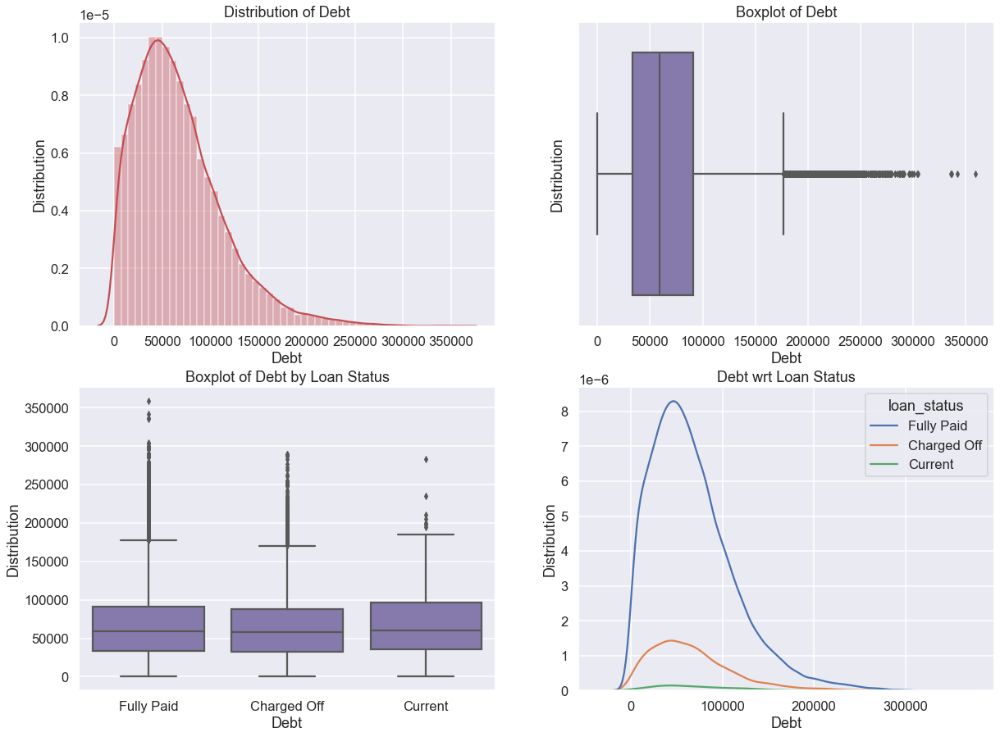

In [246]:
#Distribution of Debt
print(data['debt'].describe())
print('\n')
print("IQR of Debt {0}".format(IQR(data['debt'])))
print('\n')
print(data.groupby('loan_status').agg({'debt':['describe',IQR,ninetynine_Perc,Range,'skew']}))

plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
plt.title("Distribution of Debt")
sns.distplot(data['debt'],hist=True,kde=True,color='r')
plt.xlabel("Debt")
plt.ylabel("Distribution")
plt.subplot(2,2,2)
plt.title("Boxplot of Debt")
sns.boxplot(x='debt',data=data,color='m')
plt.xlabel("Debt")
plt.ylabel("Distribution")
plt.subplot(2,2,3)
plt.title("Boxplot of Debt by Loan Status")
sns.boxplot(y='debt',x='loan_status',data=data,color='m')
plt.xlabel("Debt")
plt.ylabel("Distribution")
plt.subplot(2,2,4)
plt.title("Debt wrt Loan Status")
sns.kdeplot(data['debt'],hue=data['loan_status'])
plt.xlabel('Debt')
plt.ylabel("Distribution")
plt.show()

- Data is right skewed

- Average debt of borrower : 58813.330000 with variation of 57432.08

- There is not much difference in the average debt of fully paid borrowers and charged off borrowers, hence the difference could be because of randomness

- There is not much difference in the variation

### Univariate Comparison of Categorical variable vs Continuous for Charged off Borrowers

loan_status     Charged Off  Current  Fully Paid  Total  Charged Off Rate
home_ownership                                                           
OTHER                    18        0          82    100           18.0000
RENT                   2665      209       14819  17693           15.0625
OWN                     416       52        2370   2838           14.6582
MORTGAGE               2067      268       13115  15450           13.3786


loan_status  Charged Off    Current    Fully Paid         Total  \
count           4.000000    4.00000      4.000000      4.000000   
mean         1291.500000  132.25000   7596.500000   9020.250000   
std          1274.912415  126.81844   7447.647526   8838.351142   
min            18.000000    0.00000     82.000000    100.000000   
25%           316.500000   39.00000   1798.000000   2153.500000   
50%          1241.500000  130.50000   7742.500000   9144.000000   
75%          2216.500000  223.75000  13541.000000  16010.750000   
max          2665.

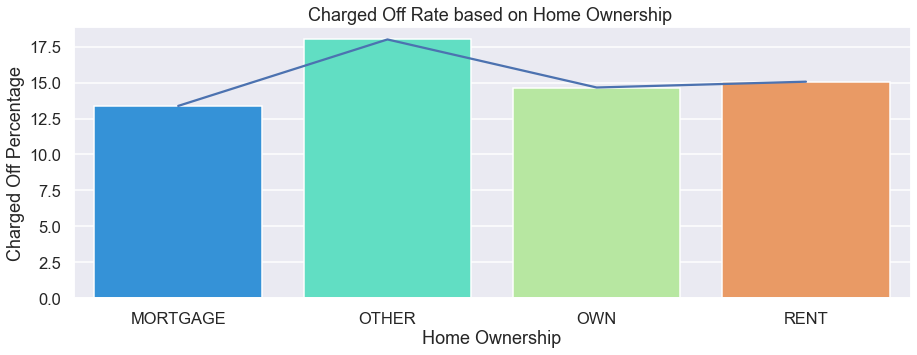

In [247]:
#Home ownership against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'home_ownership',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Home Ownership ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Home Ownership")
plt.ylabel("Charged Off Percentage")
plt.show()

- Those who had charged off had maximum of Other category of Home Ownership

loan_status         Charged Off  Current  Fully Paid  Total  Charged Off Rate
purpose                                                                      
small_business              442       31        1126   1599           27.6423
renewable_energy             19        0          78     97           19.5876
educational                  56        0         268    324           17.2840
house                        54        4         273    331           16.3142
moving                       92        5         474    571           16.1121
other                       614       89        3126   3829           16.0355
medical                      99        6         551    656           15.0915
debt_consolidation         2456      230       13733  16419           14.9583
vacation                     51        6         320    377           13.5279
home_improvement            322       45        2288   2655           12.1281
credit_card                 495       31        4171   4697     

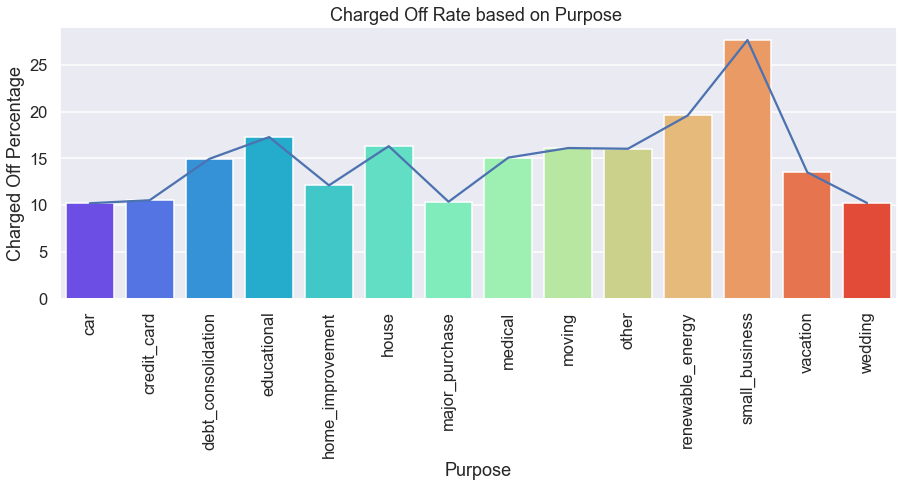

In [248]:
#Purpose against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'purpose',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Purpose ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Purpose")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

- Top 3 purpose from which we have seen major charged off :

    - Small Busines - 27.64%
    
    - Renewable Energy - 19.59%
    
    - Educational - 17.3%
    

loan_status  Charged Off  Current  Fully Paid  Total  Charged Off Rate
addr_state                                                            
NE                     3        0           2      5           60.0000
NV                   101        9         342    452           22.3451
SD                    11        2          47     60           18.3333
FL                   471       41        2116   2628           17.9224
MO                   108       13         513    634           17.0347
HI                    27        3         129    159           16.9811
ID                     1        0           5      6           16.6667
GA                   205       13        1041   1259           16.2828
CA                  1037       76        5366   6479           16.0056
AK                    11        0          58     69           15.9420
OR                    67        8         346    421           15.9145
NM                    27        3         144    174           15.5172
MD    

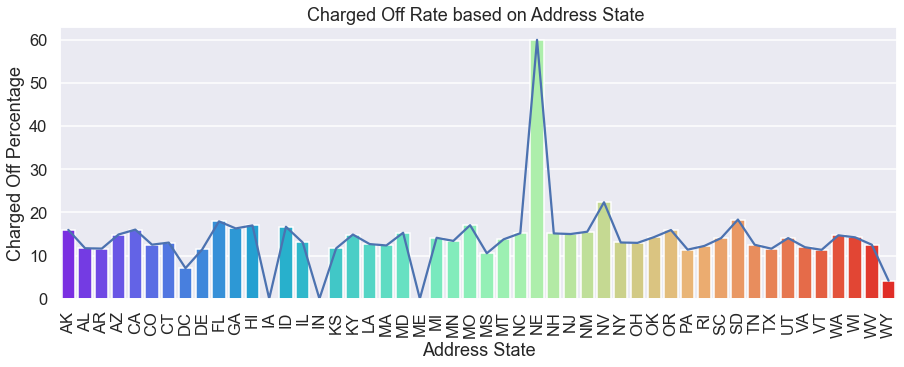

In [249]:
#Address State against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'addr_state',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Address State ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Address State")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

Top 3 States from where we have seen major charged off :

    - Nebraska (NE) - 60%
    
    - Nevada (NV) - 22.4%
    
    - South Dakota (SD) - 18.33%

loan_status  Charged Off  Current  Fully Paid  Total  Charged Off Rate
delinq_2yrs                                                           
8                      1        0           1      2           50.0000
7                      1        0           2      3           33.3333
4                     12        0          44     56           21.4286
2                    114        5         491    610           18.6885
3                     34        2         159    195           17.4359
1                    469       37        2468   2974           15.7700
5                      3        1          16     20           15.0000
0                   4531      484       27194  32209           14.0675
6                      1        0           9     10           10.0000
9                      0        0           1      1            0.0000
11                     0        0           1      1            0.0000


loan_status  Charged Off     Current    Fully Paid         Total  \
count  

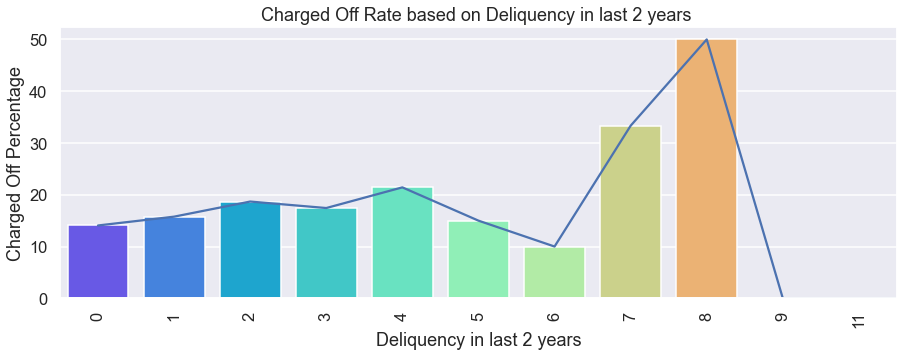

In [250]:
#Deliquency in last 2 years against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'delinq_2yrs',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Deliquency in last 2 years ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Deliquency in last 2 years")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

- Those who had 7-8 deliquecy in last two years are more likely to default

loan_status     Charged Off  Current  Fully Paid  Total  Charged Off Rate
inq_last_6mths                                                           
7                         9        1          20     30           30.0000
6                        14        0          39     53           26.4151
3                       585       23        2175   2783           21.0205
5                        26        1         107    134           19.4030
8                         2        1           8     11           18.1818
2                       873       59        4277   5209           16.7595
4                        47        4         241    292           16.0959
1                      1520      135        8261   9916           15.3288
0                      2090      305       15258  17653           11.8393


loan_status  Charged Off     Current    Fully Paid         Total  \
count           9.000000    9.000000      9.000000      9.000000   
mean          574.000000   58.777778   3376.2222

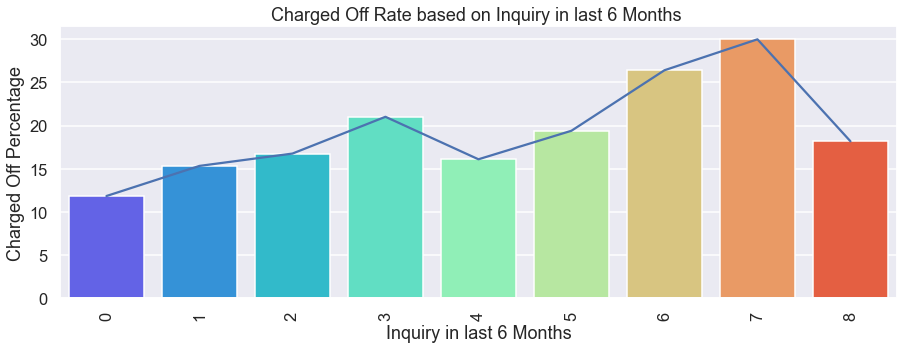

In [251]:
#Inquiry in Last 6 months against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'inq_last_6mths',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Inquiry in last 6 Months ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Inquiry in last 6 Months")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

- Those who had around 6 to 7 inquiries in last 6 months are more likely to default

- We can see that borrowers who defaults are more likely to make less inquiries as compared to fully paid 

loan_status  Charged Off  Current  Fully Paid  Total  Charged Off Rate
grade                                                                 
G                     72        2          66    140           51.4286
F                    217       15         317    549           39.5264
E                    567       40        1280   1887           30.0477
D                   1020       77        3365   4462           22.8597
C                   1290      134        6013   7437           17.3457
B                   1398      221        9933  11552           12.1018
A                    602       40        9412  10054            5.9877


loan_status  Charged Off     Current   Fully Paid         Total  \
count           7.000000    7.000000     7.000000      7.000000   
mean          738.000000   75.571429  4340.857143   5154.428571   
std           513.576025   77.650622  4174.757216   4612.570970   
min            72.000000    2.000000    66.000000    140.000000   
25%           392.000000

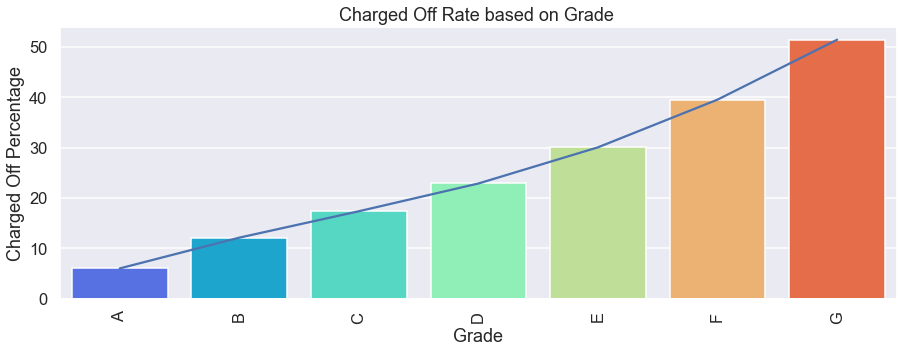

In [252]:
#Grade against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'grade',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Grade ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Grade")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

- As the grade increases the chances of charged off also increases. Top 3 grades which showed major charged off borrowers :

    - G - 51.43%
    - F - 39.5%
    - E - 30.05%

loan_status  Charged Off  Current  Fully Paid  Total  Charged Off Rate
sub_grade                                                             
G3                    14        0           6     20           70.0000
F5                    35        1          21     57           61.4035
G2                    22        0          17     39           56.4103
G5                     8        0           8     16           50.0000
G4                     9        0          10     19           47.3684
G1                    19        2          25     46           41.3043
F4                    36        2          53     91           39.5604
F2                    53        2          79    134           39.5522
F1                    62        6         103    171           36.2573
E4                    99        5         180    284           34.8592
E5                    77        3         145    225           34.2222
F3                    31        4          61     96           32.2917
E1    

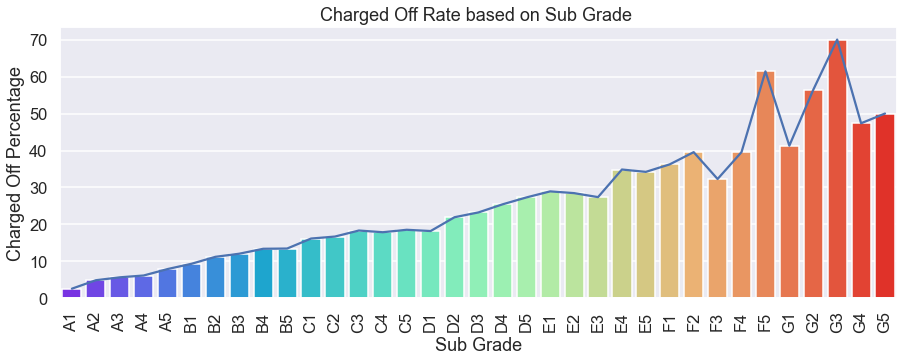

In [253]:
#Sub Grade against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'sub_grade',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Sub Grade ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Sub Grade")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

Top 3 Sub Grades are :

    - G3 - 70%
    - F5 - 61.4%
    - G2 - 56.4%

In [254]:
#Range of funded amount based on quartiles
data['funded_amt_range']=pd.qcut(data['funded_amnt'],q=4).astype('object').astype(str)

loan_status         Charged Off  Current  Fully Paid  Total  Charged Off Rate
funded_amt_range                                                             
(13000.0, 35000.0]         1566      133        6973   8672           18.0581
(499.999, 5000.0]          1331       96        8221   9648           13.7956
(8500.0, 13000.0]          1198      187        7825   9210           13.0076
(5000.0, 8500.0]           1071      113        7367   8551           12.5249


loan_status  Charged Off     Current   Fully Paid        Total  \
count           4.000000    4.000000     4.000000     4.000000   
mean         1291.500000  132.250000  7596.500000  9020.250000   
std           211.560078   39.508438   542.720001   507.132051   
min          1071.000000   96.000000  6973.000000  8551.000000   
25%          1166.250000  108.750000  7268.500000  8641.750000   
50%          1264.500000  123.000000  7596.000000  8941.000000   
75%          1389.750000  146.500000  7924.000000  9319.500000   
ma

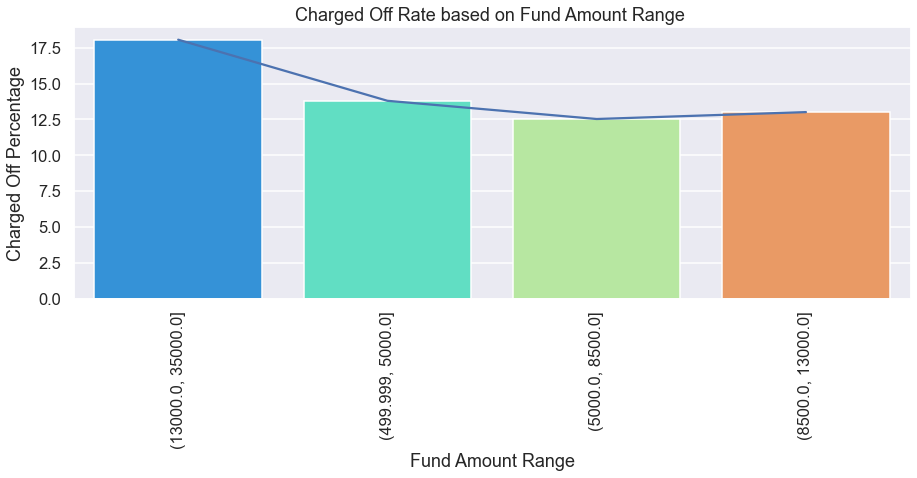

In [255]:
#Home ownership against charged off borrowers
df = data.pivot_table(values = 'funded_amnt',
                      index = 'funded_amt_range',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Fund Amount Range ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Fund Amount Range")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

Those who have received fund in range of 13000 to 35000 have majorly defaulted


loan_status       Charged Off  Current  Fully Paid  Total  Charged Off Rate
int_rate_range                                                             
(20.604, 24.4]            139       14          95    248           56.0484
(16.808, 20.604]          754       78        1398   2230           33.8117
(13.012, 16.808]         1891      150        7740   9781           19.3334
(9.216, 13.012]          1792      245       11929  13966           12.8312
(5.401, 9.216]            590       42        9224   9856            5.9862


loan_status  Charged Off     Current    Fully Paid         Total  \
count           5.000000    5.000000      5.000000      5.000000   
mean         1033.200000  105.800000   6077.200000   7216.200000   
std           772.264657   93.006451   5113.522436   5755.965271   
min           139.000000   14.000000     95.000000    248.000000   
25%           590.000000   42.000000   1398.000000   2230.000000   
50%           754.000000   78.000000   7740.000000   9781.

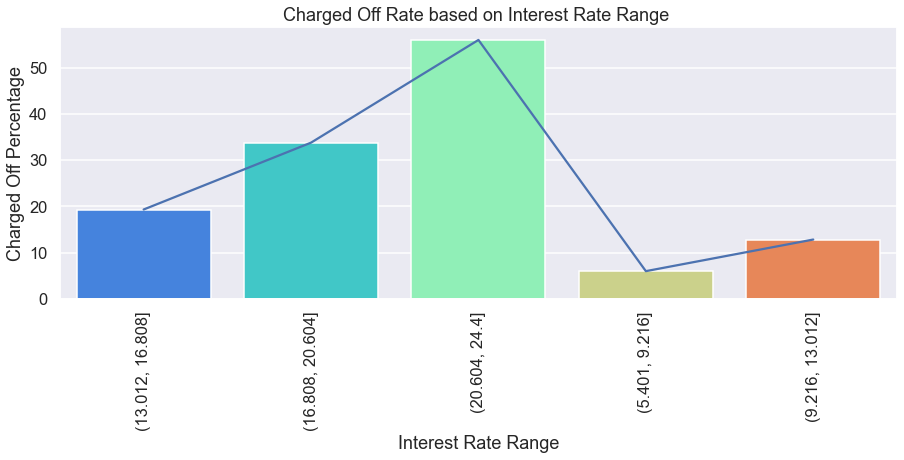

In [256]:
#Interest rate range against charged off borrowers
data['int_rate_range']=pd.cut(data['int_rate'],5).astype('object').astype(str)

df = data.pivot_table(values = 'funded_amnt',
                      index = 'int_rate_range',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Interest Rate Range ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Interest Rate Range")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

We see that thos who have got to pay interest rate between 20.60 to 24.4 , which is a very high interest rate , tend to get charged off

loan_status              Charged Off  Current  Fully Paid  Total  \
annual_inc_range                                                   
(19300.053, 44498.916]          1999      184        9379  11562   
(44498.916, 69572.412]          1743      185       10116  12044   
(69572.412, 94645.908]           826       98        5802   6726   
(119719.404, 144792.9]           308       23        2555   2886   
(94645.908, 119719.404]          290       39        2534   2863   

loan_status              Charged Off Rate  
annual_inc_range                           
(19300.053, 44498.916]            17.2894  
(44498.916, 69572.412]            14.4719  
(69572.412, 94645.908]            12.2807  
(119719.404, 144792.9]            10.6722  
(94645.908, 119719.404]           10.1292  


loan_status  Charged Off     Current    Fully Paid         Total  \
count           5.000000    5.000000      5.000000      5.000000   
mean         1033.200000  105.800000   6077.200000   7216.200000   
std      

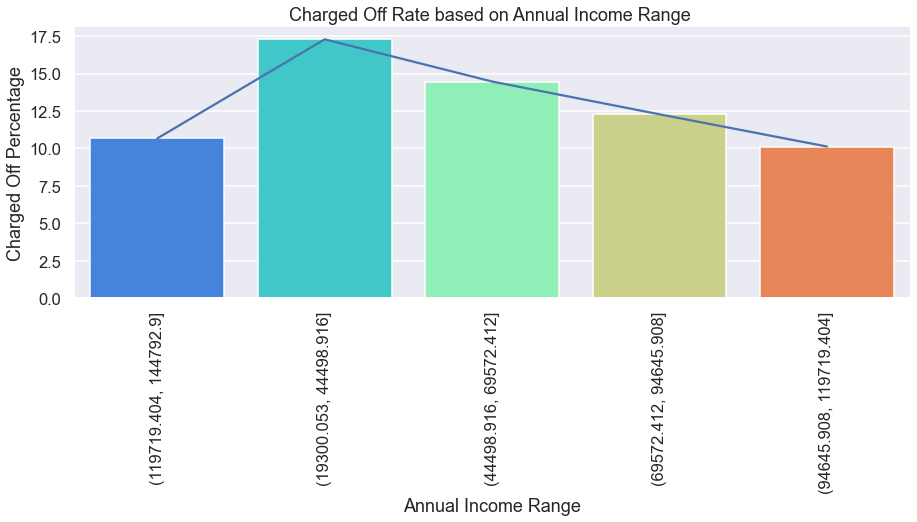

In [257]:
#Annual Income Range against charged off borrowers
data['annual_inc_range']=pd.cut(data['annual_inc'],5).astype('object').astype(str)

df = data.pivot_table(values = 'funded_amnt',
                      index = 'annual_inc_range',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Annual Income Range ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Annual Income Range")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

Those whose annual income fall in the range of 19300.053 to 44498.916 are more likely to get charged off

loan_status               Charged Off  Current  Fully Paid  Total  \
debt_range                                                          
(287558.696, 359448.37]             4        0          15     19   
(-359.448, 71889.674]            3248      314       18649  22211   
(143779.348, 215669.022]          279       25        1702   2006   
(71889.674, 143779.348]          1592      188        9725  11505   
(215669.022, 287558.696]           43        2         295    340   

loan_status               Charged Off Rate  
debt_range                                  
(287558.696, 359448.37]            21.0526  
(-359.448, 71889.674]              14.6234  
(143779.348, 215669.022]           13.9083  
(71889.674, 143779.348]            13.8375  
(215669.022, 287558.696]           12.6471  


loan_status  Charged Off     Current   Fully Paid        Total  \
count            5.00000    5.000000      5.00000      5.00000   
mean          1033.20000  105.800000   6077.20000   7216.20000   
s

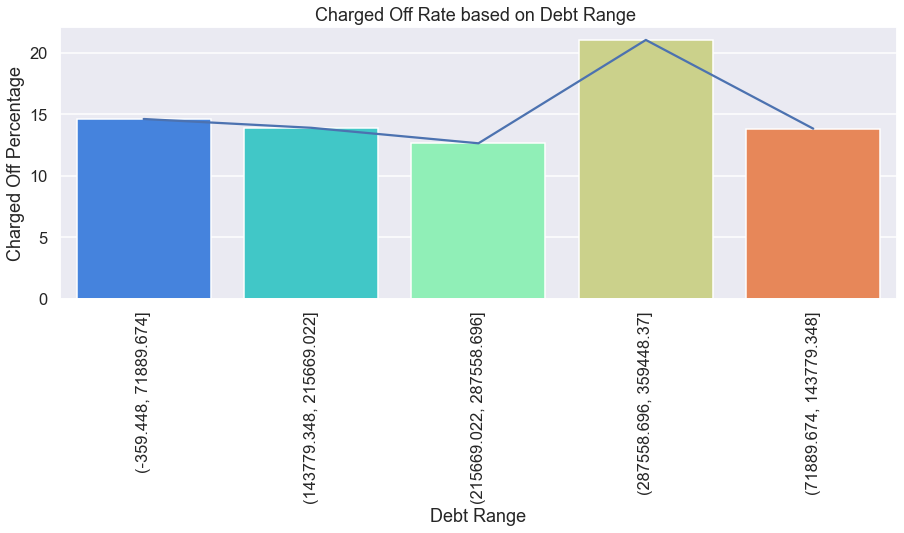

In [258]:
#Debt range against charged off borrowers
data['debt_range']=pd.cut(data['debt'],5).astype('object').astype(str)

df = data.pivot_table(values = 'funded_amnt',
                      index = 'debt_range',
                      columns = 'loan_status',
                      aggfunc = np.count_nonzero,
                      fill_value = 0,
                      margins = True,
                      margins_name = 'Total')
df['Charged Off Rate'] = 100*(round((df['Charged Off']/df['Total']), 6))
print(df.iloc[0:-1].sort_values(by = 'Charged Off Rate', ascending = False))
print('\n')
print(df.iloc[0:-1].describe())
print('\n')
X_data=df.iloc[0:-1].index
y_data=df.iloc[0:-1]['Charged Off Rate']
plt.figure(figsize=(15,5))
plt.title('Charged Off Rate based on Debt Range ')
sns.lineplot(data=y_data,estimator=np.median,palette='maroon')
sns.barplot(x=X_data,y=y_data,estimator=np.median,palette='rainbow')
plt.xlabel("Debt Range")
plt.ylabel("Charged Off Percentage")
plt.xticks(rotation=90)
plt.show()

Those whose debt amount is likely to be in the range of 287558.696 to 359448.37, are more likely to be charged off

### Bivariate Analysis

In [259]:
#Correlation
charged_off_df = data[data.loan_status == 'Charged Off'].corr().drop(labels = {'out_prncp', 'out_prncp_inv'})

charged_off_df.dropna(axis = 1, how = 'all', inplace = True)

charged_off_df

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,issue_yr,last_pymnt_yr,last_credit_pull_yr,last_pymnt_to_issue_Tenure,LC_pull_to_issue_Tenure,LC_pull_to_pymnt_Tenure,funded_to_applied_amt_diff,funded_inv_to_applied_amt_diff,funded_inv_to_funded_amt_diff,total_inst,balance_amt_of_charged_off,installment_to_income,debt
loan_amnt,1.000000,0.975421,0.876522,0.307762,0.252937,0.916229,0.414006,0.053009,-0.035579,0.011975,0.189403,-0.034730,0.339713,-0.000053,0.268602,0.576791,0.519330,0.420147,0.642189,0.045978,0.268458,0.139502,0.395194,-0.016812,0.043458,-0.040033,0.069756,-0.088037,0.046846,0.085078,-0.329444,-0.395434,-0.280257,0.959312,0.812247,0.550642,0.329881
funded_amnt,0.975421,1.000000,0.899076,0.287038,0.255250,0.949343,0.405290,0.048136,-0.033452,0.011410,0.184107,-0.039236,0.323546,0.004180,0.257623,0.595410,0.537898,0.440810,0.652523,0.051782,0.272806,0.146542,0.405140,-0.021611,0.056594,-0.032588,0.062735,-0.089142,0.034568,0.074377,-0.113300,-0.301571,-0.286297,0.977626,0.823373,0.586262,0.318450
funded_amnt_inv,0.876522,0.899076,1.000000,0.346083,0.270809,0.820153,0.351625,0.063632,-0.037063,-0.022799,0.151393,-0.038935,0.273754,0.025986,0.231930,0.558124,0.631061,0.398913,0.640334,0.016077,0.258301,0.119858,0.343527,-0.015080,0.277642,0.140652,0.079931,-0.045162,-0.044727,-0.019254,-0.099812,0.095521,0.162065,0.894666,0.745879,0.508762,0.288963
term,0.307762,0.287038,0.346083,1.000000,0.407857,0.032305,0.054741,0.047700,-0.010778,0.001358,0.047804,0.002900,0.051472,0.007009,0.093052,0.107743,0.154263,-0.081927,0.422868,-0.063645,0.090404,-0.017473,0.013720,0.029019,0.329772,0.302096,0.098151,0.122568,-0.050103,-0.104620,-0.157778,0.023934,0.110447,0.413433,0.431153,-0.020120,0.076054
int_rate,0.252937,0.255250,0.270809,0.407857,1.000000,0.230690,0.109129,0.025203,0.126326,0.071457,-0.002542,0.089879,0.051866,0.361300,-0.049191,0.090203,0.109121,-0.107041,0.398793,0.026399,0.107636,0.049869,0.085379,0.086361,0.140027,0.054853,-0.041811,-0.043765,-0.099806,-0.070308,-0.046778,-0.006323,0.017354,0.375053,0.395468,0.125907,0.116356
installment,0.916229,0.949343,0.820153,0.032305,0.230690,1.000000,0.417584,0.031985,-0.020795,0.020500,0.179433,-0.029066,0.325872,0.037481,0.232785,0.603113,0.525024,0.495909,0.579002,0.086456,0.253315,0.167902,0.424820,-0.017922,-0.052969,-0.125234,0.035882,-0.119787,0.056630,0.109257,-0.063460,-0.329760,-0.344845,0.895024,0.720399,0.629943,0.314719
annual_inc,0.414006,0.405290,0.351625,0.054741,0.109129,0.417584,1.000000,-0.072821,0.031797,0.059427,0.293843,0.016985,0.465256,0.078122,0.379182,0.286168,0.250869,0.215988,0.270899,0.063244,0.160358,0.096566,0.193470,0.018010,-0.049843,-0.065073,0.057805,-0.043858,0.075901,0.090467,-0.130137,-0.185197,-0.143962,0.387084,0.296975,-0.315798,0.633696
dti,0.053009,0.048136,0.063632,0.047700,0.025203,0.031985,-0.072821,1.000000,-0.069856,-0.023906,0.304008,0.012782,0.304207,0.226538,0.269157,0.010159,0.021306,-0.016876,0.050171,-0.054365,0.017034,-0.000030,0.000484,0.025990,0.092418,0.044273,0.093144,-0.018355,0.047700,0.052437,-0.032758,0.011798,0.030763,0.061073,0.067006,0.065082,0.638592
delinq_2yrs,-0.035579,-0.033452,-0.037063,-0.010778,0.126326,-0.020795,0.031797,-0.069856,1.000000,-0.014148,-0.020260,0.001136,-0.099356,-0.100628,0.060192,-0.027265,-0.034516,-0.048380,-0.003545,0.032638,0.017390,0.026452,-0.006602,0.003591,0.014613,0.004414,-0.016078,-0.006278,-0.021435,-0.016597,0.017088,0.002855,-0.005714,-0.017138,-0.004744,-0.038915,-0.033730
inq_last_6mths,0.011975,0.011410,-0.022799,0.001358,0.071457,0.020500,0.059427,-0.023906,-0.014148,1.000000,0.087340,0.010243,-0.019126,-0.130585,0.108214,-0.055372,-0.076856,-0.058507,-0.029042,0.024535,-0.020595,-0.010441,0.007872,0.005559,-0.0

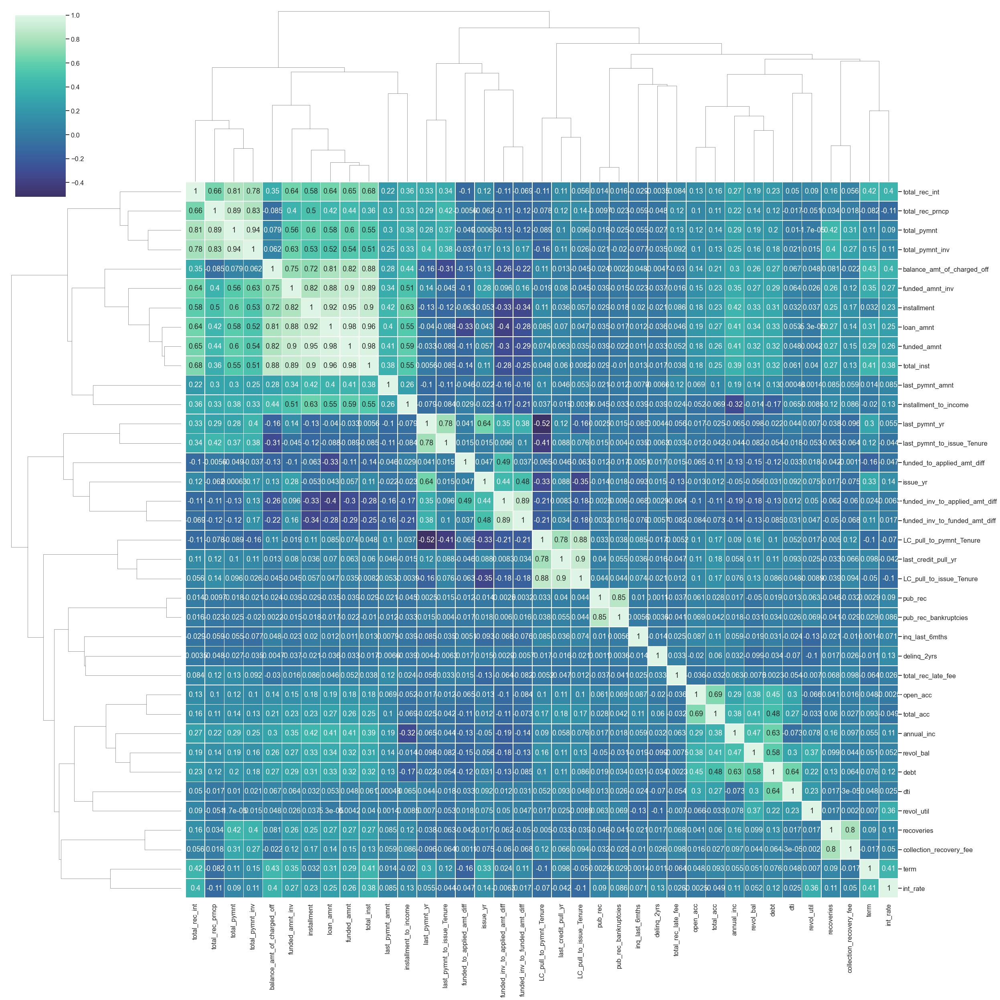

In [260]:
#Cluster Heatmap of correlation
sns.clustermap(charged_off_df, center = 0, cmap = 'mako', linewidths = 0.75, figsize = (35, 35), annot=True)
plt.show()

- For charged off borrowers we can see small clusters formulating :

    - Total Received Interest, Total Received Principal, Total Payment & Total Payment Investors have high positive correlation. It states that Any increase in one of these KPIs increases the total received interest. We have seen above that those who are charged off borrowers have paid less principal amount, hence the aim of lender should be to disburse lesser loan amount so that the principal amount is less and so does the total interest , which does not become heavy on their income chest. 
    
    - Total Received Interest, Funded Amount Investor, Installment, Loan Amount, Funded Amount and Total Installment forms a cluster of high positive correlation. Any increase in any of these KPI increases the total received interest . Though there is no significant difference of total received interest on loan status . We know that average amount funded for borrowers who are charged off are high in comparison to fully paid. Hence given the annual income which is low for such borrowers, large funding amount takes a larger chunk of their income. Hence lender should fund lesser amount in respect to their income , which will decrease the total received interest. Or they can offer loan on lesser interest rate also .
    
    - Balance amount of charged off borrower, funded amount investor, installment, loan amount, funded amount, total installment formulates one cluster of high positive correlation. Lender should aim at reducing the balance amount , hence they shoudl reduce the funded amount which would further reduce the installment and total installment . Addressing these KPIs is quite vital for the lender.
    
    

<Figure size 720x720 with 0 Axes>

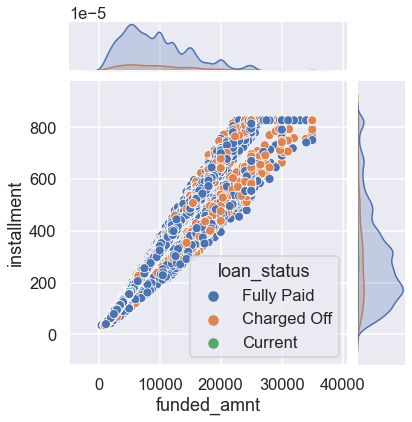

In [261]:
#Finding Relationship between funded amount and installment based on loan status
plt.figure(figsize=(10,10))
sns.jointplot(data=data,x='funded_amnt',y='installment',hue='loan_status')
plt.show()

- There is a linear positive relationship between installment and funded amount. We see the charged off customers are having high funded amount and high installments in majority.

<Figure size 720x720 with 0 Axes>

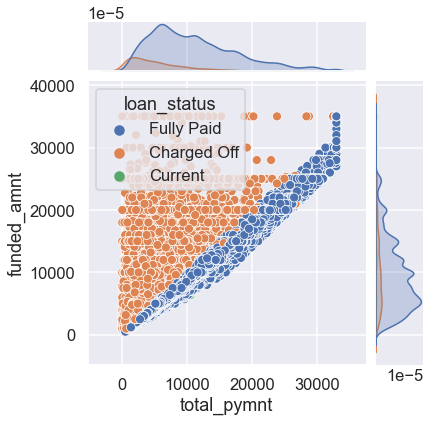

In [262]:
#Finding Relationship between Total Payment and installment based on loan status
plt.figure(figsize=(10,10))
sns.jointplot(data=data,x='total_pymnt',y='funded_amnt',hue='loan_status')
plt.show()

- We can clearly seperate charged off customers while comparing funded amount and total payment. We can see majority of customers are having maid lower total payment and havig high funded amount

<Figure size 720x720 with 0 Axes>

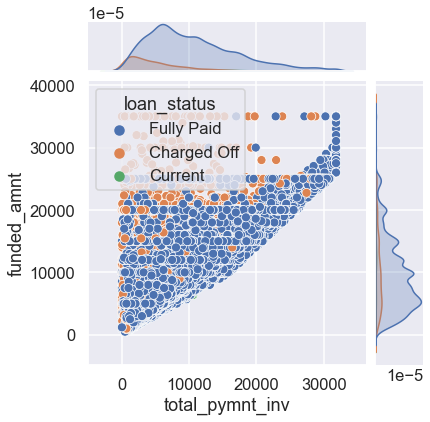

In [263]:
#Finding Relationship between funded amount and Total Payment to Investor based on loan status
plt.figure(figsize=(10,10))
sns.jointplot(data=data,x='total_pymnt_inv',y='funded_amnt',hue='loan_status')
plt.show()

- We can clearly see that total payment investors have majority of fully paid, there is a slight positive correlation

<Figure size 720x720 with 0 Axes>

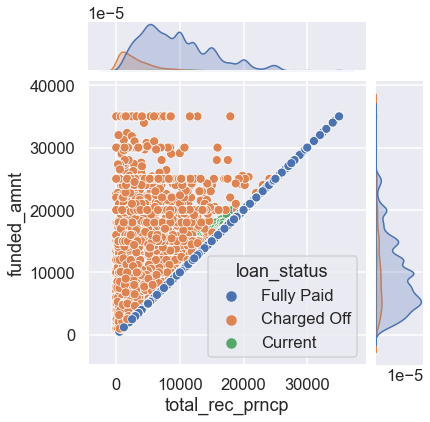

In [264]:
#Finding Relationship between funded amount and Total Received Principal based on loan status
plt.figure(figsize=(10,10))
sns.jointplot(data=data,x='total_rec_prncp',y='funded_amnt',hue='loan_status')
plt.show()

- We can clearly seperate charged off borrowers from the fully paid . There is a linear realtion. We can see that there are maximum charged off borrowers who have paid lesser principal amount and have moderately high funding amount.

Text(0.5, 1.0, 'Loans issued by Region')

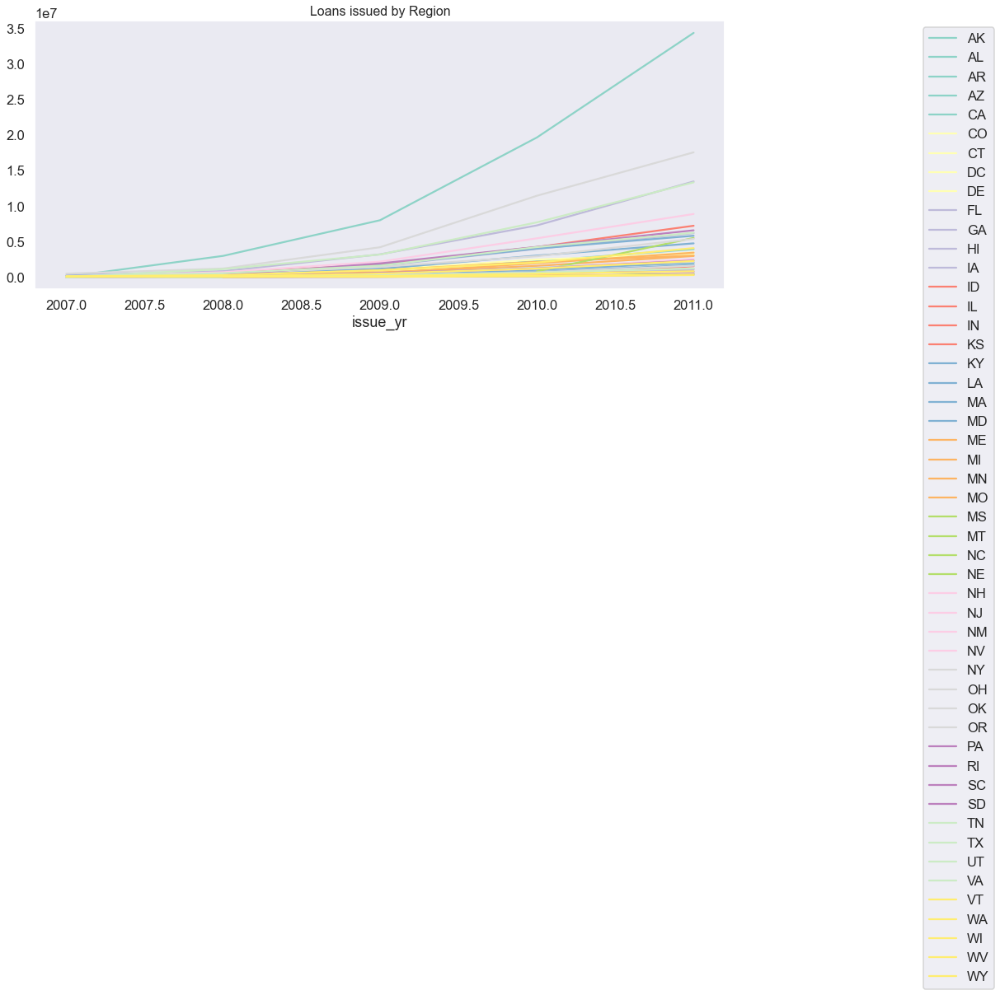

In [265]:
#Loan Issued to different states by issue year
cmap = plt.cm.Set3

by_issued_amount = data.groupby(['issue_yr', 'addr_state']).loan_amnt.sum()
by_issued_amount.unstack().plot(stacked=False, colormap=cmap, grid=False, legend=True, figsize=(15,6))
plt.legend(loc='upper right',bbox_to_anchor=(1.4, 1))
plt.title('Loans issued by Region', fontsize=16)

- We see that over the period of time people in alaska have been tending to increase debt

#### Custom function for chi-square test

In [266]:
def chi_test(df,x,y,drop_level=None,axis=None,alpha=.5):
    contingency_table=pd.crosstab(df[x],df[y])
    if drop_level is not None:
        contingency_table.drop(drop_level,axis=axis,inplace=True)
        contingency_table=contingency_table.T
        ov=contingency_table.values
        ev=stats.chi2_contingency(contingency_table)[3]
        no_rows=contingency_table.shape[0]
        no_cols=contingency_table.shape[1]
        dof=(no_rows-1)*(no_cols-1)
        alpha=alpha
        chi_square=sum([(o-e)**2./e for o,e in zip(ov,ev)])
        chi_stats=chi_square[0]+chi_square[1]
        print("chi-square-statistics : ",chi_stats)
        print("\n")
        critical_value=stats.chi2.ppf(q=1-alpha,df=dof)
        print("Critical Value :",critical_value)
        print("\n")
        p_value=1-stats.chi2.cdf(x=chi_stats,df=dof)
        print("p-value",p_value)
        print("Significance Level",alpha)
        print("Degree of Freedom",dof)
        print("\n")
        if(p_value<=alpha):
            print('Reject H0,There is relationship between {0} & {1}'.format(x,y))
        
        else:
            print('Retain HO, There is no relationship between {0} & {1}'.format(x,y))
    else:
        contingency_table=contingency_table.T
        ov=contingency_table.values
        ev=stats.chi2_contingency(contingency_table)[3]
        no_rows=contingency_table.shape[0]
        no_cols=contingency_table.shape[1]
        dof=(no_rows-1)*(no_cols-1)
        alpha=alpha
        chi_square=sum([(o-e)**2./e for o,e in zip(ov,ev)])
        chi_stats=chi_square[0]+chi_square[1]
        print("chi-square-statistics : ",chi_stats)
        print("\n")
        critical_value=stats.chi2.ppf(q=1-alpha,df=dof)
        print("Critical Value :",critical_value)
        print("\n")
        p_value=1-stats.chi2.cdf(x=chi_stats,df=dof)
        print("p-value",p_value)
        print("Significance Level",alpha)
        print("Degree of Freedom",dof)
        print("\n")
        if(p_value<=alpha):
            print('Reject H0,There is relationship between {0} & {1}'.format(x,y))
        
        else:
            print('Retain HO, There is no relationship between {0} & {1}'.format(x,y))
    

# Testing Hypothesis 

In [267]:
data.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies,issue_yr,last_pymnt_yr,last_credit_pull_yr,last_pymnt_to_issue_Tenure,LC_pull_to_issue_Tenure,LC_pull_to_pymnt_Tenure,funded_to_applied_amt_diff,funded_inv_to_applied_amt_diff,funded_inv_to_funded_amt_diff,total_inst,balance_amt_of_charged_off,installment_to_income,debt,funded_amt_range,int_rate_range,annual_inc_range,debt_range
0,5000,5000,4975.0,36,10.65,162.87,B,B2,us army,10+ years,RENT,24000.00,Verified,dec-11,Fully Paid,credit_card,computer,860xx,AZ,27.65,0,jan-85,1,3.0,0,13648.0,83.7,9,0.00,0.00,5863.16,5833.84,5000.00,863.16,0.00,0.00,0.00,jan-15,171.62,0,may-16,0.0,2011,2015,2016,4,5,1,0,-25.0,-25.0,5863.32,0.16,8.14,55300.00,"(499.999, 5000.0]","(9.216, 13.012]","(19300.053, 44498.916]","(-359.448, 71889.674]"
1,2500,2500,2500.0,60,15.27,59.83,C,C4,ryder,< 1 year,RENT,30000.00,Source Verified,dec-11,Charged Off,car,bike,309xx,GA,1.00,0,apr-99,5,3.0,0,1687.0,9.4,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,apr-13,119.66,0,sep-13,0.0,2011,2013,2013,2,2,0,0,0.0,0.0,3589.80,2581.09,2.39,2500.00,"(499.999, 5000.0]","(13.012, 16.808]","(19300.053, 44498.916]","(-359.448, 71889.674]"
2,2400,2400,2400.0,36,15.96,84.33,C,C5,us army,10+ years,RENT,19425.42,Not Verified,dec-11,Fully Paid,small_business,real estate business,606xx,IL,8.72,0,nov-01,2,3.0,0,2956.0,98.5,10,0.00,0.00,3005.67,3005.67,2400.00,605.67,0.00,0.00,0.00,jun-14,649.91,0,may-16,0.0,2011,2014,2016,3,5,2,0,0.0,0.0,3035.88,30.21,5.21,14115.81,"(499.999, 5000.0]","(13.012, 16.808]","(19300.053, 44498.916]","(-359.448, 71889.674]"
3,10000,10000,10000.0,36,13.49,339.31,C,C1,air resources board,10+ years,RENT,49200.00,Source Verified,dec-11,Fully Paid,other,personel,917xx,CA,20.00,0,feb-96,1,10.0,0,5598.0,21.0,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,jan-15,357.48,0,apr-16,0.0,2011,2015,2016,4,5,1,0,0.0,0.0,12215.16,-16.73,8.28,82000.00,"(8500.0, 13000.0]","(13.012, 16.808]","(44498.916, 69572.412]","(71889.674, 143779.348]"
4,3000,3000,3000.0,60,12.69,67.79,B,B5,university medical group,1 year,RENT,80000.00,Source Verified,dec-11,Current,other,personal,972xx,OR,17.94,0,jan-96,0,15.0,0,27783.0,53.9,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,may-16,67.79,Jun-16,may-16,0.0,2011,2016,2016,5,5,0,0,0.0,0.0,4067.40,554.07,1.02,119600.00,"(499.999, 5000.0]","(9.216, 13.012]","(69572.412, 94645.908]","(71889.674, 143779.348]"


In [268]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','term',drop_level='Current',axis=0)

chi-square-statistics :  1313.2829718969988


Critical Value : 0.454936423119572


p-value 0.0
Significance Level 0.5
Degree of Freedom 1


Reject H0,There is relationship between loan_status & term


In [269]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','grade',drop_level='Current',axis=0)

chi-square-statistics :  1795.1437853349669


Critical Value : 5.348120627447118


p-value 0.0
Significance Level 0.5
Degree of Freedom 6


Reject H0,There is relationship between loan_status & grade


In [270]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','sub_grade',drop_level='Current',axis=0)

chi-square-statistics :  1921.0832537610163


Critical Value : 33.33570736747922


p-value 0.0
Significance Level 0.5
Degree of Freedom 34


Reject H0,There is relationship between loan_status & sub_grade


In [271]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','purpose',drop_level='Current',axis=0)

chi-square-statistics :  384.8367887400213


Critical Value : 12.339755882563905


p-value 0.0
Significance Level 0.5
Degree of Freedom 13


Reject H0,There is relationship between loan_status & purpose


In [272]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','emp_length',drop_level='Current',axis=0)

chi-square-statistics :  32.75543957812889


Critical Value : 9.34181776559197


p-value 0.00029939284253155396
Significance Level 0.5
Degree of Freedom 10


Reject H0,There is relationship between loan_status & emp_length


In [273]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','home_ownership',drop_level='Current',axis=0)

chi-square-statistics :  18.717531098311635


Critical Value : 2.3659738843753377


p-value 0.00031273849679158694
Significance Level 0.5
Degree of Freedom 3


Reject H0,There is relationship between loan_status & home_ownership


In [274]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','verification_status',drop_level='Current',axis=0)

chi-square-statistics :  89.96762699965606


Critical Value : 1.386294361119891


p-value 0.0
Significance Level 0.5
Degree of Freedom 2


Reject H0,There is relationship between loan_status & verification_status


In [275]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','addr_state',drop_level='Current',axis=0)

chi-square-statistics :  161.12030534216728


Critical Value : 48.33496994010476


p-value 7.138734048339757e-14
Significance Level 0.5
Degree of Freedom 49


Reject H0,There is relationship between loan_status & addr_state


In [276]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','delinq_2yrs',drop_level='Current',axis=0)

chi-square-statistics :  22.562117325291794


Critical Value : 9.34181776559197


p-value 0.012483524937012214
Significance Level 0.5
Degree of Freedom 10


Reject H0,There is relationship between loan_status & delinq_2yrs


In [277]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','inq_last_6mths',drop_level='Current',axis=0)

chi-square-statistics :  233.24872916102257


Critical Value : 7.344121497701794


p-value 0.0
Significance Level 0.5
Degree of Freedom 8


Reject H0,There is relationship between loan_status & inq_last_6mths


In [278]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','pub_rec_bankruptcies',drop_level='Current',axis=0)

chi-square-statistics :  85.58941785694145


Critical Value : 1.386294361119891


p-value 0.0
Significance Level 0.5
Degree of Freedom 2


Reject H0,There is relationship between loan_status & pub_rec_bankruptcies


In [279]:
#Chi-Square test to find relationship between term and loan status
chi_test(data,'loan_status','last_pymnt_to_issue_Tenure',drop_level='Current',axis=0)

chi-square-statistics :  3629.5834865099037


Critical Value : 7.344121497701794


p-value 0.0
Significance Level 0.5
Degree of Freedom 8


Reject H0,There is relationship between loan_status & last_pymnt_to_issue_Tenure


# Summary

- Approximately 14% of the borrowers are charged off and 84% are fully paid.

- Around 79% of borrowers have taken 36 months term period and 21% have taken 60 months term period

- Maximum number of loans are borrowed for debt consolidation purpose.

- Number of loans issued by Lending club were gradually increased every year. Highest loans were issued in 2011. 

- Maximum borrowers are issued loans of grades B, followed by grade A.

- Rent and mortgage types of home ownership are the highest loans issued categories. 

- When there is a high rate of interest, then the higher number of defaulted customers are noted.

- Fully Paid 75% borrowers had interest rate below 13.49% which means that loans with lower interest rates have high chance getting fully paid.

- ‘G’ and ‘F’ grade loans are the riskiest while ‘A’ and ‘B’ grade loans represent the lowest risk

- Top 3 Sub Grades which have the highest risk of getting default are : G3, F5 and G2

- The highest number of loans are defaulted when taken for small business purpose followed by renewable energy!

- The loans which are given for CA, FL and NY state’s borrowers are defaulted more than other states!

-  Borrowers whose annual income fall in the range of 19300 to 44499 are more likely to get charged off which indicates lower income levels are the riskiest. 

- Borrowers who have higher debt amount are more likely to be charged off .


# Conclusion

Lending club can reduce the charged off customers by considering below points:
- Reducing the high interest rates.

- Do aggressive verification of the loan applicants for small business purpose , renewable energy.

- Proper review of information from borrowers before approving grade G and F loans and particularly for G3, F5 and G2 sub grade loans.

- Reducing the number of approved loans for borrowers who are from states CA, FL and NY or funding loans of lesser amount after verification, as the reason is most of the charged off borrowers are not verified.

- Reducing the loan approvals for borrowers whose annual income is low and debt is high.


In [280]:
jovian.commit()


<IPython.core.display.Javascript object>

[jovian] Updating notebook "himanshubirla-91/lending-club" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/himanshubirla-91/lending-club


'https://jovian.ai/himanshubirla-91/lending-club'